Walkforward: Deep Learning Framework for Option Pricing
Author: Kyle Rytand Bistrain
Date: September 2025

Walk Forward Model with early stoppage


Choices:

- Call vs Put

- Historical Volatility 

- rolling average


Imports

In [ ]:
import pandas as pd
import numpy as np
from datetime import timedelta
from dateutil.relativedelta import relativedelta
from scipy.stats import norm
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import copy
from scipy import stats
import statsmodels.api as sm
from IPython.display import display
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from plotnine import *

BSM Model Black Scholes with Call Function

In [ ]:
def bs_call_price(S, K, r, T, sigma, q=0.0):
    """
    Calculate Black-Scholes price for a European Call option with continuous dividend yield.
    """
    sigma = np.maximum(sigma, 1e-12)
    sqrtT = np.sqrt(T)
    d1 = (np.log(S / K) + (r - q + 0.5 * sigma ** 2) * T) / (sigma * sqrtT)
    d2 = d1 - sigma * sqrtT
    return S * np.exp(-q * T) * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)


In [ ]:
def bs_put_price(S, K, r, T, sigma, q=0.0):
    """
    Calculate Black-Scholes price for a European Put option with continuous dividend yield.
    """
    
    sigma = np.maximum(sigma, 1e-12)
    sqrtT = np.sqrt(T)
    d1 = (np.log(S / K) + (r - q + 0.5 * sigma ** 2) * T) / (sigma * sqrtT)
    d2 = d1 - sigma * sqrtT
    return K * np.exp(-r * T) * norm.cdf(-d2) - S * np.exp(-q * T) * norm.cdf(-d1)

HLN DM Test for Forecast Error Test

In [ ]:
def hln_dm_test_corrected(loss_diff_series, h=1):
    """
    Performs the Harvey, Leybourne, and Newbold adjusted
    Diebold-Mariano test 
    """
   
    if loss_diff_series.empty:
        return np.nan, np.nan
        
    T = len(loss_diff_series)
    
    # Regress the loss differential on a constant to get the DM statistic
    # Regress the loss differential on a constant (intercept)
    model = sm.OLS(loss_diff_series, sm.add_constant(np.ones(T)))

    # Fit the model with HAC standard errors
    results = model.fit(cov_type="HAC", cov_kwds={"maxlags": int(T**0.25)})

    # The t-statistic of the intercept is the DM statistic
    dm_statistic = results.tvalues[0]
    
    
    # Apply the HLN small-sample adjustment
    adjustment_factor = np.sqrt((T + 1 - 2*h + h*(h-1)/T) / T)
    dm_adj_stat = dm_statistic * adjustment_factor
    
    # Calculate the p-value using a t-distribution
    p_value = 2 * stats.t.sf(np.abs(dm_adj_stat), df=T-1)
    
    return dm_adj_stat, p_value

In [5]:
merged_df3 = pd.read_csv("/Users/kylebistrain/Documents/STATISTICS MASTERS/Thesis Code/merged_df3.csv", parse_dates=["expiration","quotedate"])
merged_df6 = pd.read_csv("/Users/kylebistrain/Documents/STATISTICS MASTERS/Thesis Code/merged_df6.csv", parse_dates=["expiration","quotedate"])
merged_df1 = pd.read_csv("/Users/kylebistrain/Documents/STATISTICS MASTERS/Thesis Code/merged_df1.csv", parse_dates=["expiration","quotedate"])

In [ ]:
import pandas as pd
import numpy as np

def prepare_options_data(df, tenure):
    """
    Processes and standardizes an options DataFrame.
    """
    df = df.copy()

   
    numeric_cols = [
        "underlying_last", "strike", "T", "impliedvol", "continuous_dividend_rate", "is_ex_date", "days_until_ex_date",
        "bid", "ask", "IVAsk", "IVBid", "optionroot", "Close",
        "DGS3MO", "DGS6MO", "DGS1", # All possible interest rate columns
        "logvol63_annual", "logvol126_annual", "logvol252_annual" # All possible vol columns
    ]
    
    for c in numeric_cols:
        if c in df.columns: # Check if the column exists before trying to convert
            df[c] = pd.to_numeric(df[c], errors="coerce")

    # Convert date columns to datetime objects
    df["expiration"] = pd.to_datetime(df["expiration"])
    df["quotedate"]  = pd.to_datetime(df["quotedate"])

    # Create Standardized Columns
    df["S"] = df["underlying_last"]
    df["K"] = df["strike"]

    #  Mapping based on expiration 
    if tenure == '3m':
        df["r"] = df["DGS3MO"]
        df["sigma_realized"] = df["logvol63_annual"]
    elif tenure == '6m':
        df["r"] = df["DGS6MO"]
        df["sigma_realized"] = df["logvol126_annual"]
    elif tenure == '1y':
        df["r"] = df["DGS1"]
        df["sigma_realized"] = df["logvol252_annual"]
    else:
        raise ValueError("Invalid tenure specified. Please use '3m', '6m', or '1y'.")

    # Calculate Derived Features 
    df["p_price"] = (df["bid"] + df["ask"]) / 2
    df["moneyness"] = (df["S"] / df["K"]) - 1
    df["IV_mid"] = (df["IVAsk"] + df["IVBid"]) / 2
    df["vol_vix"] = df['Close'] / 100
    
    return df

df = prepare_options_data(merged_df3, tenure='3m')




Walkforward Multilayer Perceptron Model with Early Stoppage 

10 months (.8 train and .2 val with no shuffling) 
2 months test

In [ ]:
import pandas as pd


COLS_TO_KEEP = [
    "S","K","r","T","sigma_realized","volume","openinterest",
    "p_price","quotedate","moneyness",
    "IV_mid","continuous_dividend_rate","is_ex_date","vol_vix","days_until_ex_date","black_scholes"
]


# Filter Data and Calculate Black-Scholes Price 

call_options_df = df[df["type"] == "call"].copy()
# put_options_df = df[df["type"] == "put"].copy()


call_options_df["black_scholes"] = bs_call_price(
    call_options_df["S"],
    call_options_df["K"],
    call_options_df["r"],
    call_options_df["T"],
    call_options_df["vol_vix"],    # change to sigma_realized for historical realized and vol_vix for IV
    call_options_df["continuous_dividend_rate"]
)

# put_options_df["black_scholes"] = bs_put_price(
#     put_options_df["S"],
#     put_options_df["K"],
#     put_options_df["r"],
#     put_options_df["T"],
#     put_options_df["vol_vix"],    # change to sigma_realized for historical realized and vol_vix for IV
#     put_options_df["continuous_dividend_rate"]
# )


final_filter = (
    call_options_df["moneyness"].between(-0.5, 0.5) &
    call_options_df["black_scholes"].notna()
    # put_options_df["moneyness"].between(-0.5, 0.5) &
    # put_options_df["black_scholes"].notna()
)

# Apply the mask, select columns, and drop any remaining nulls
run = call_options_df.loc[final_filter, COLS_TO_KEEP].dropna()
# run = put_options_df.loc[final_filter, COLS_TO_KEEP].dropna()

print(call_options_df.loc[final_filter, COLS_TO_KEEP].dropna())
# print(put_options_df.loc[final_filter, COLS_TO_KEEP].dropna())

first_date, last_date = pd.Timestamp("2012-02-14"), pd.Timestamp("2024-05-31")
train_months, test_months = 12, 2
n_epochs   = 500
atm_thresh = 0.01
features = ["S","K","r","T","vol_vix","continuous_dividend_rate","is_ex_date","days_until_ex_date"]         # change for risk free interest rate added moneyness *** also use vol_vix for implied vol
target     = "p_price"

             S      K         r         T  sigma_realized  volume  \
1       135.19  116.0  0.001200  0.261905        0.177670       0   
3       135.19  117.0  0.001200  0.261905        0.177670       0   
5       135.19  118.0  0.001200  0.261905        0.177670       0   
7       135.19  119.0  0.001200  0.261905        0.177670       0   
9       135.19  120.0  0.001200  0.261905        0.177670       0   
...        ...    ...       ...       ...             ...     ...   
393839  522.61  445.0  0.054231  0.253968        0.111414       1   
393841  522.61  450.0  0.054231  0.253968        0.111414       1   
393843  522.61  455.0  0.054231  0.253968        0.111414       0   
393845  522.61  458.0  0.054231  0.253968        0.111414       2   
393847  522.61  459.0  0.054231  0.253968        0.111414       1   

        openinterest  p_price  quotedate  moneyness   IV_mid  \
1                  2   20.045 2012-02-14   0.165431  0.27155   
3               6010   19.115 2012-02-14   

[Fold 1] stop at epoch 132


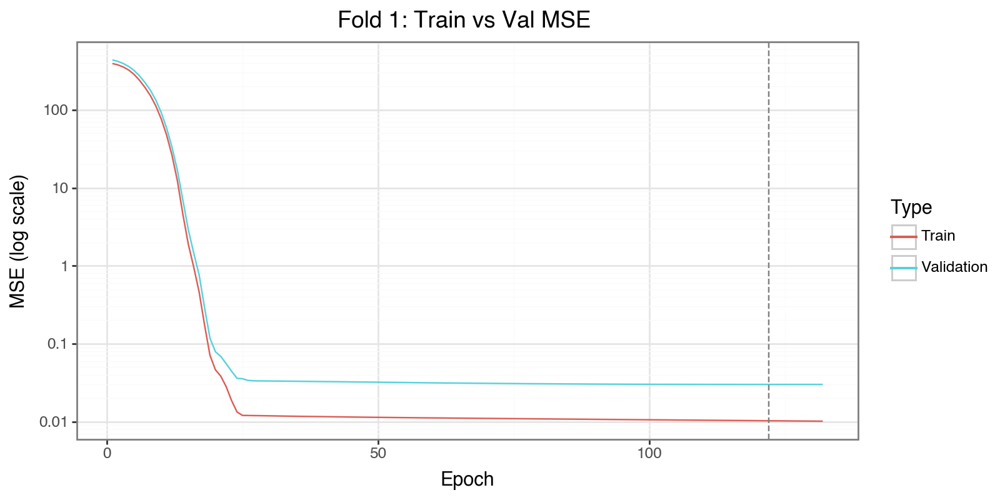

[Fold 2] stop at epoch 383


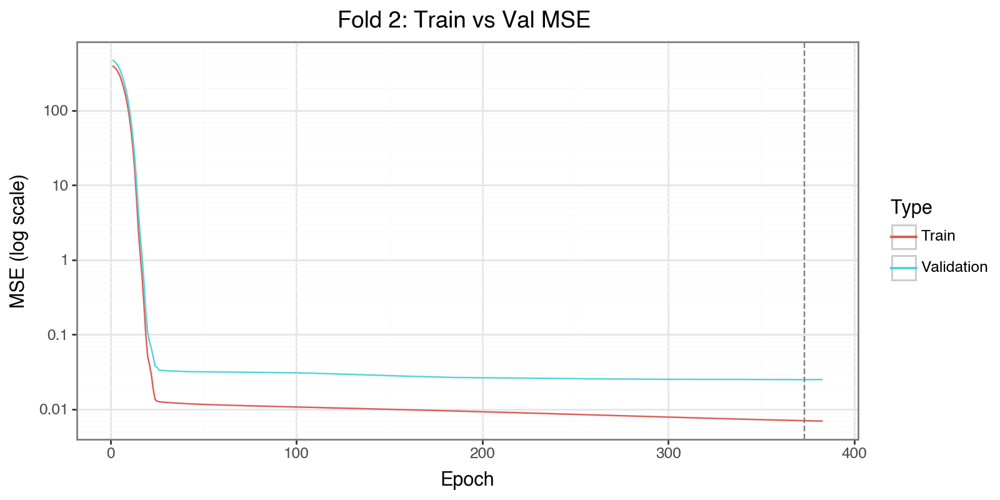

[Fold 3] stop at epoch 35


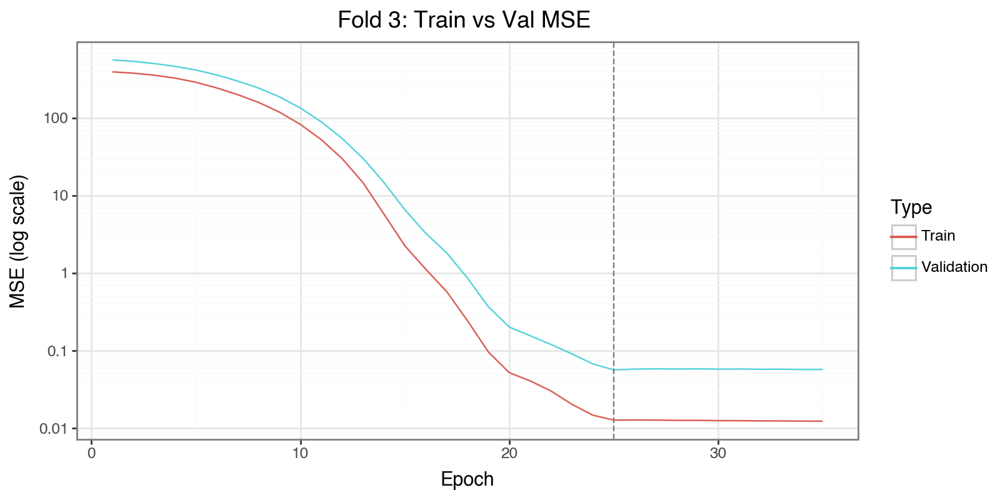

[Fold 4] stop at epoch 172


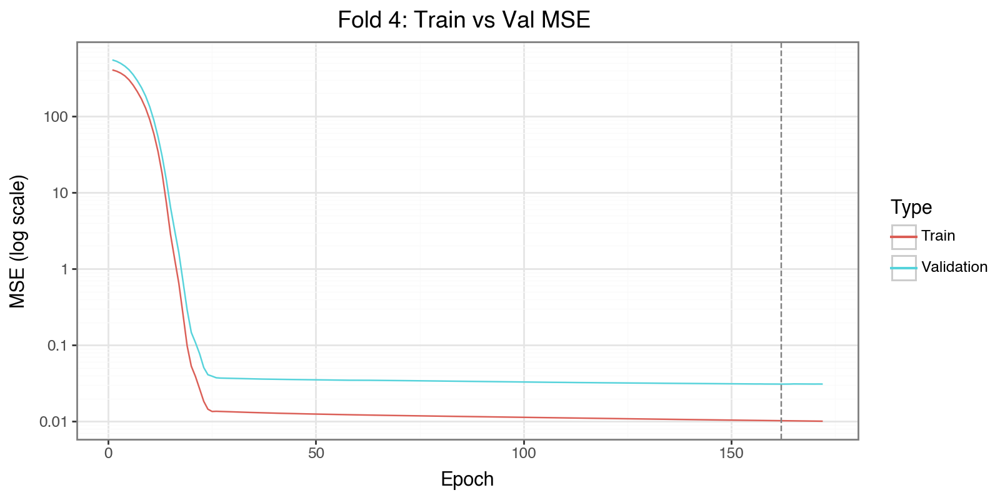

[Fold 5] stop at epoch 406


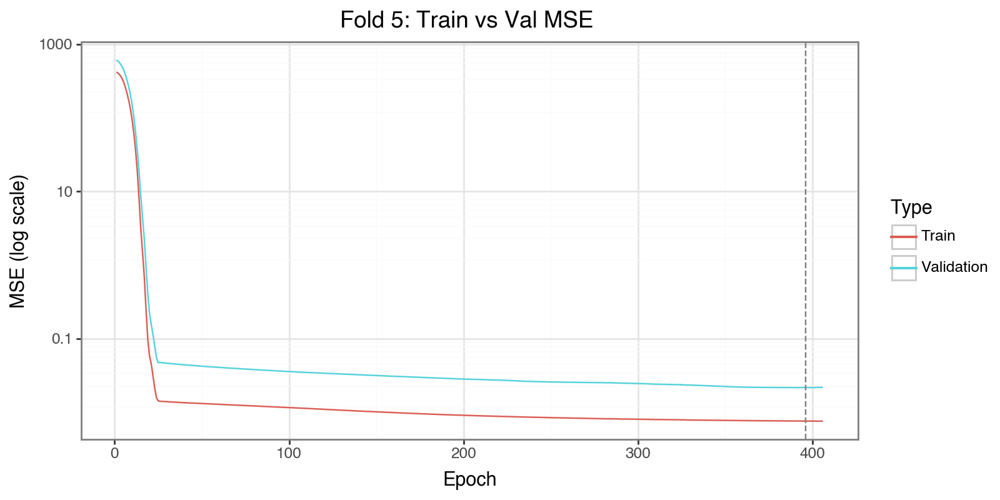

[Fold 6] stop at epoch 321


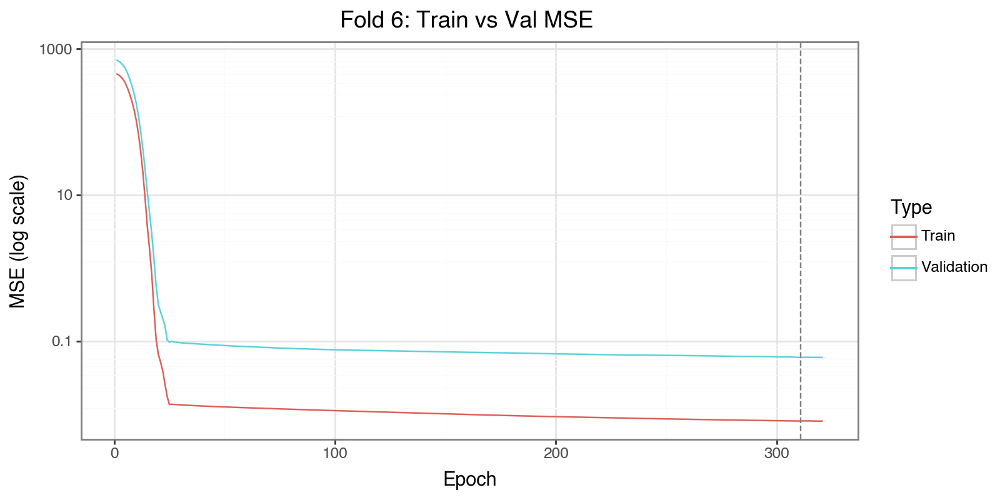

[Fold 7] stop at epoch 364


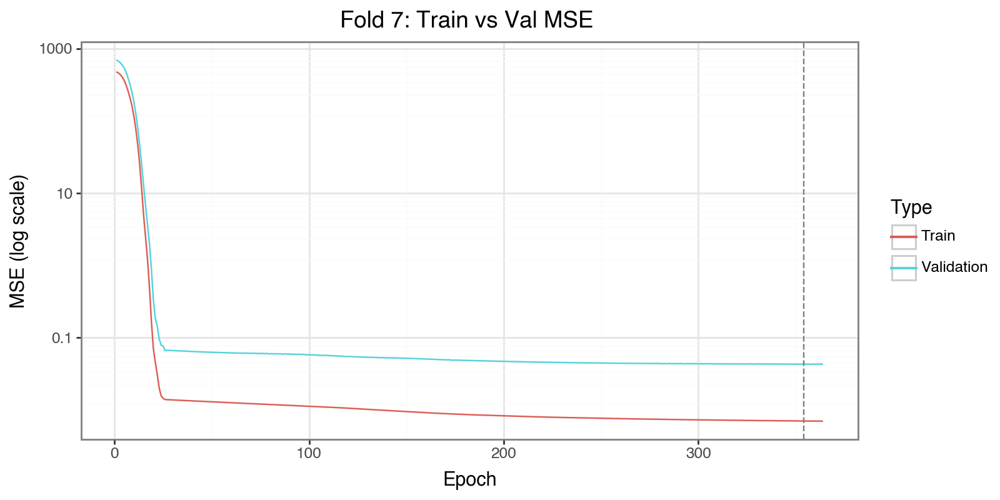

[Fold 8] stop at epoch 304


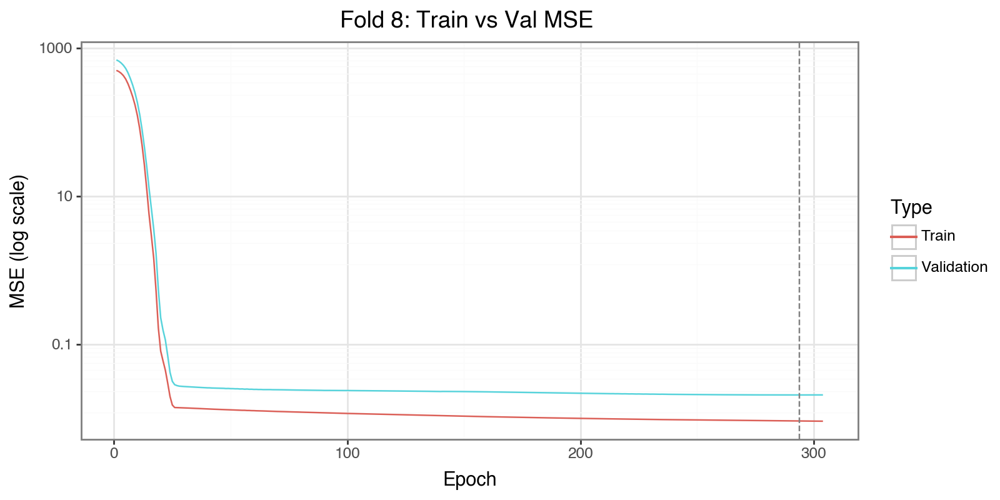

[Fold 9] stop at epoch 36


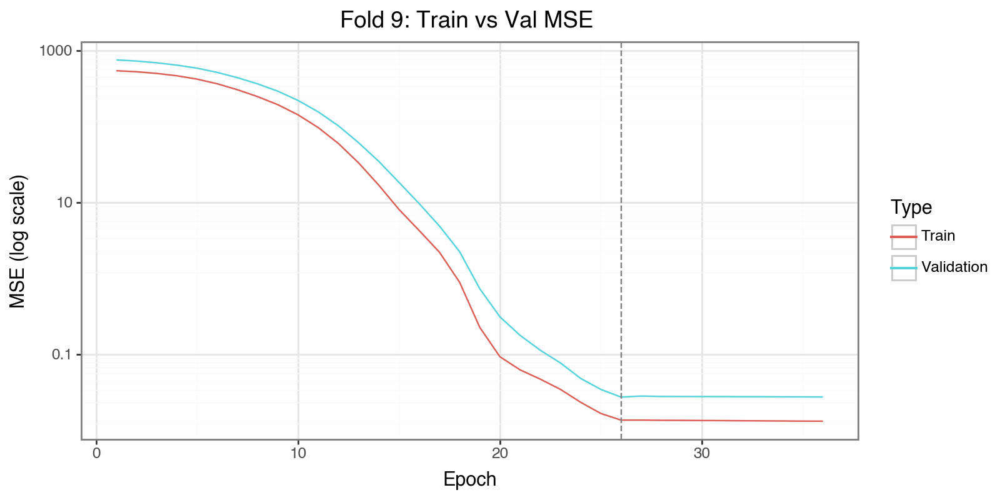

[Fold 10] stop at epoch 91


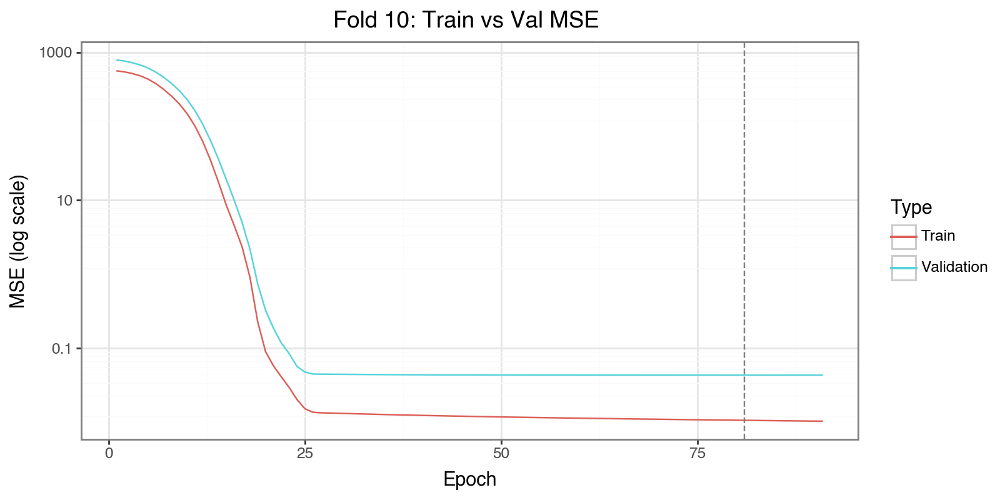

[Fold 11] stop at epoch 36


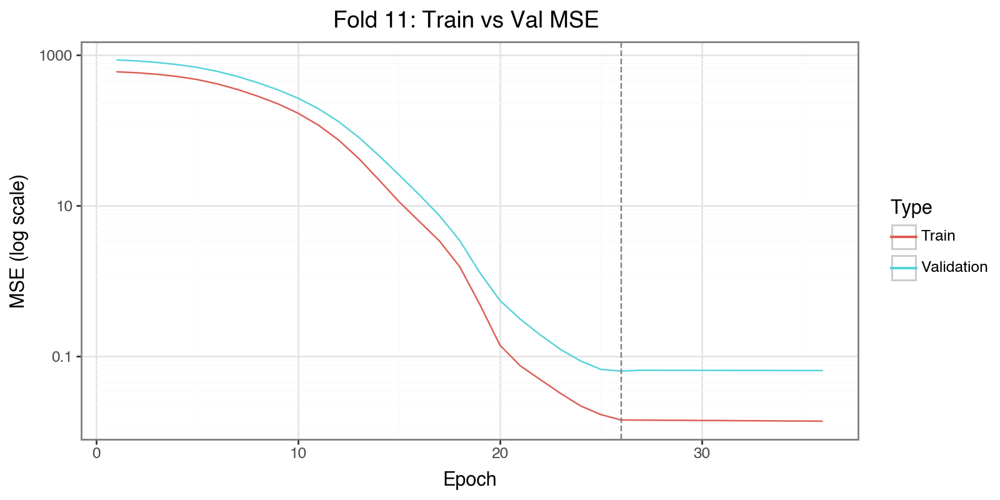

[Fold 12] stop at epoch 36


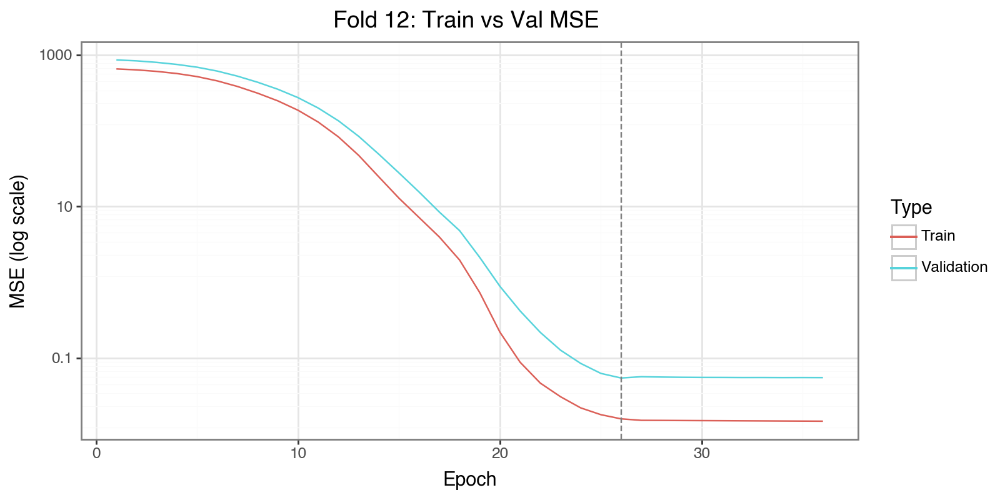

[Fold 13] stop at epoch 286


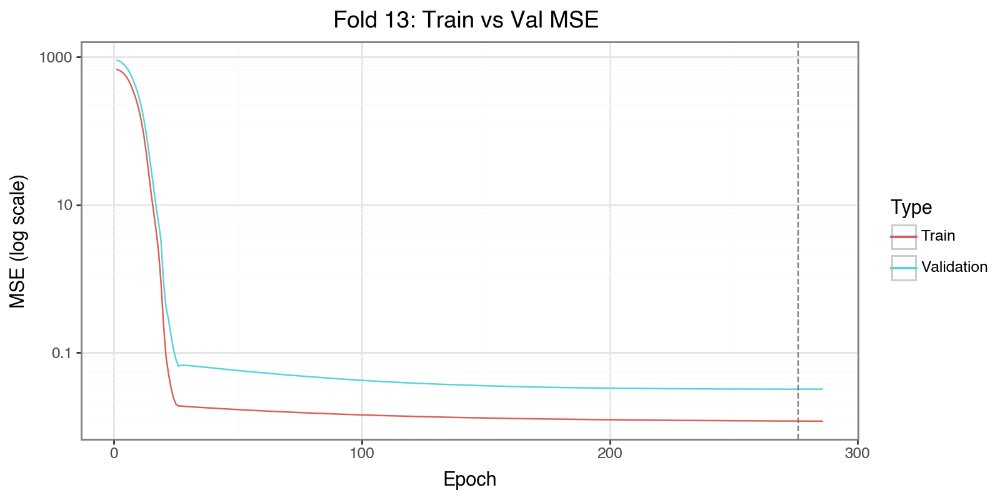

[Fold 14] stop at epoch 100


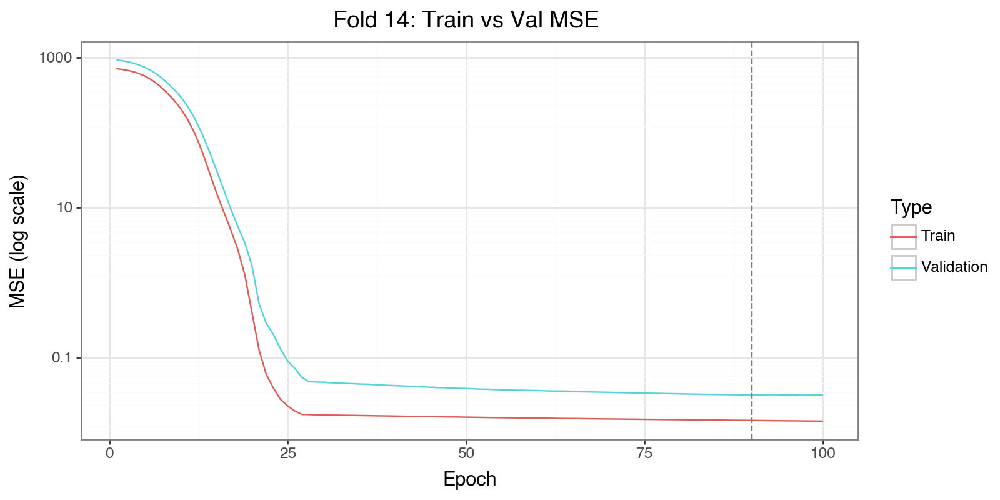

[Fold 15] stop at epoch 419


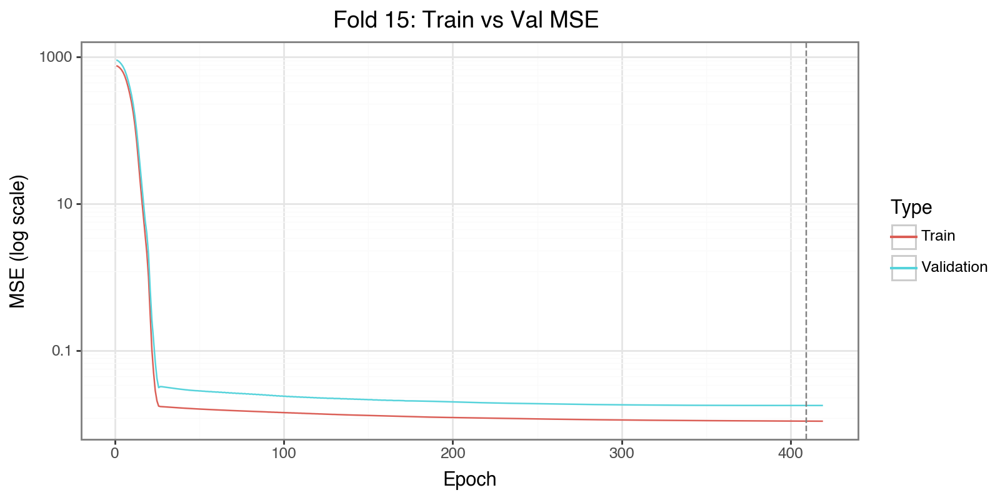

[Fold 16] stop at epoch 133


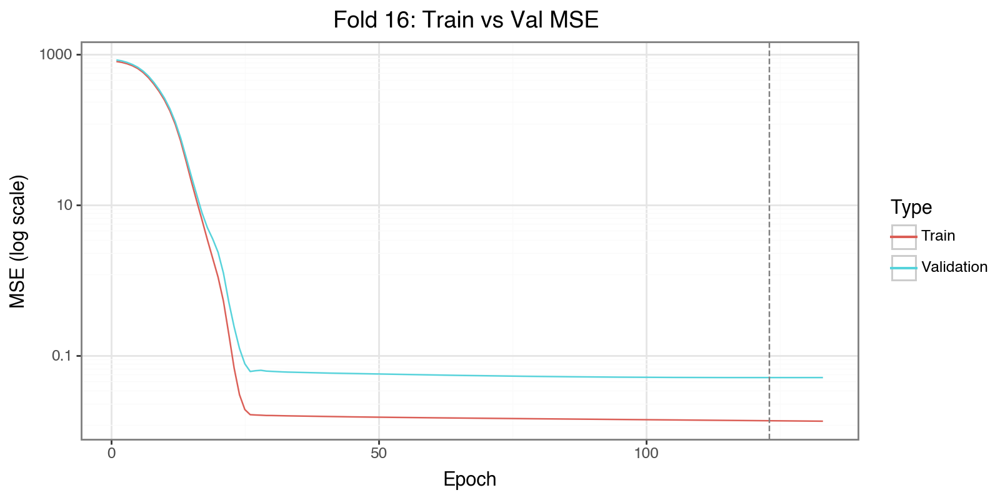

[Fold 17] stop at epoch 143


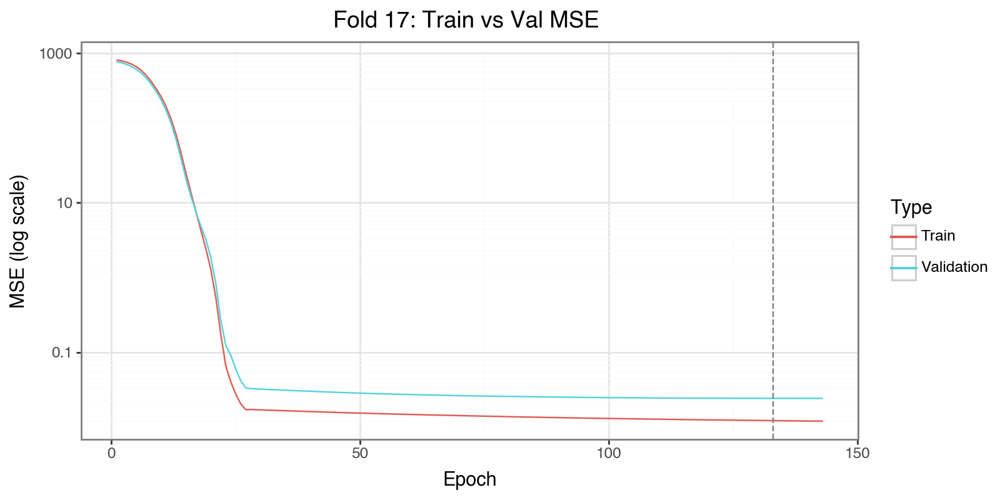

[Fold 18] stop at epoch 35


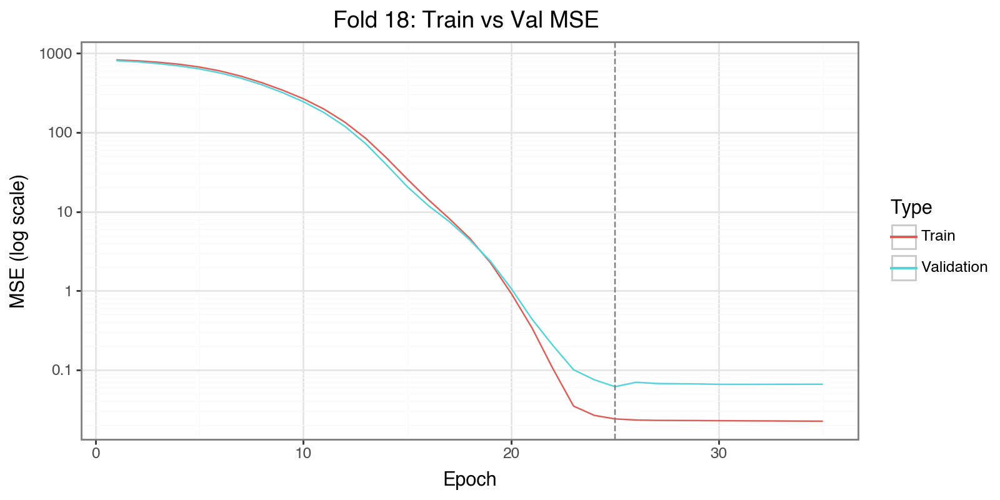

[Fold 19] stop at epoch 39


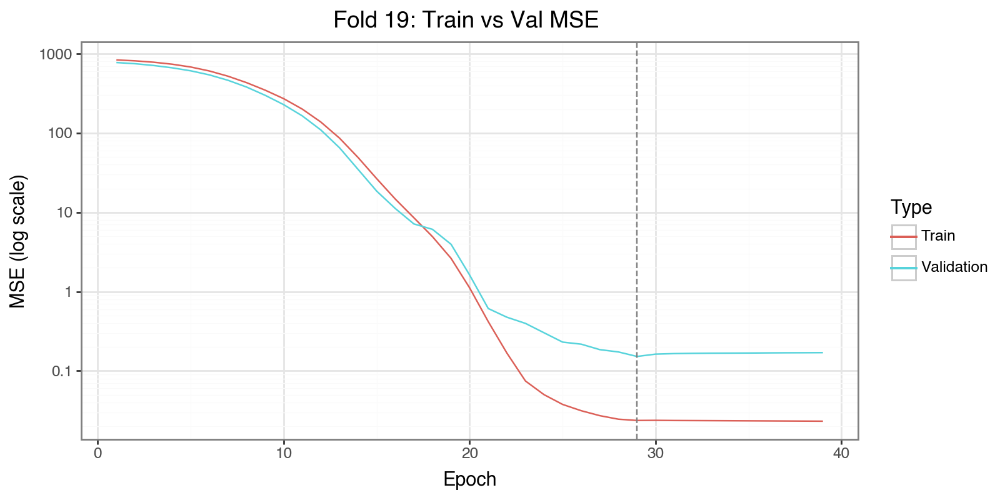

[Fold 20] stop at epoch 238


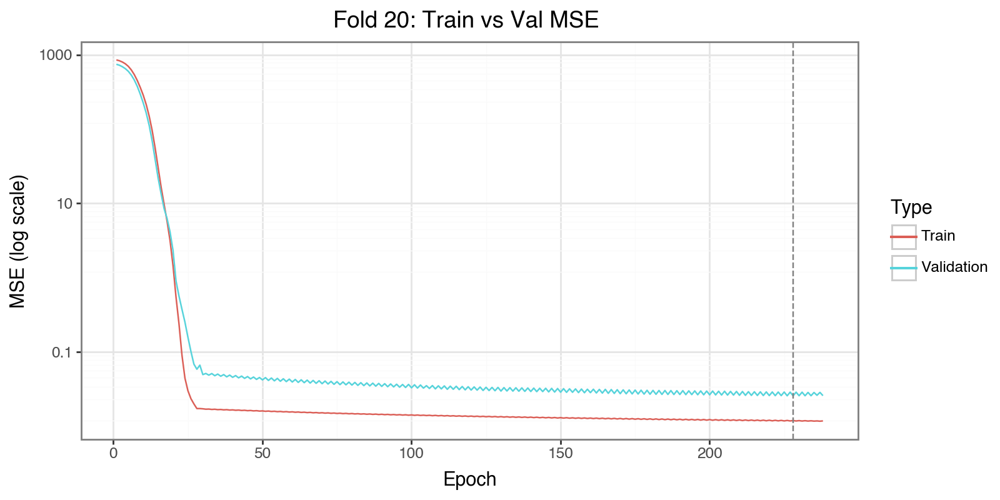

[Fold 21] stop at epoch 37


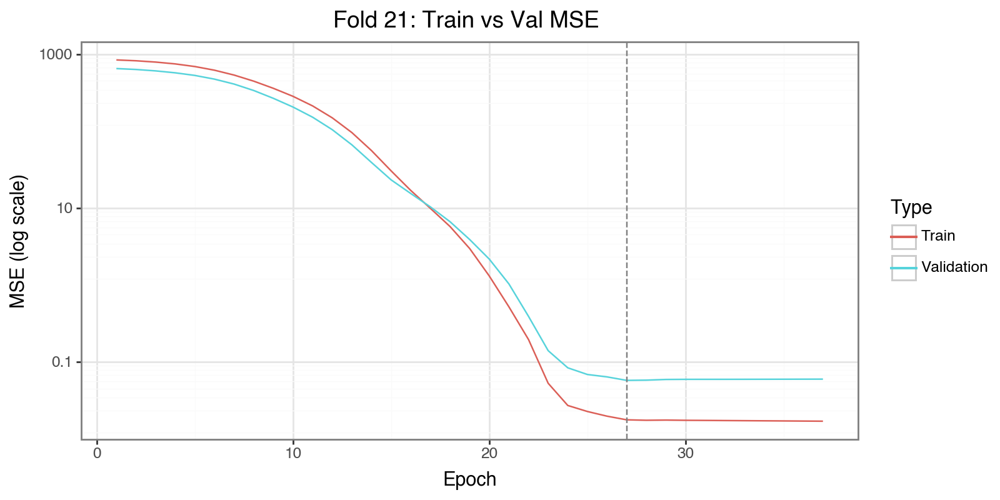

[Fold 22] stop at epoch 34


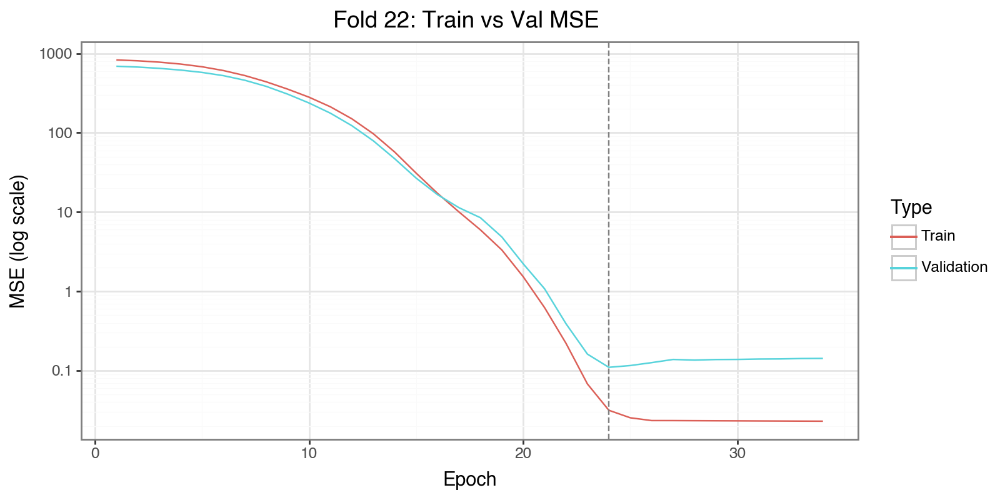

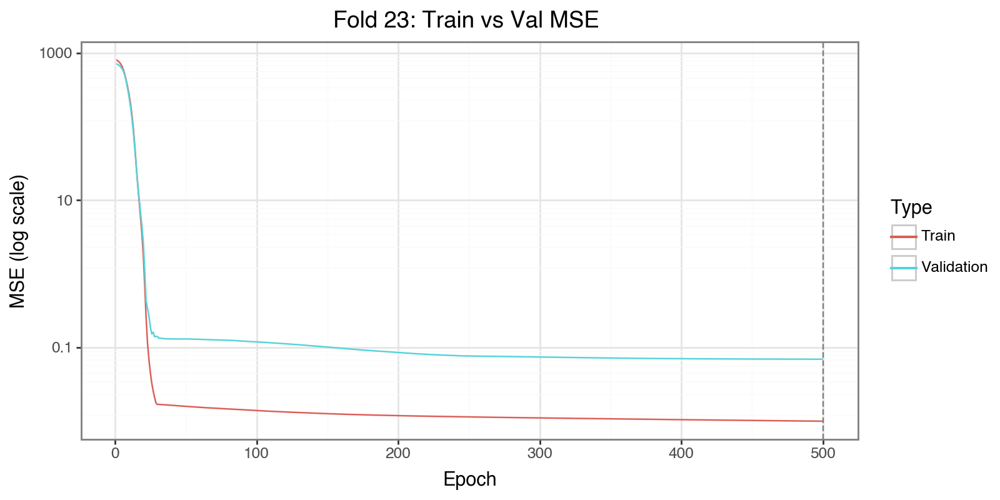

[Fold 24] stop at epoch 38


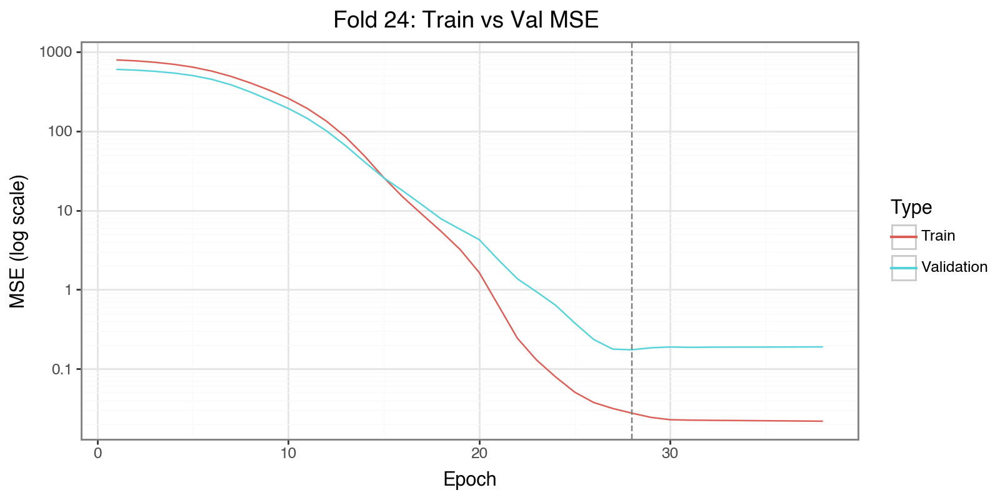

[Fold 25] stop at epoch 294


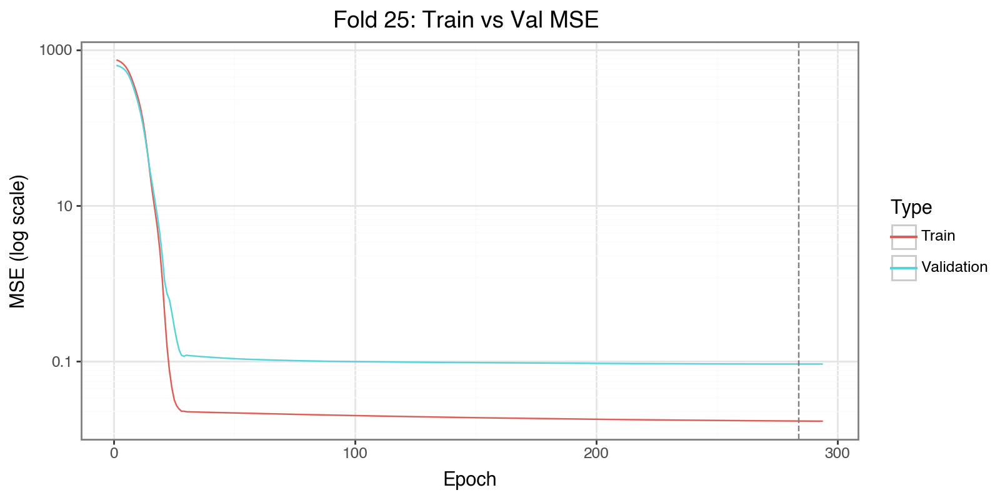

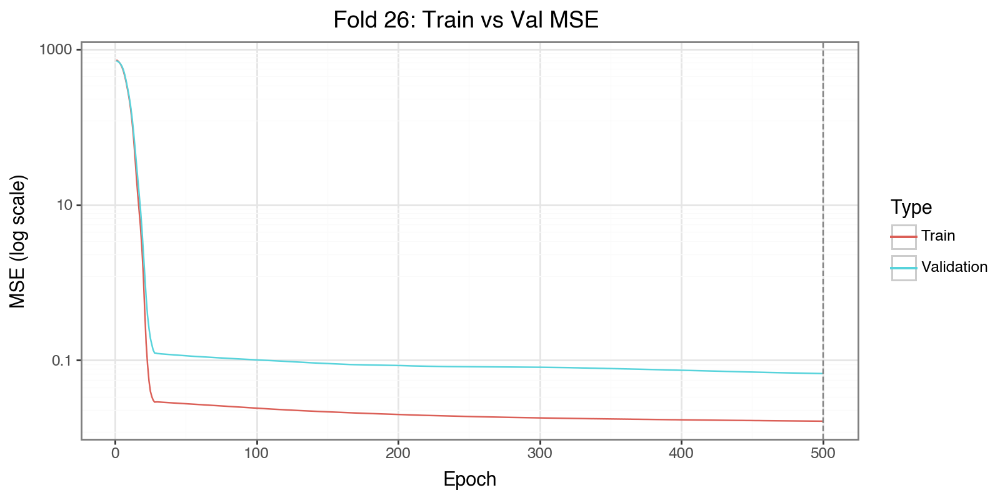

[Fold 27] stop at epoch 39


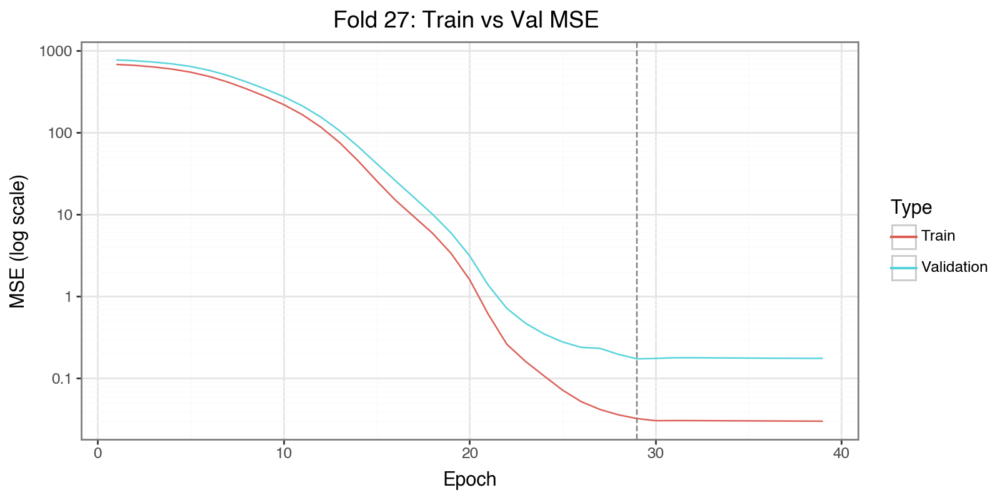

[Fold 28] stop at epoch 40


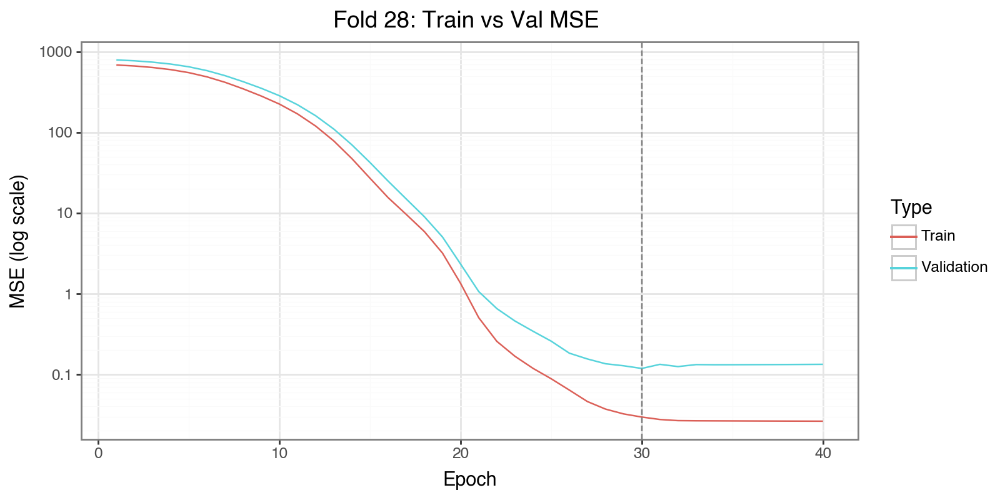

[Fold 29] stop at epoch 39


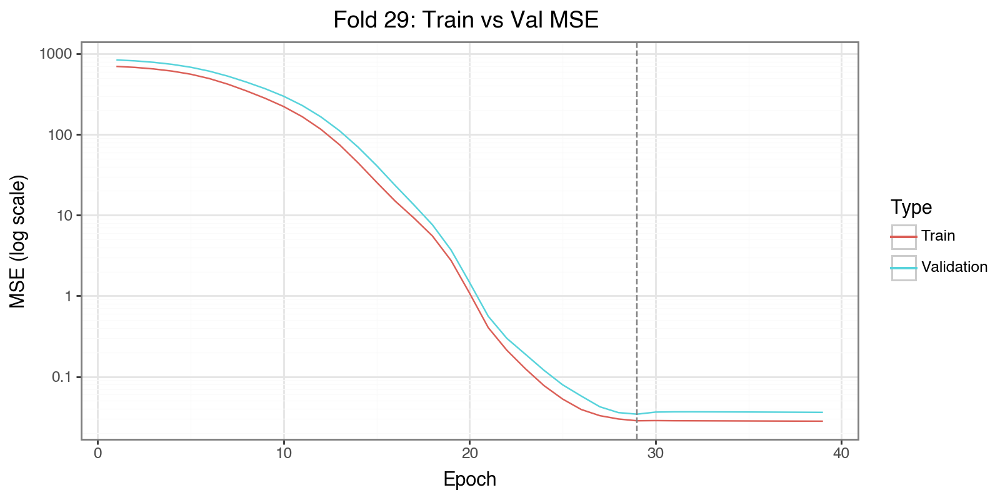

[Fold 30] stop at epoch 38


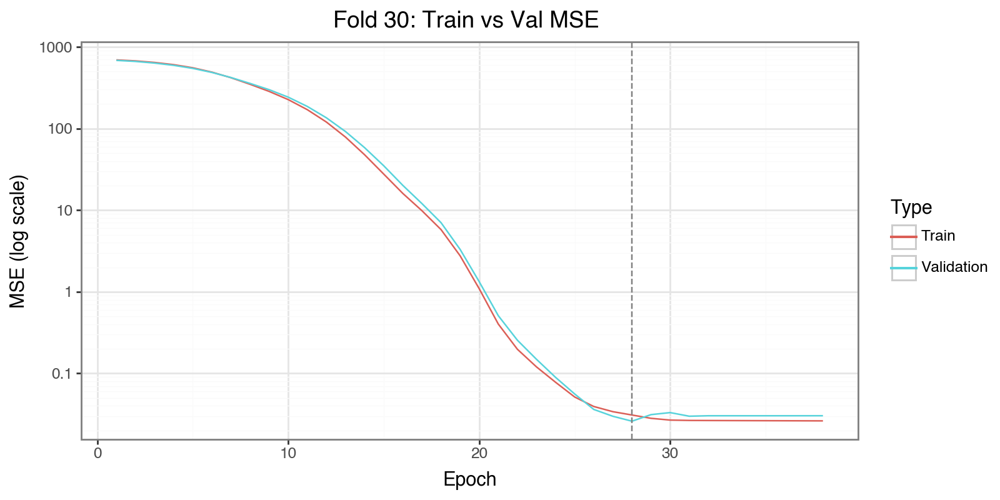

[Fold 31] stop at epoch 39


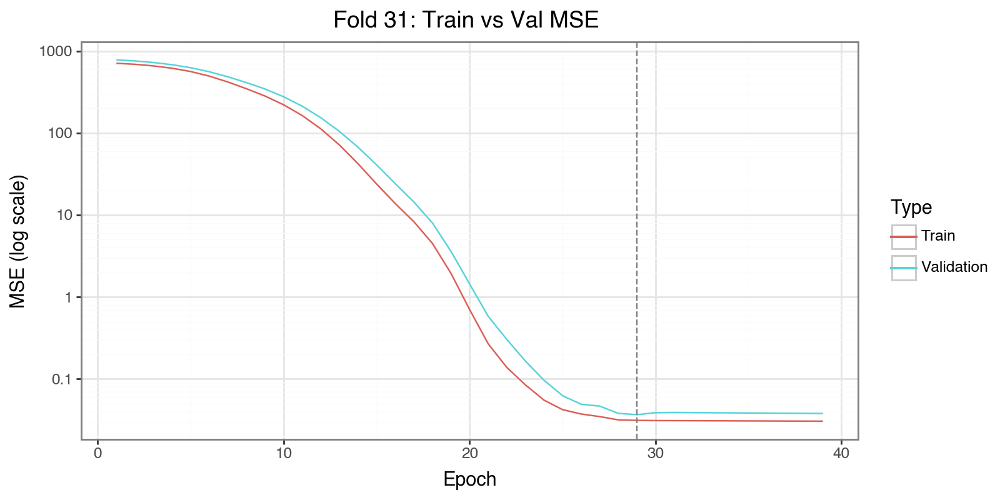

[Fold 32] stop at epoch 37


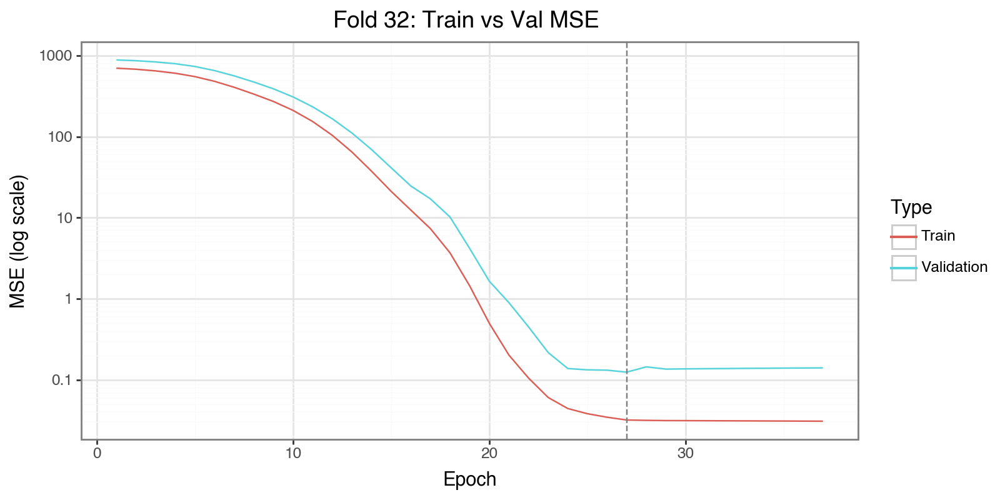

[Fold 33] stop at epoch 32


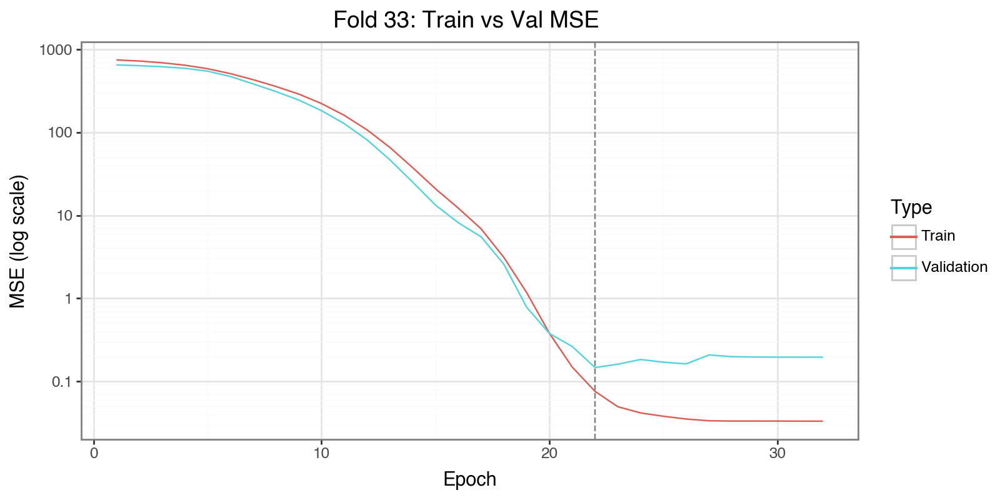

[Fold 34] stop at epoch 34


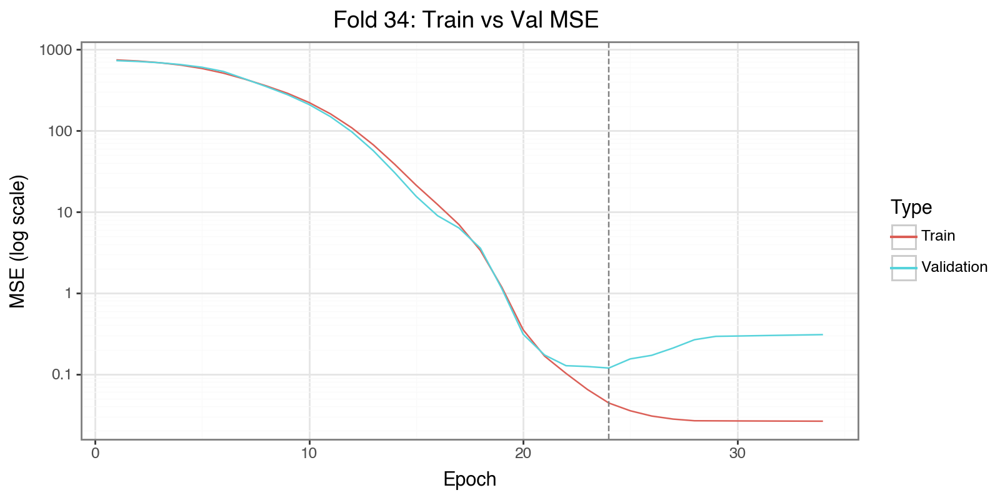

[Fold 35] stop at epoch 37


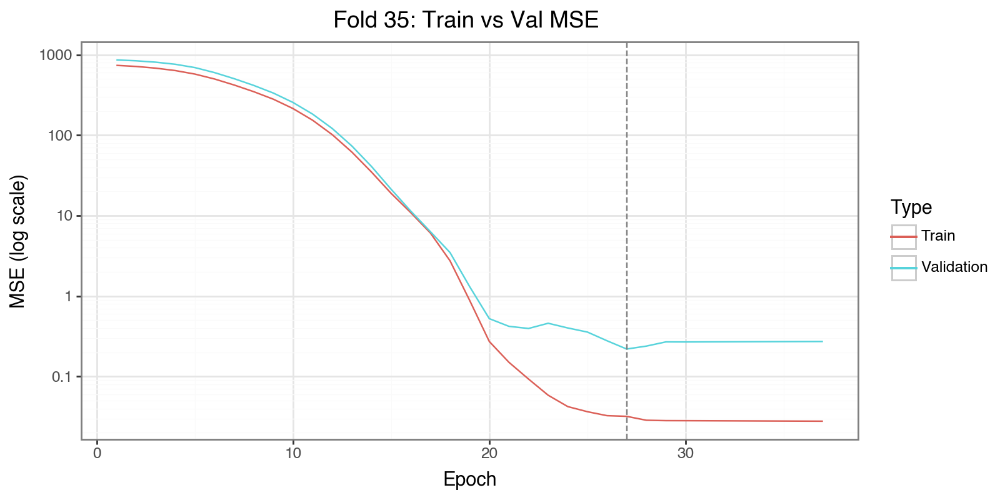

[Fold 36] stop at epoch 34


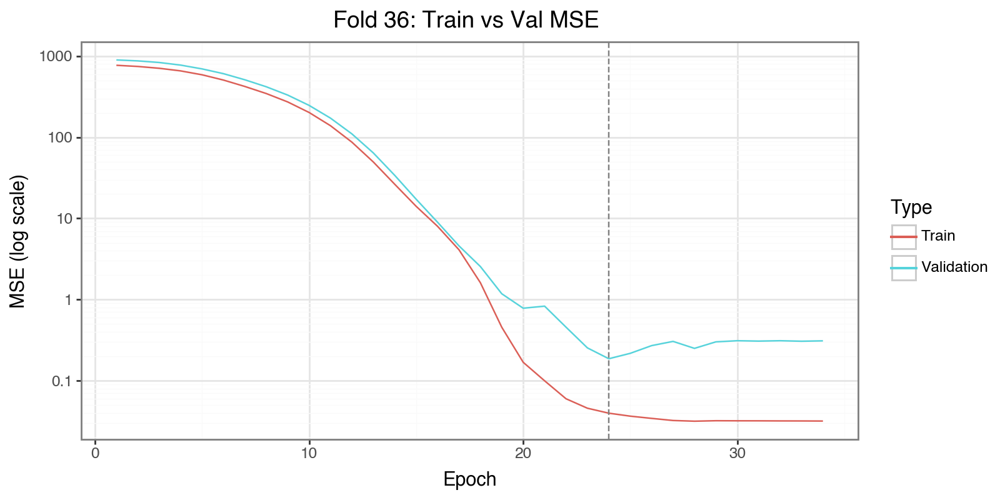

[Fold 37] stop at epoch 34


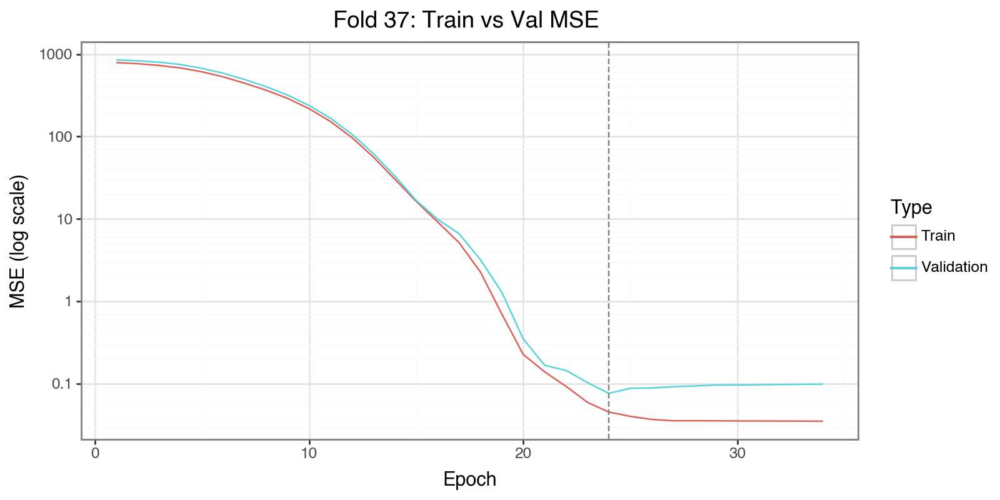

[Fold 38] stop at epoch 196


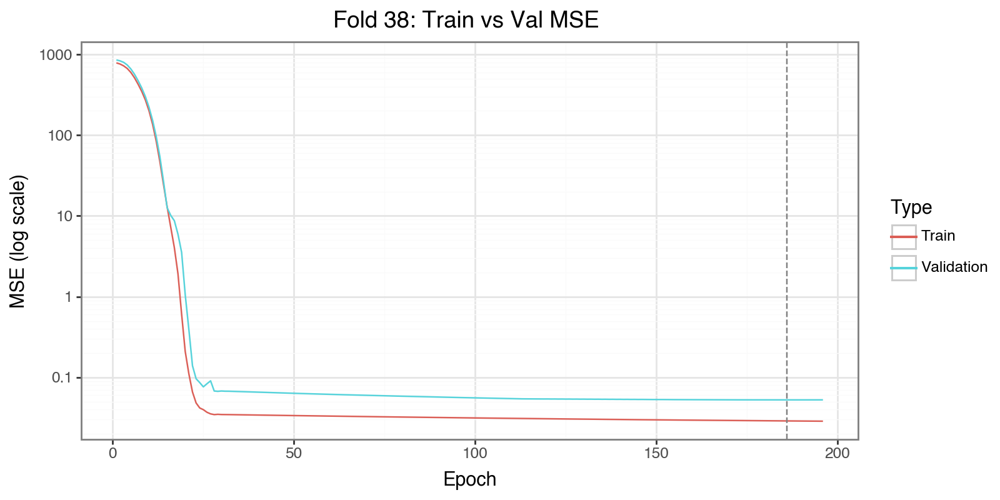

[Fold 39] stop at epoch 36


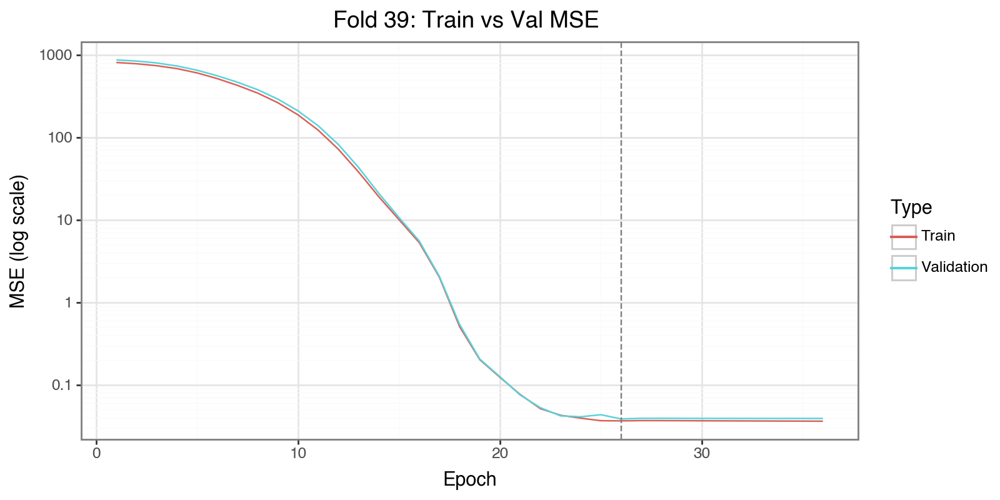

[Fold 40] stop at epoch 33


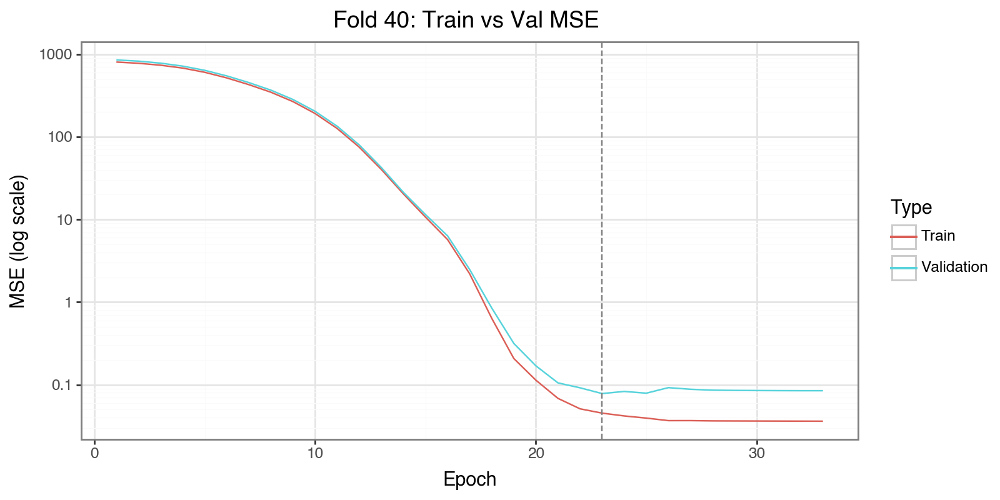

[Fold 41] stop at epoch 37


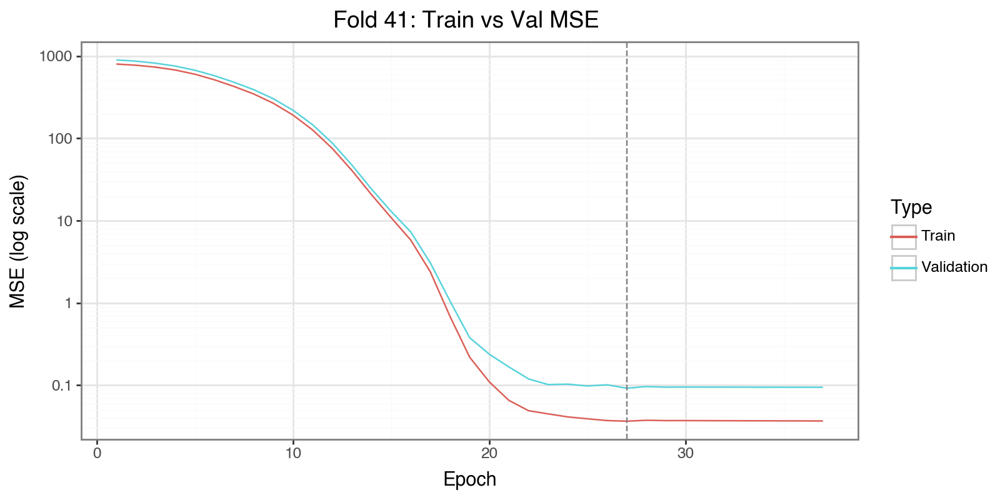

[Fold 42] stop at epoch 35


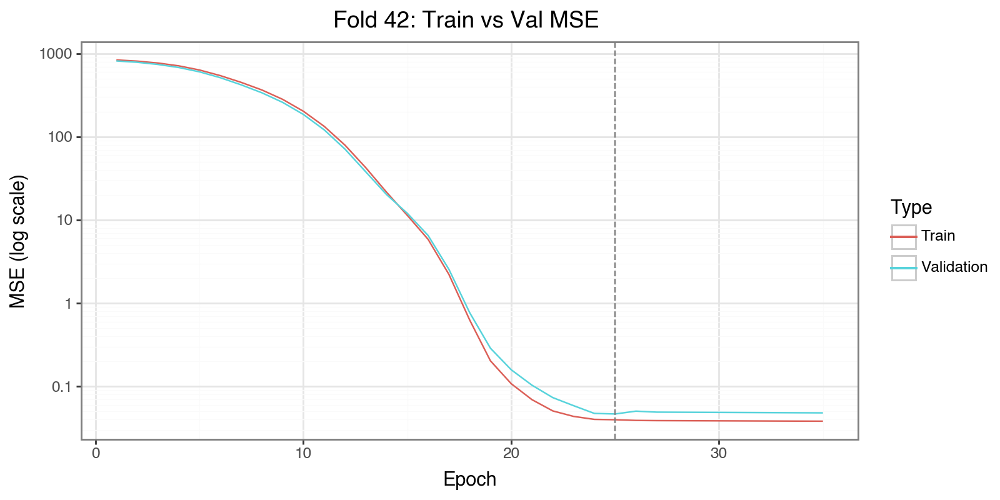

[Fold 43] stop at epoch 216


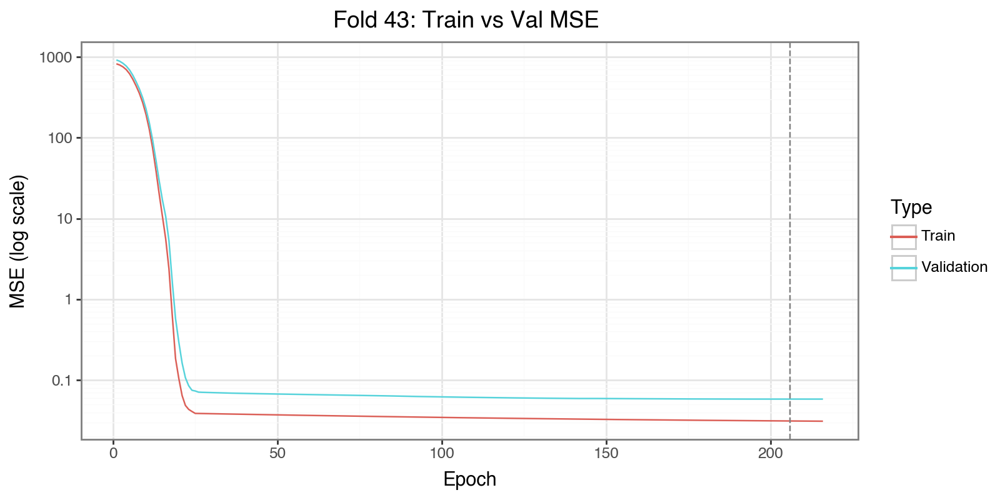

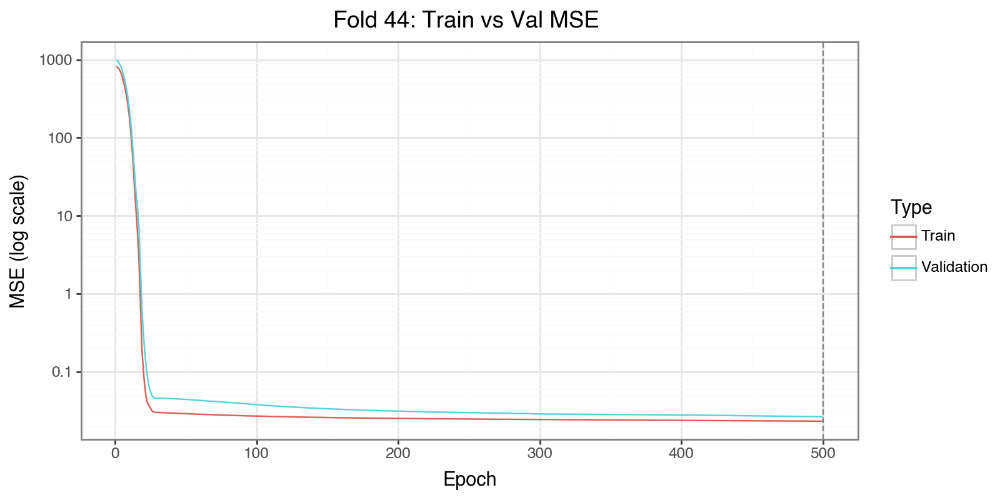

[Fold 45] stop at epoch 36


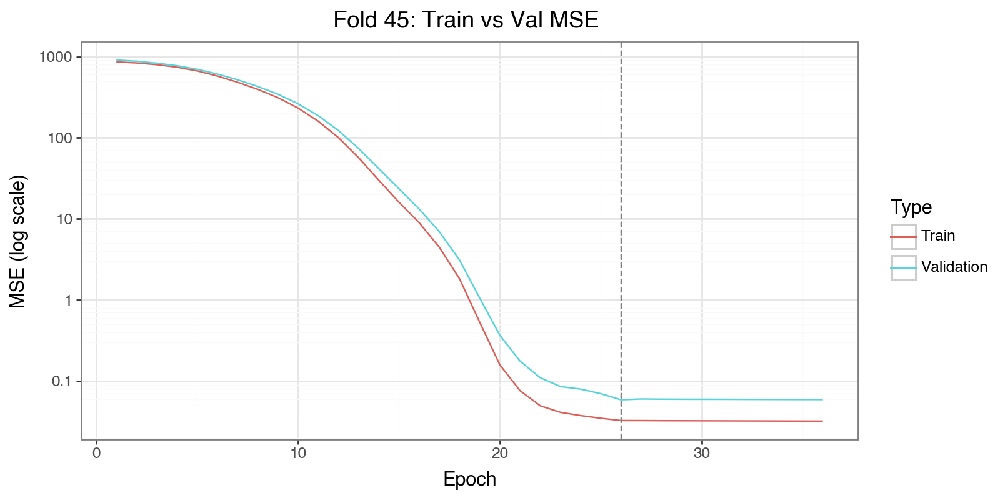

[Fold 46] stop at epoch 37


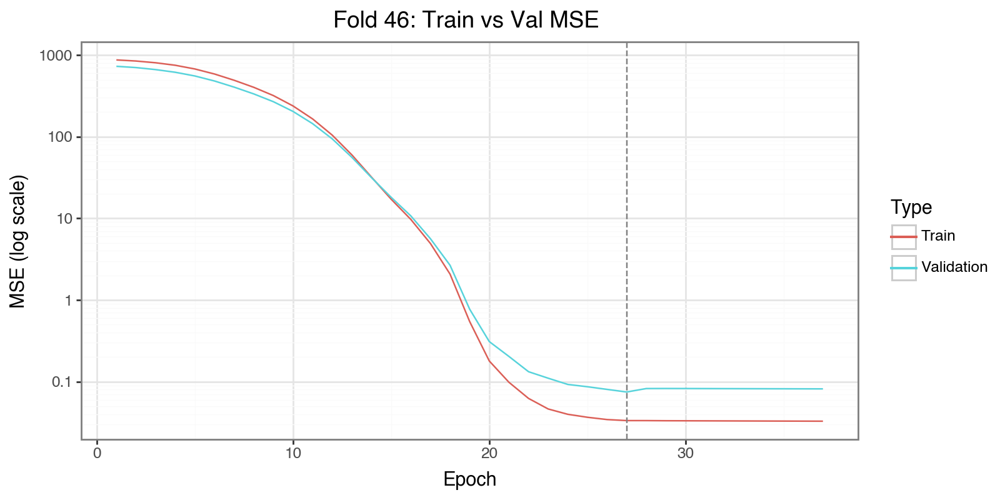

[Fold 47] stop at epoch 291


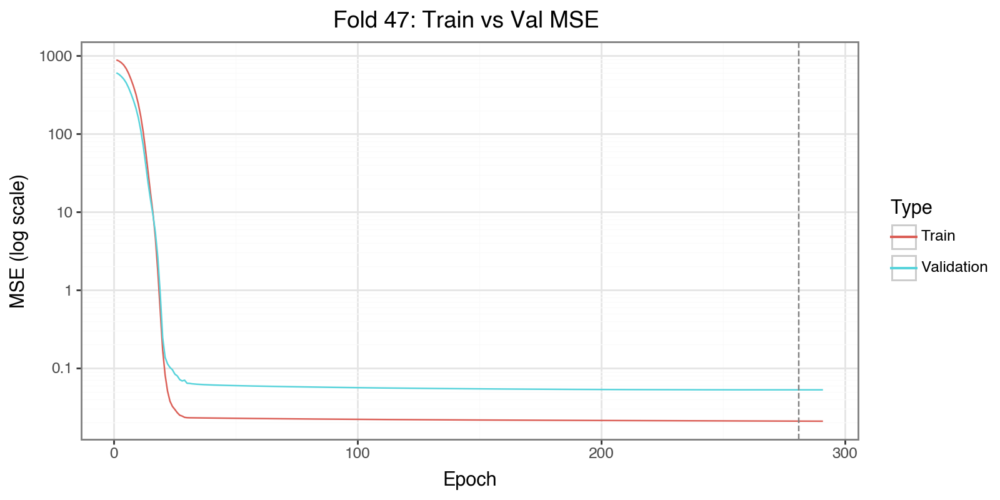

[Fold 48] stop at epoch 37


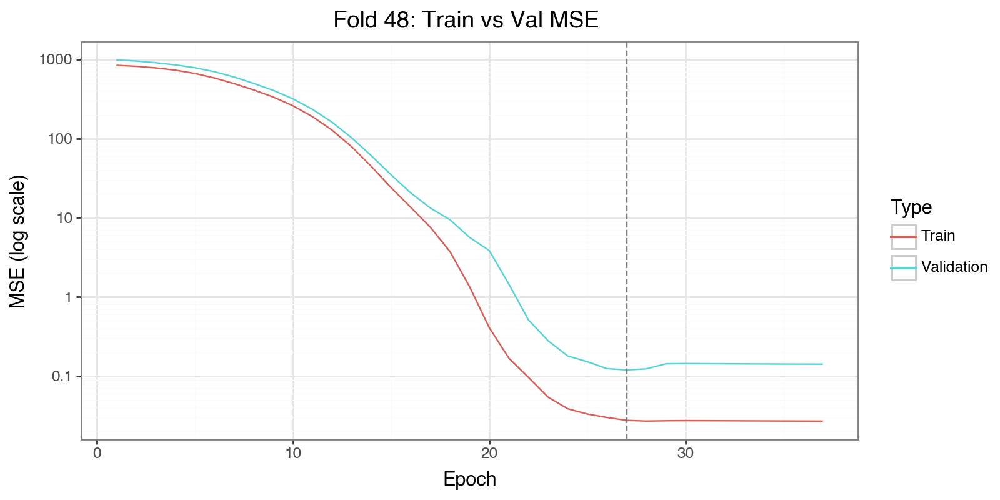

[Fold 49] stop at epoch 38


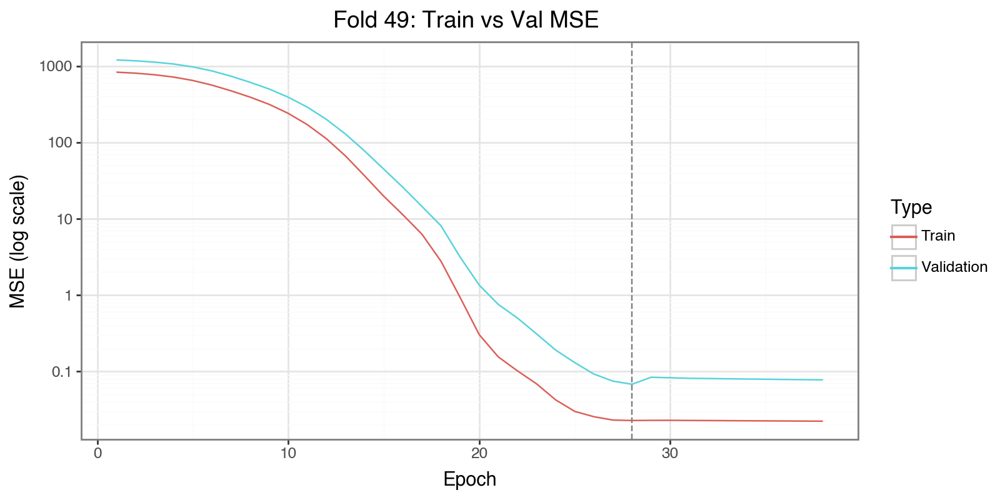

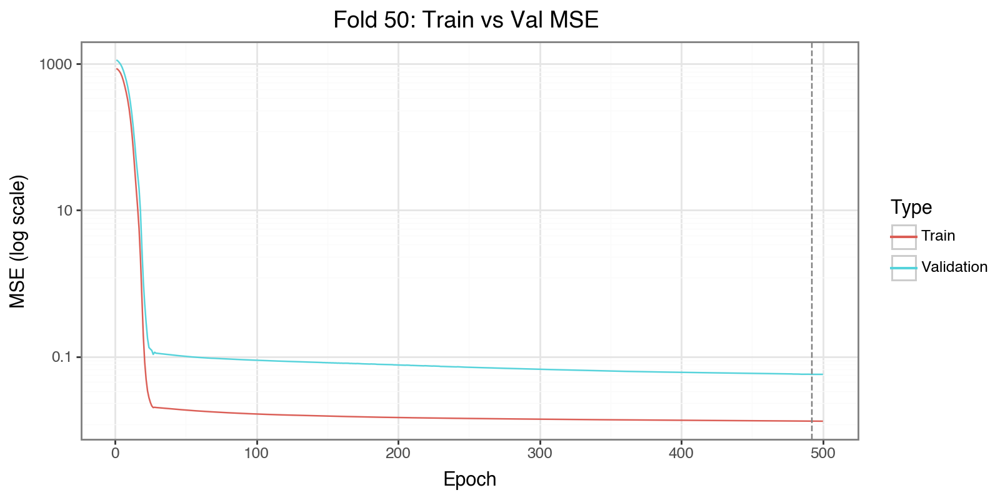

[Fold 51] stop at epoch 74


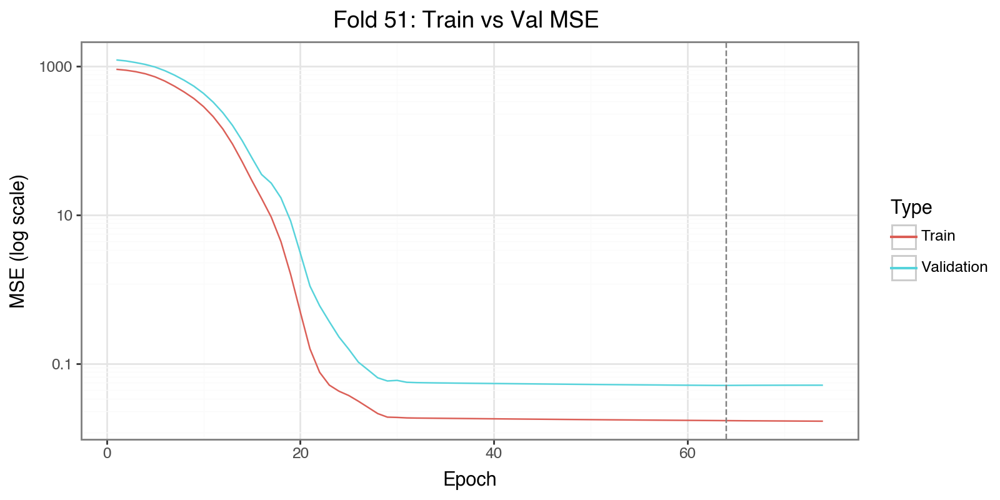

[Fold 52] stop at epoch 209


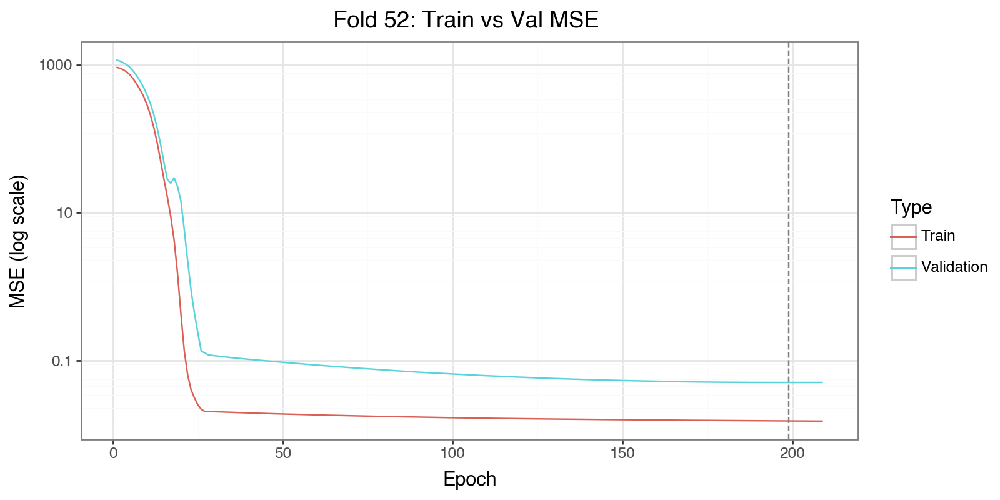

[Fold 53] stop at epoch 374


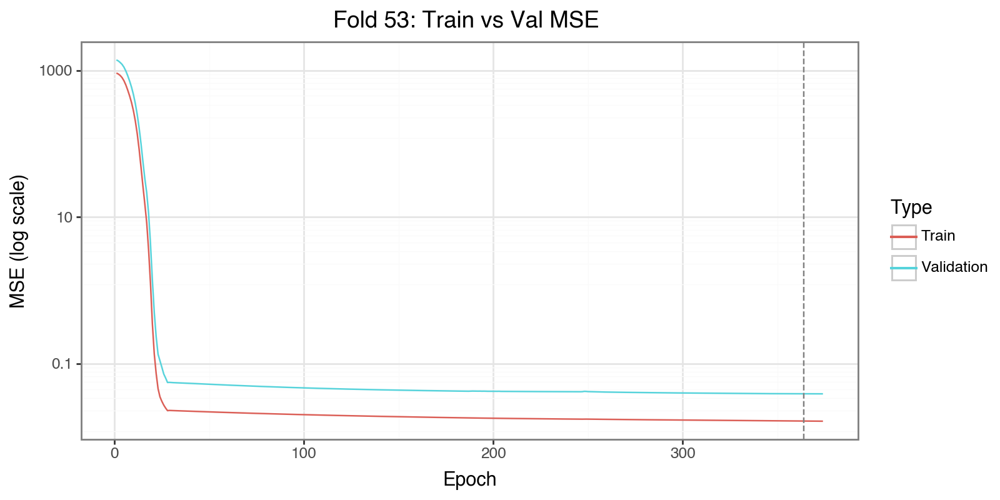

[Fold 54] stop at epoch 36


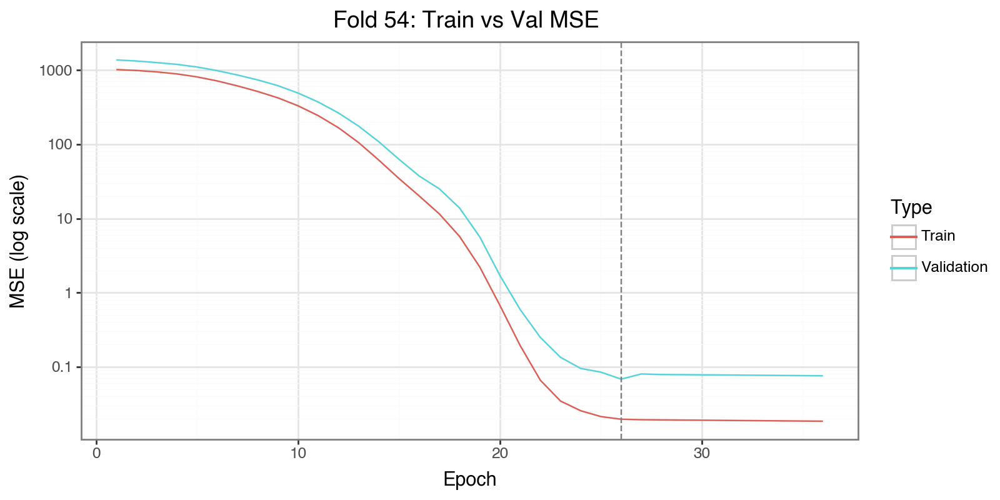

[Fold 55] stop at epoch 38


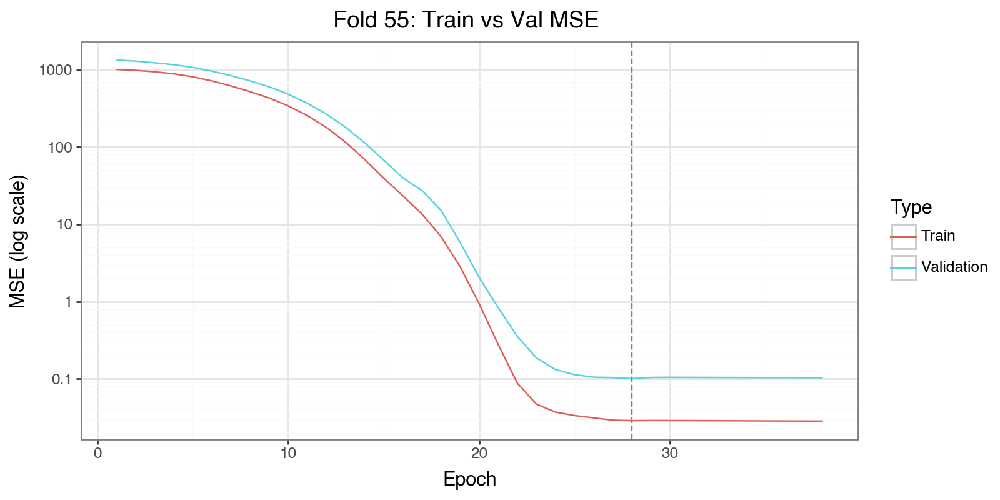

[Fold 56] stop at epoch 38


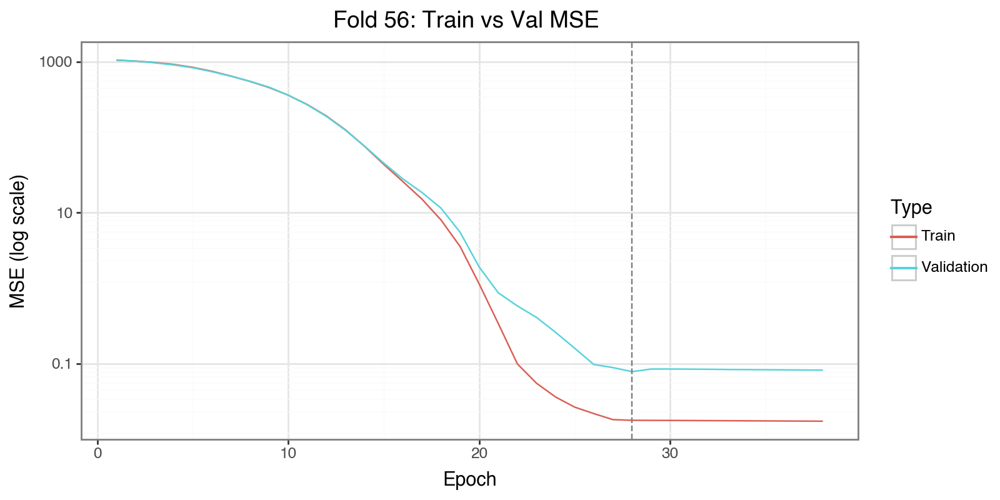

[Fold 57] stop at epoch 262


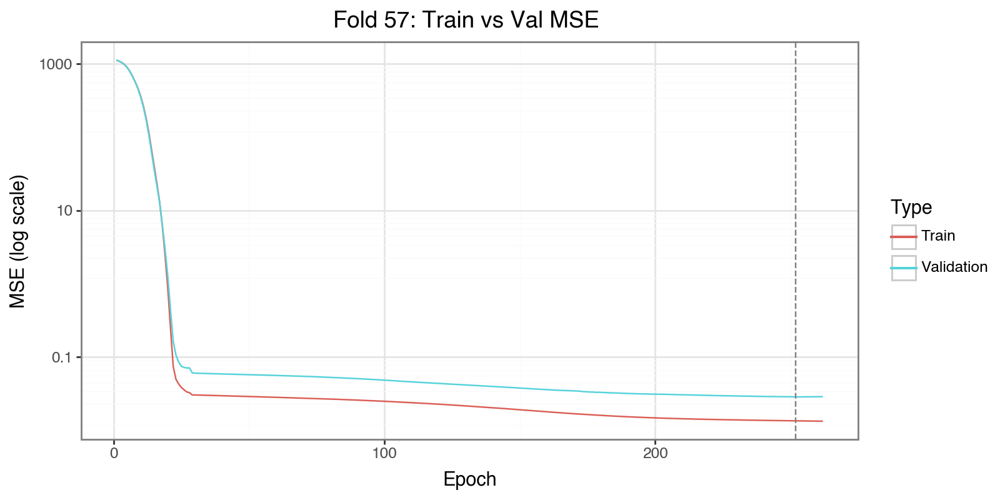

[Fold 58] stop at epoch 189


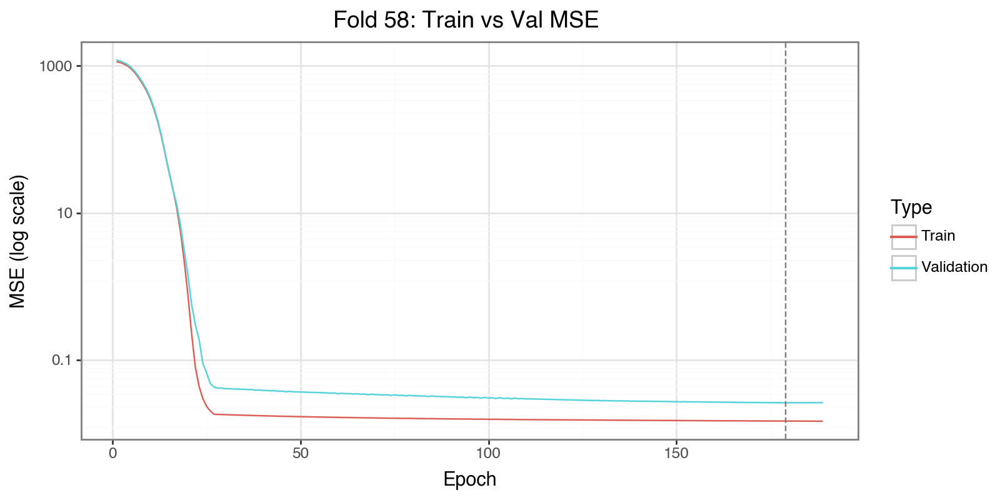

[Fold 59] stop at epoch 264


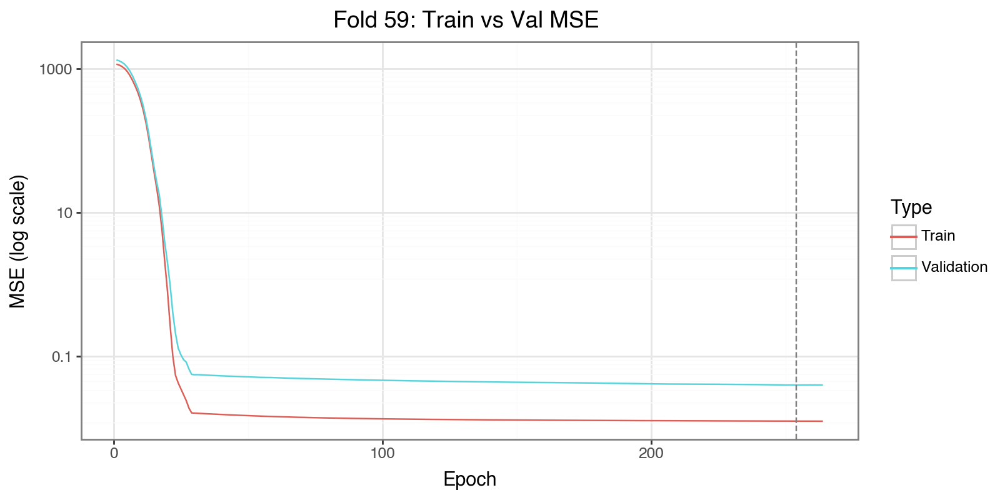

[Fold 60] stop at epoch 208


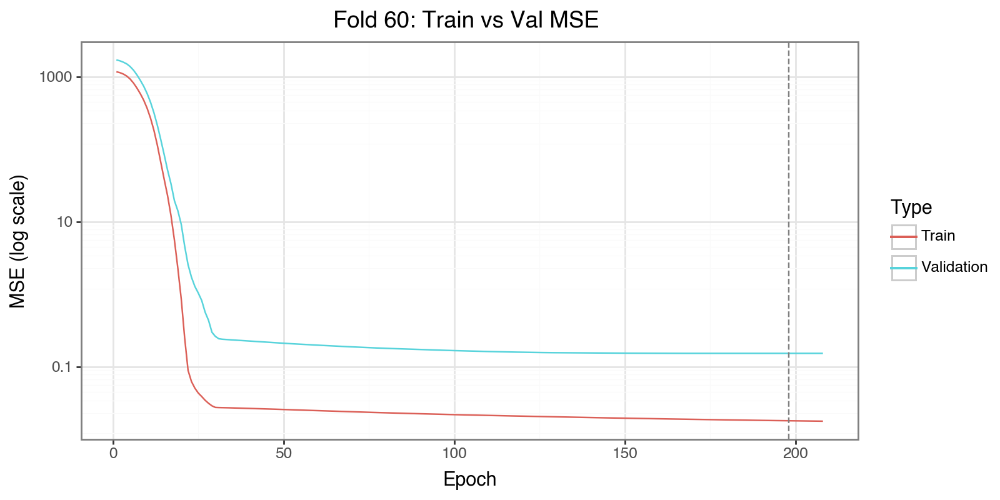

[Fold 61] stop at epoch 38


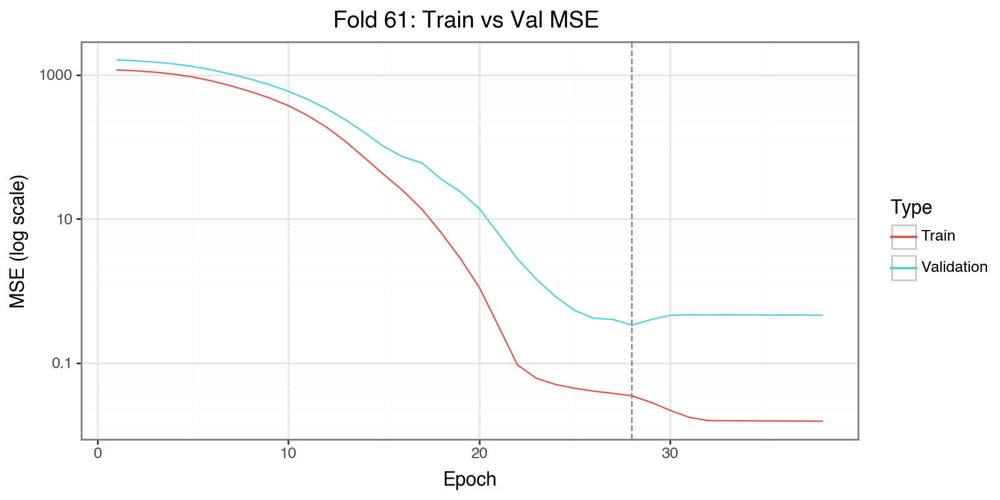

[Fold 62] stop at epoch 83


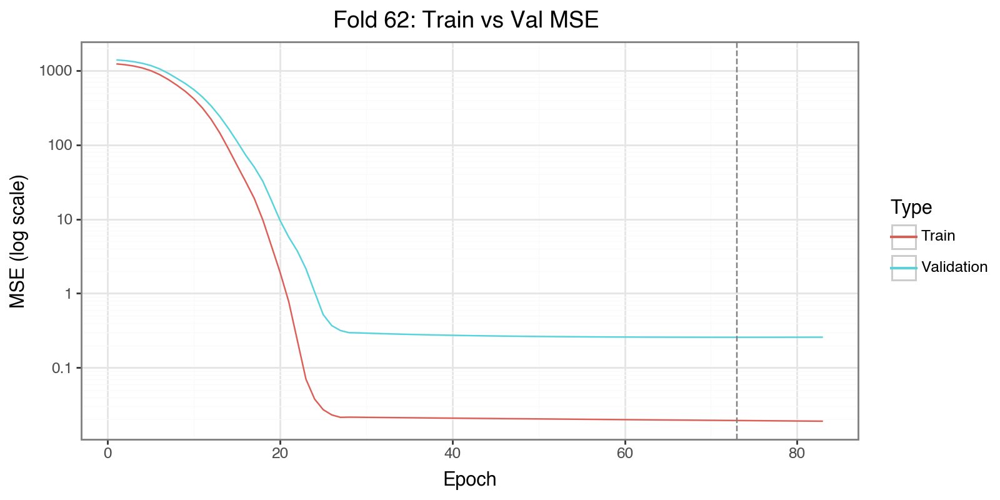

[Fold 63] stop at epoch 38


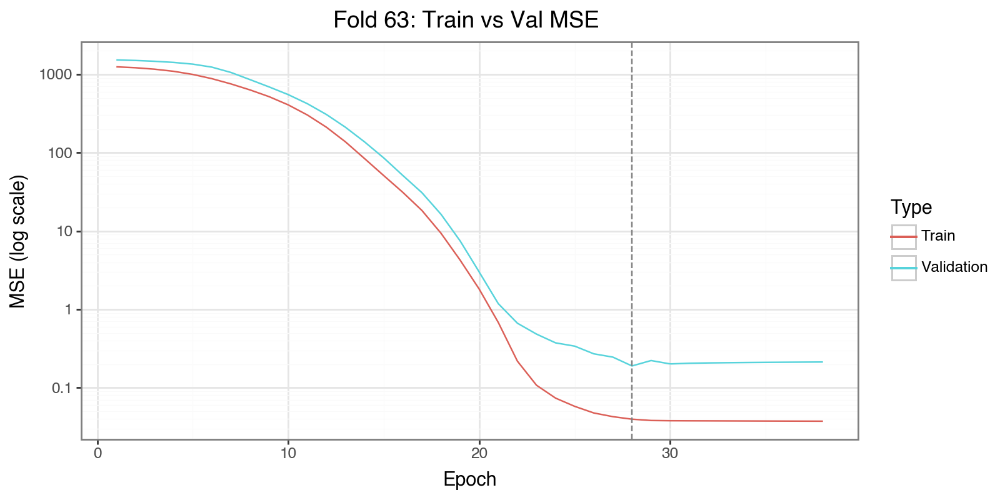

[Fold 64] stop at epoch 110


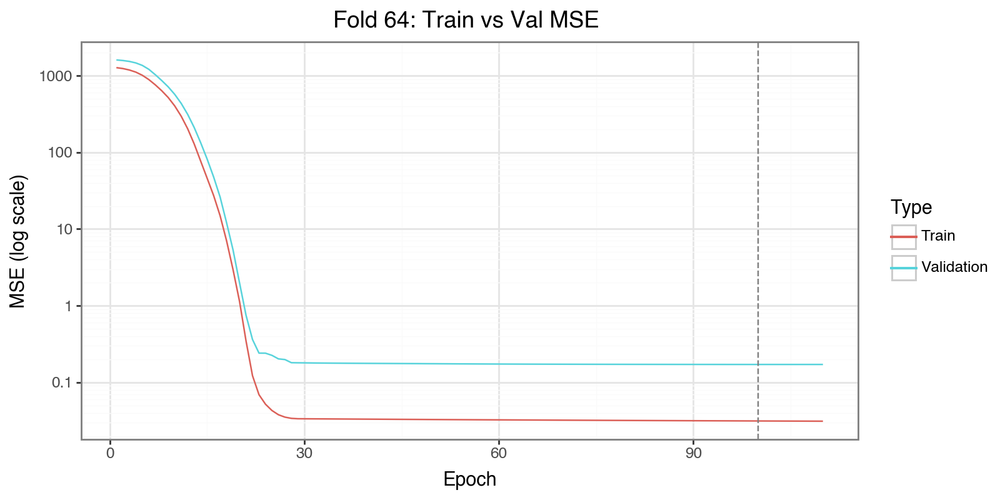

[Fold 65] stop at epoch 38


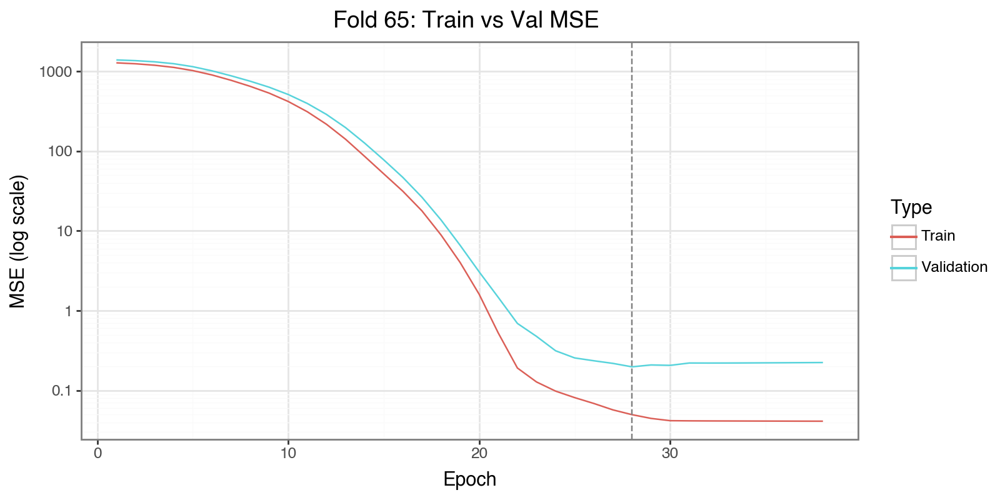

[Fold 66] stop at epoch 109


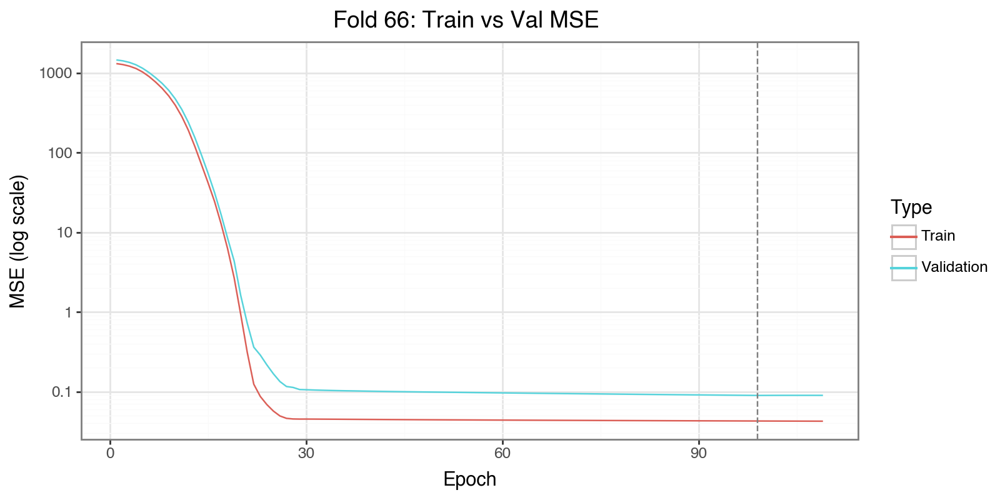

[Fold 67] stop at epoch 390


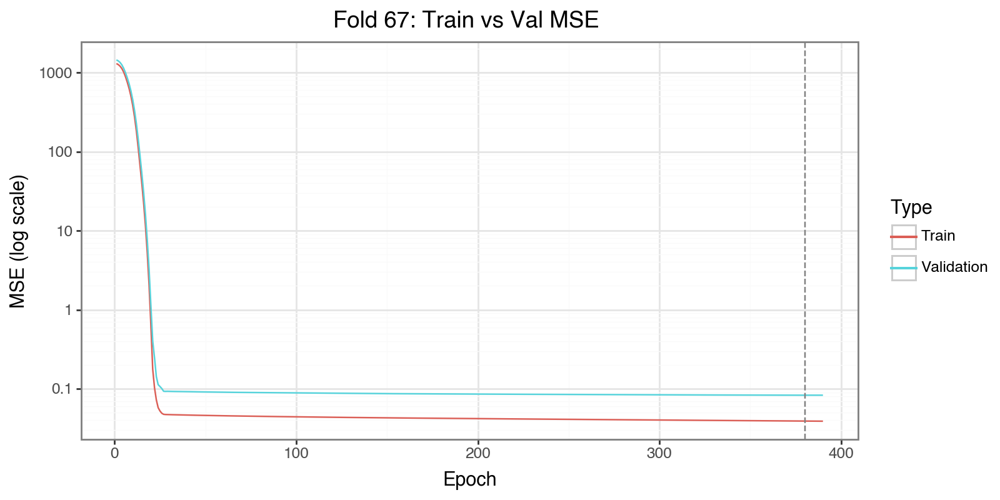

[Fold 68] stop at epoch 38


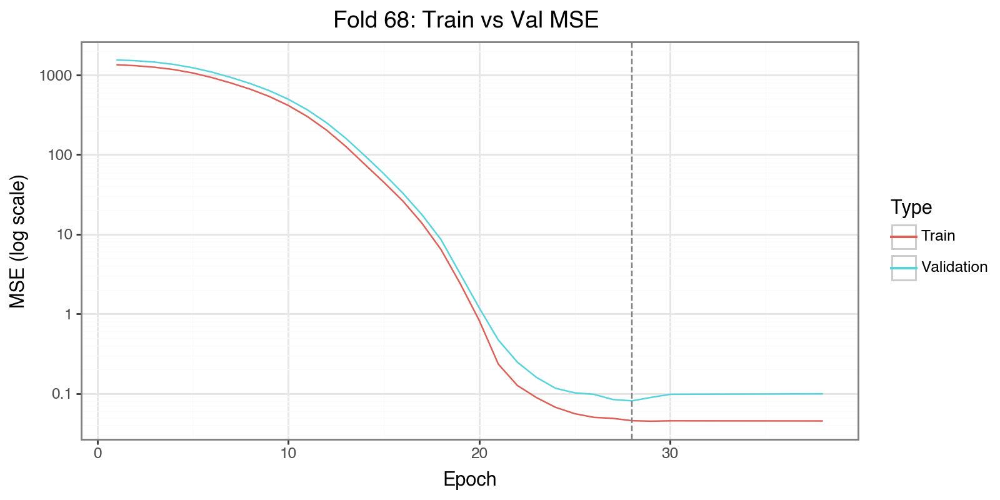

[Fold 69] stop at epoch 40


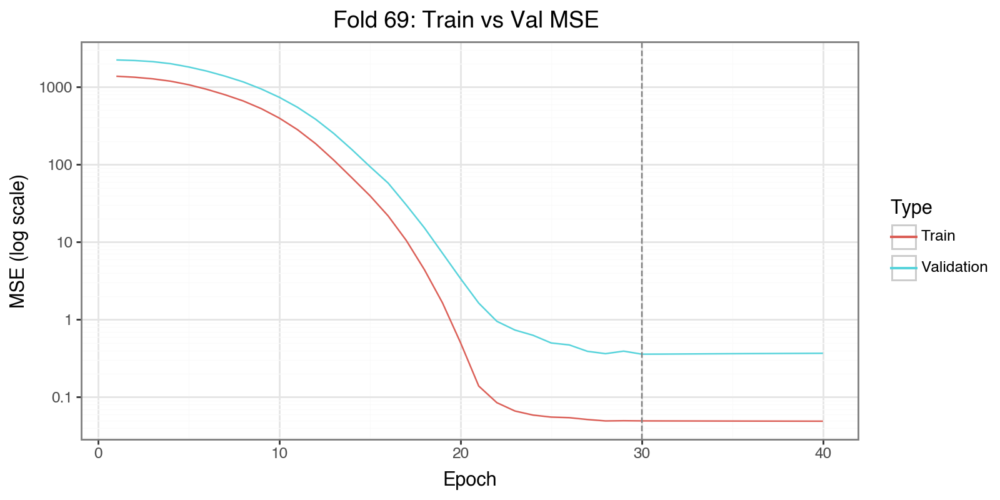

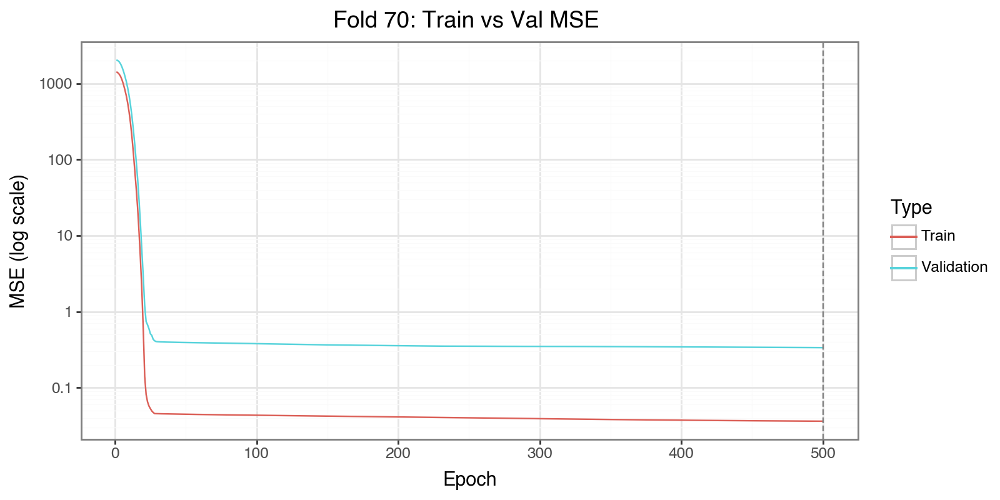

[Fold 71] stop at epoch 164


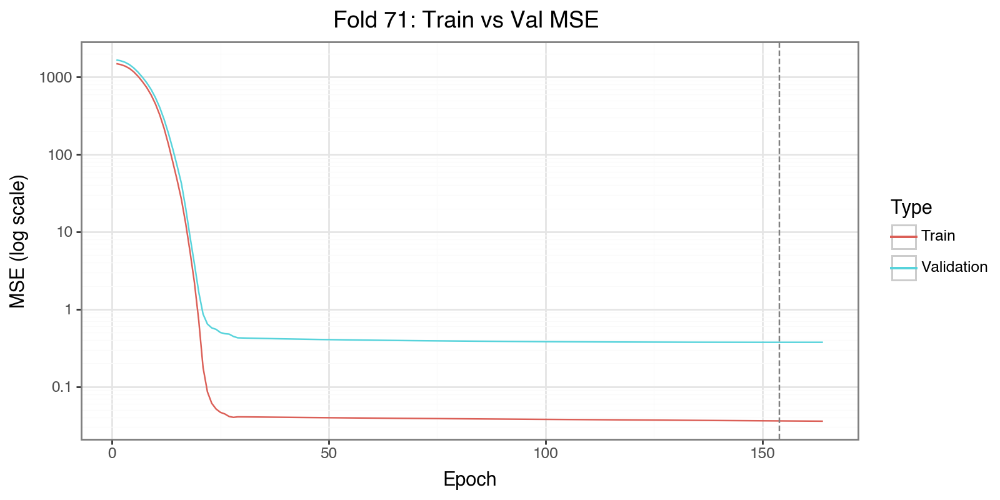

[Fold 72] stop at epoch 37


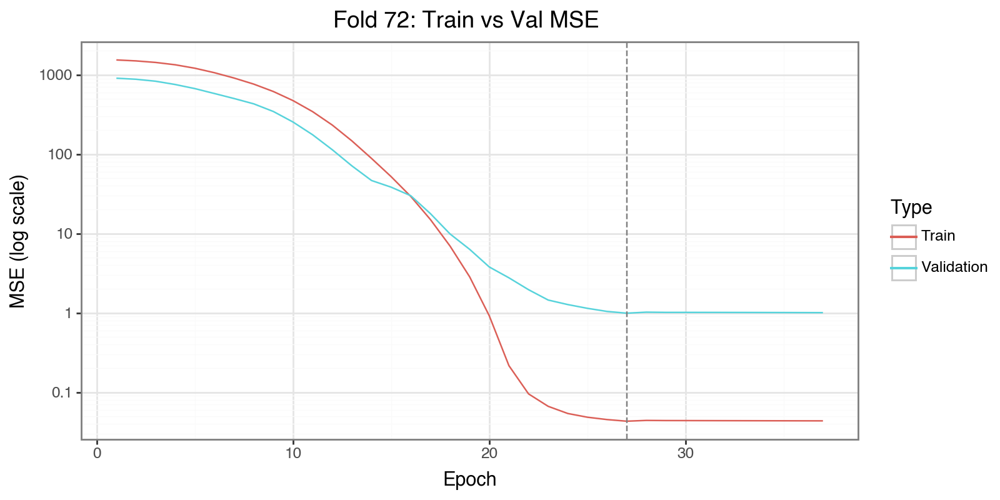

[Fold 73] stop at epoch 51


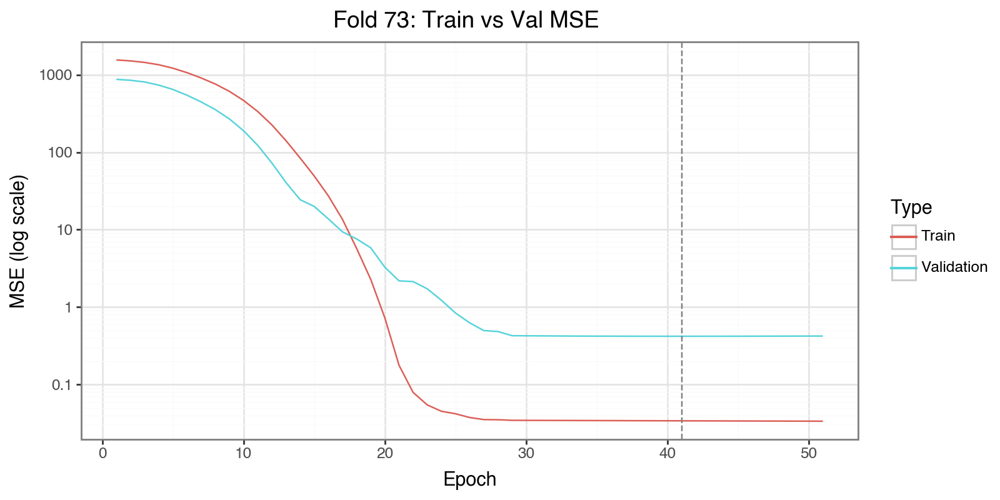

[Fold 74] stop at epoch 40


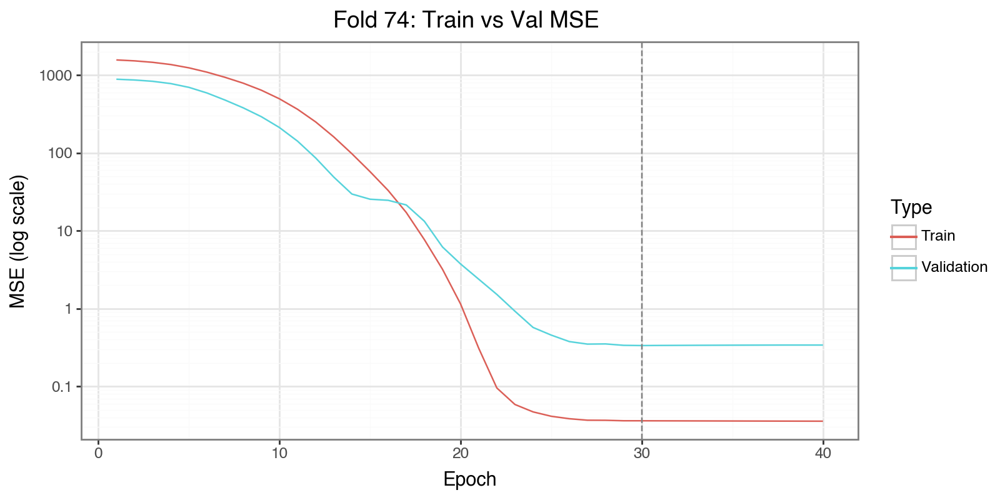

[Fold 75] stop at epoch 43


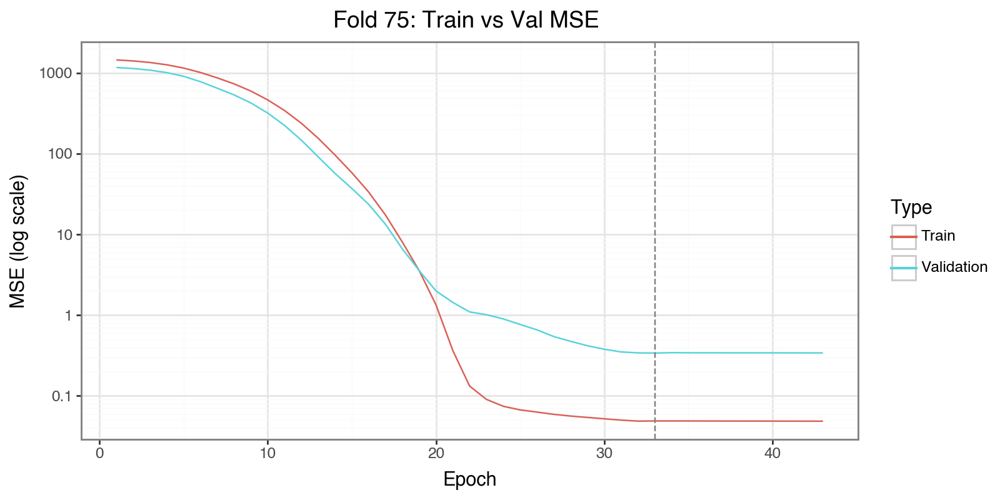

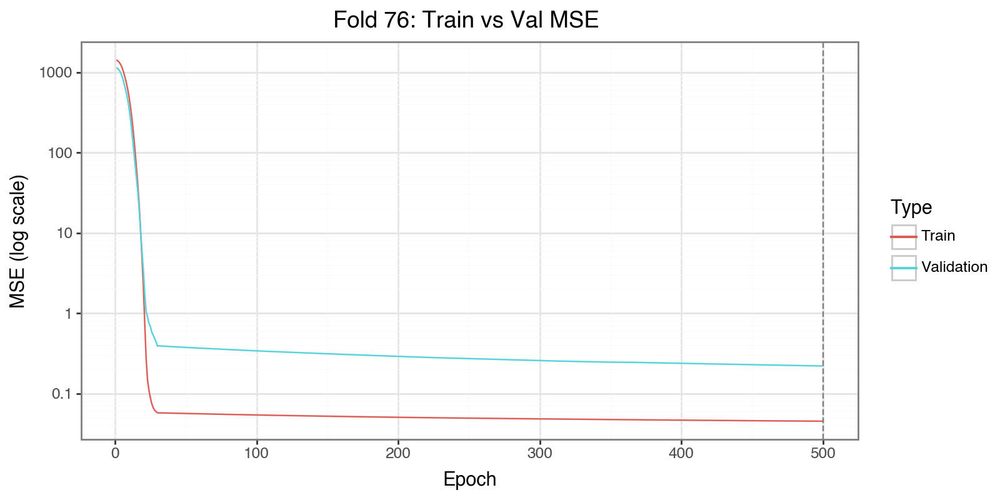

[Fold 77] stop at epoch 41


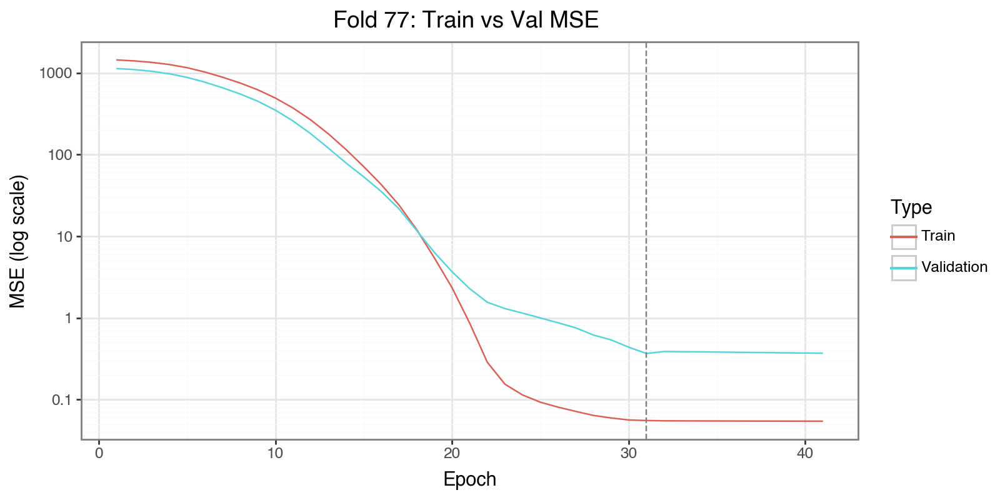

[Fold 78] stop at epoch 76


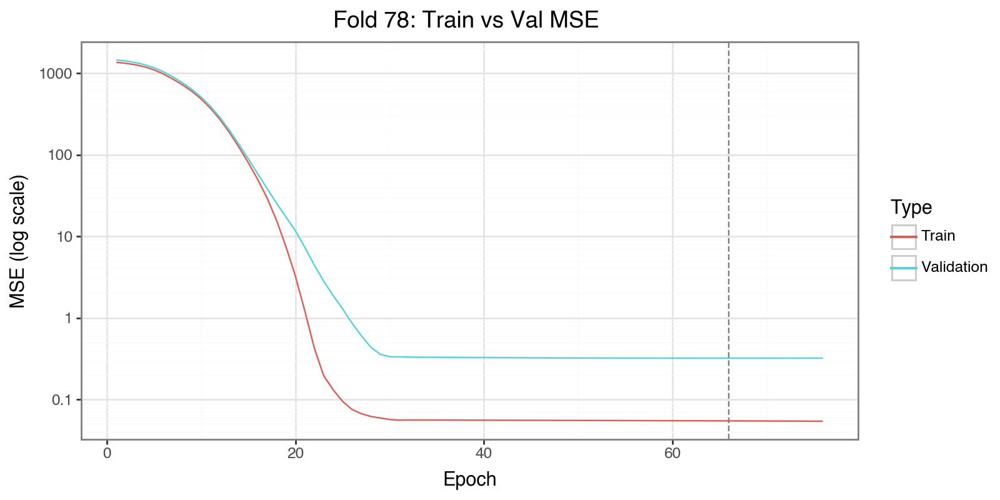

[Fold 79] stop at epoch 352


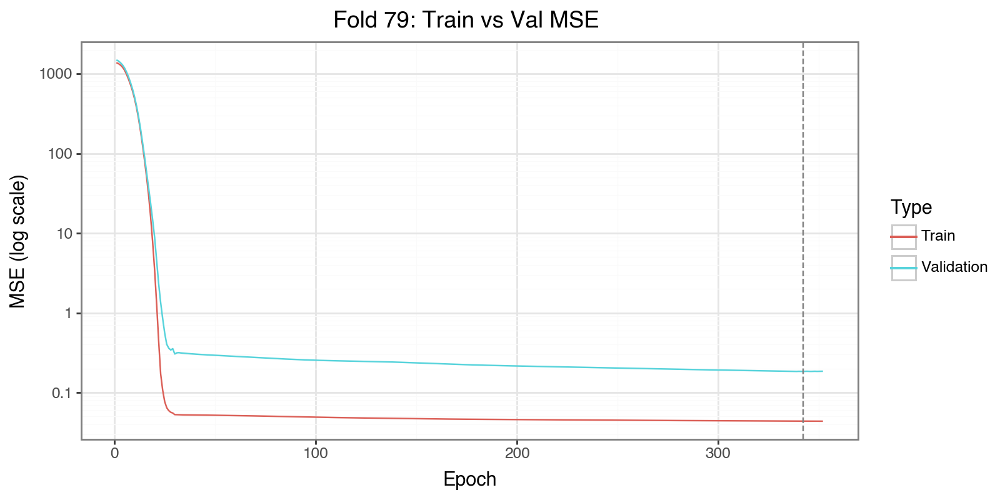

[Fold 80] stop at epoch 228


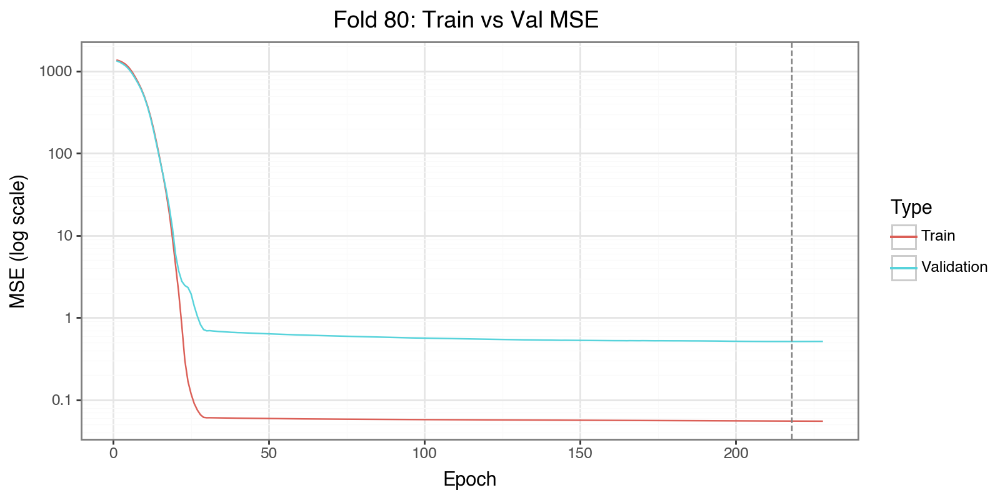

[Fold 81] stop at epoch 39


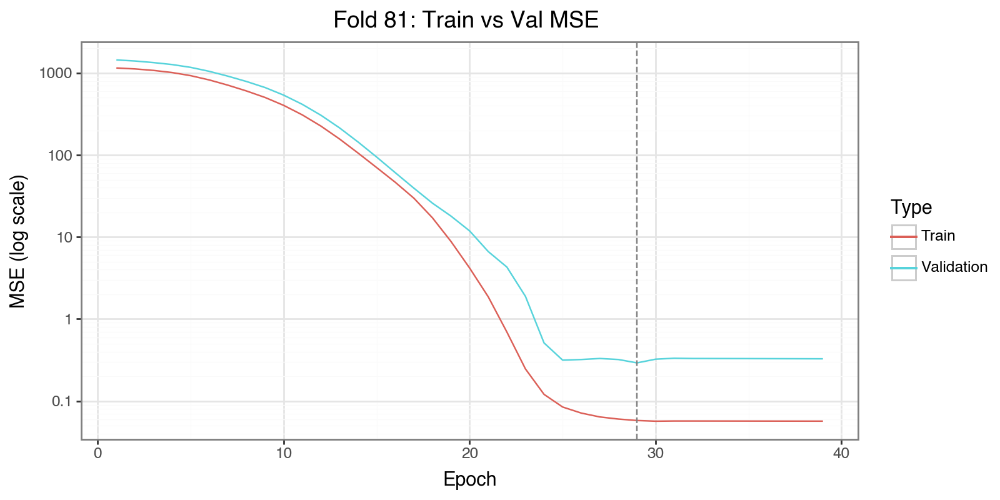

[Fold 82] stop at epoch 206


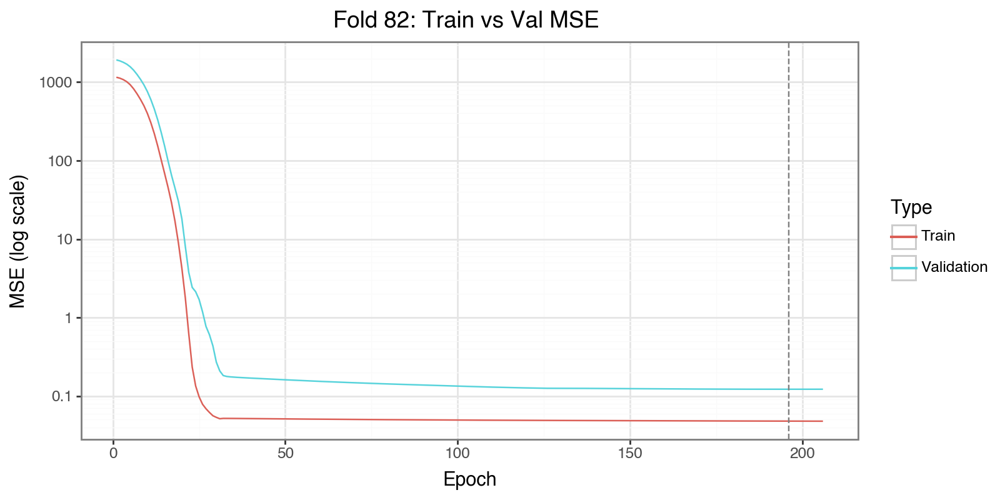

[Fold 83] stop at epoch 196


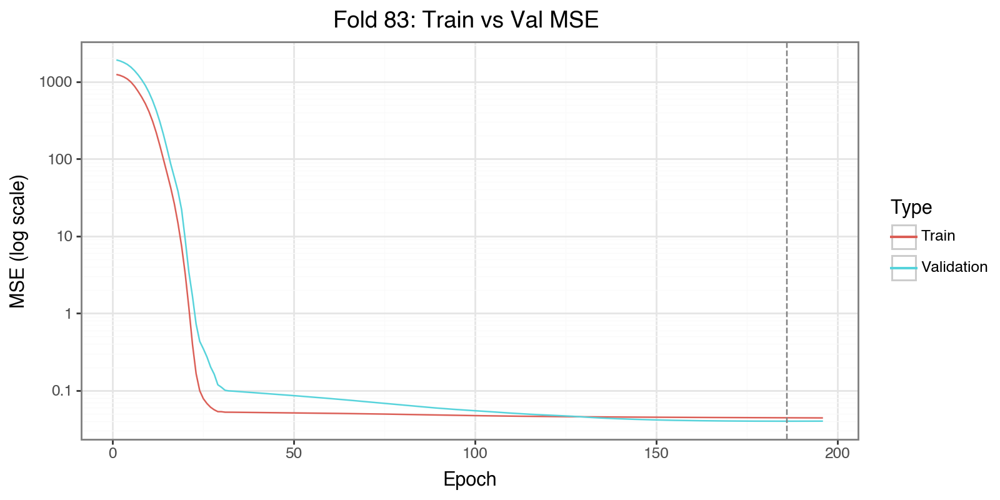

[Fold 84] stop at epoch 297


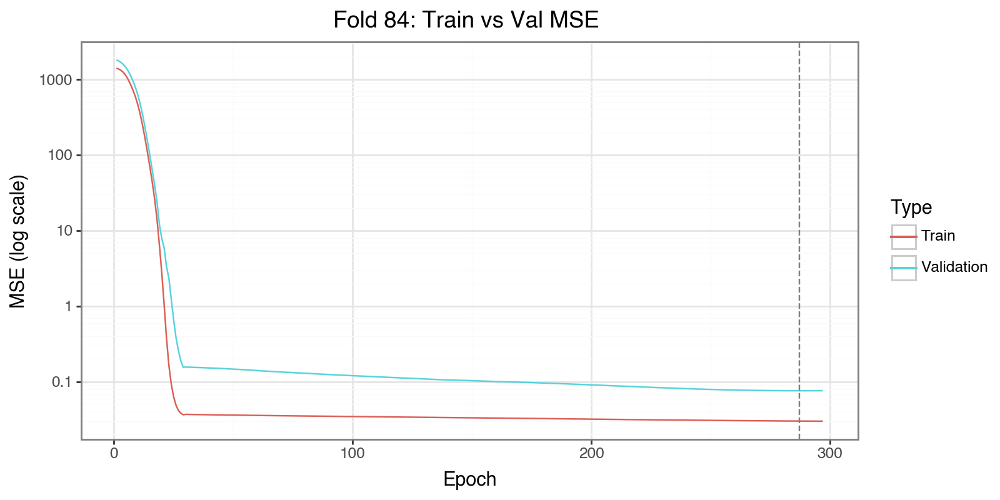

[Fold 85] stop at epoch 183


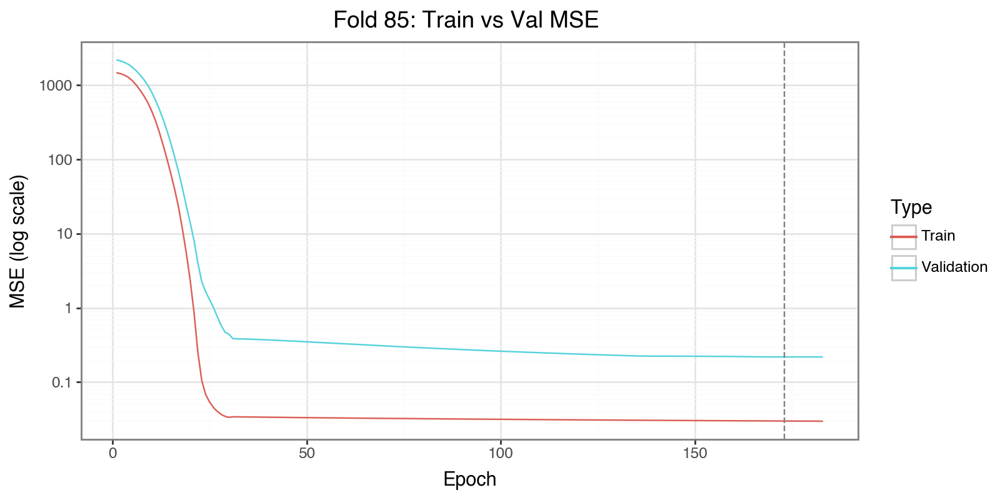

[Fold 86] stop at epoch 41


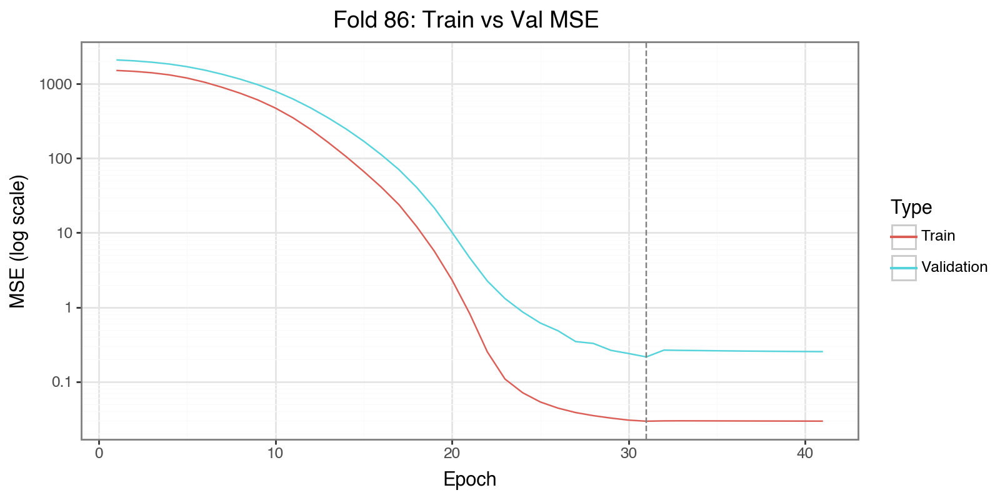

[Fold 87] stop at epoch 38


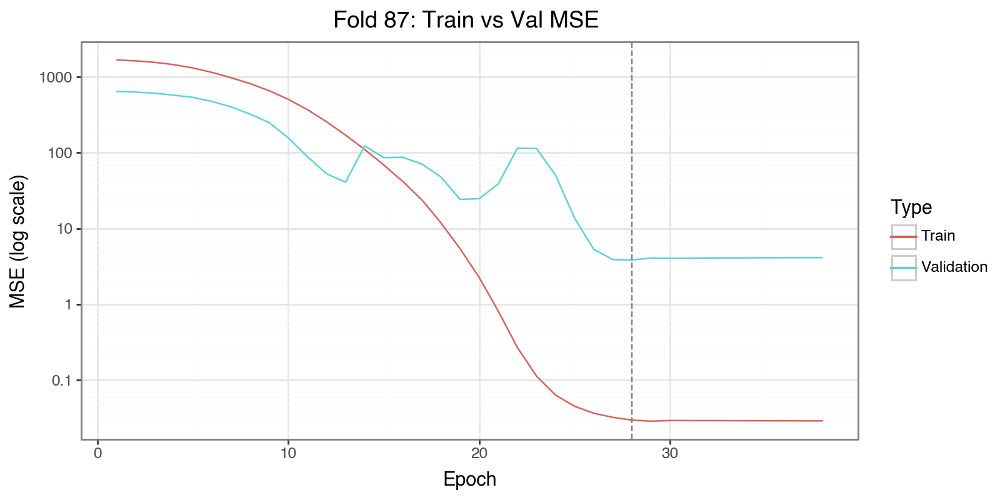

[Fold 88] stop at epoch 41


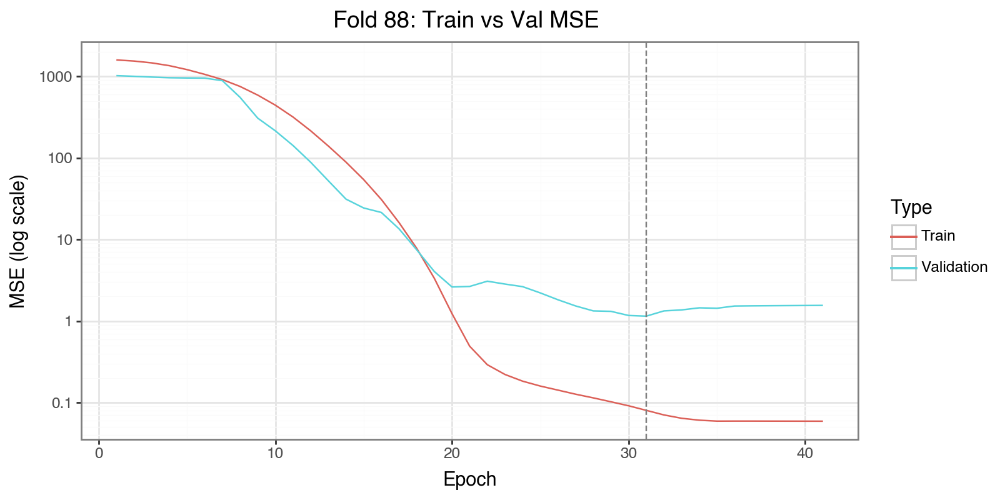

[Fold 89] stop at epoch 58


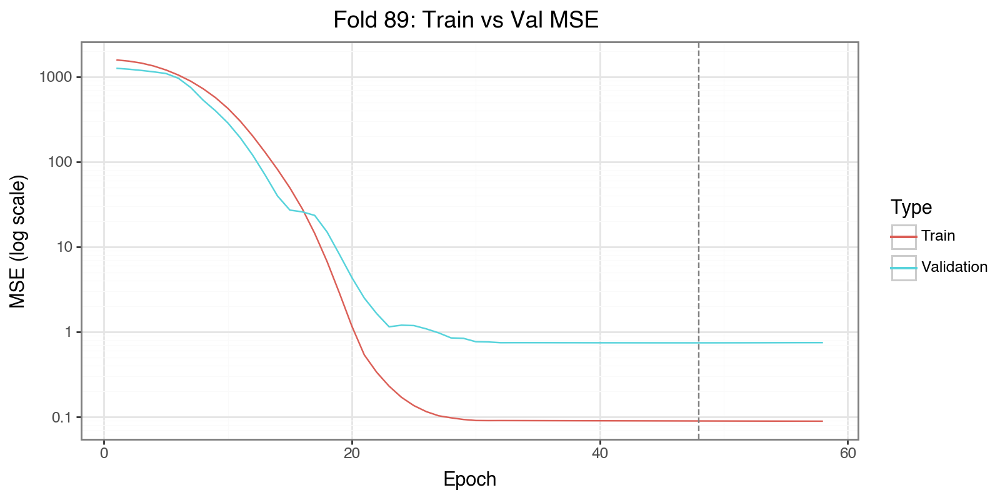

[Fold 90] stop at epoch 32


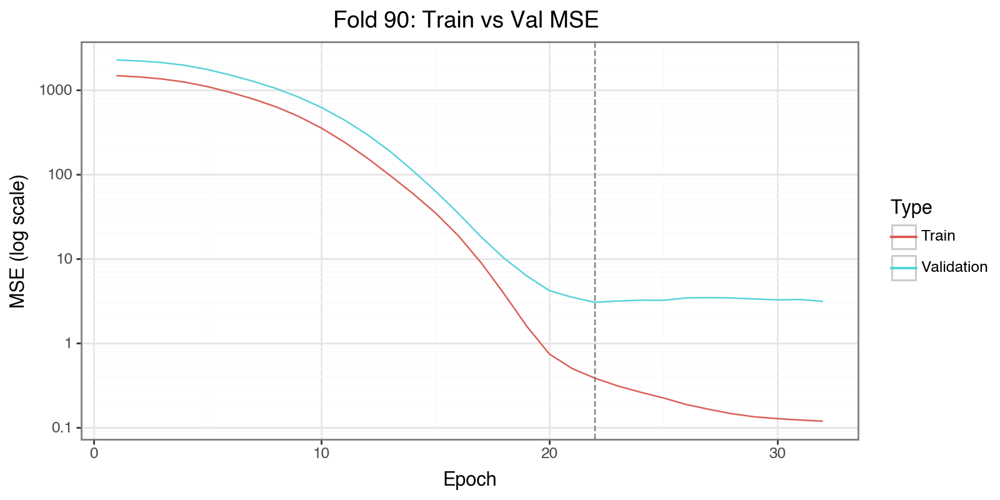

[Fold 91] stop at epoch 33


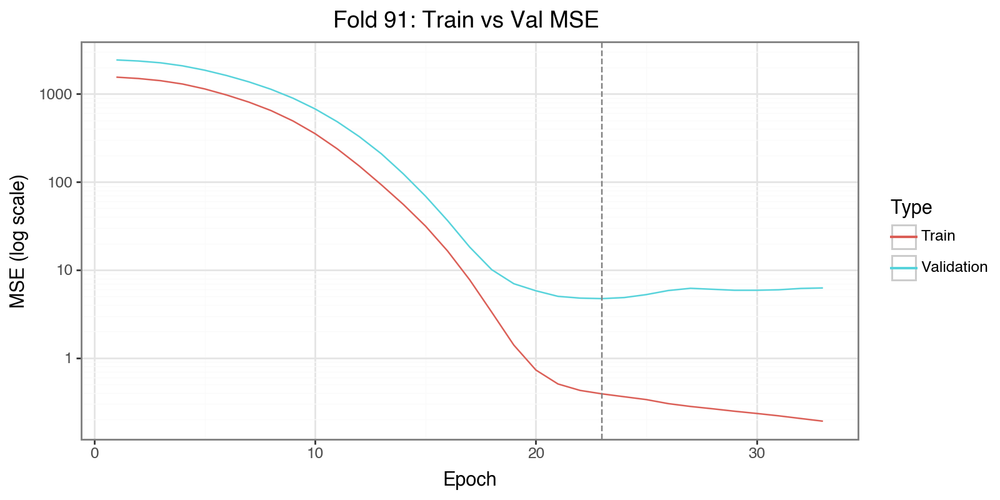

[Fold 92] stop at epoch 146


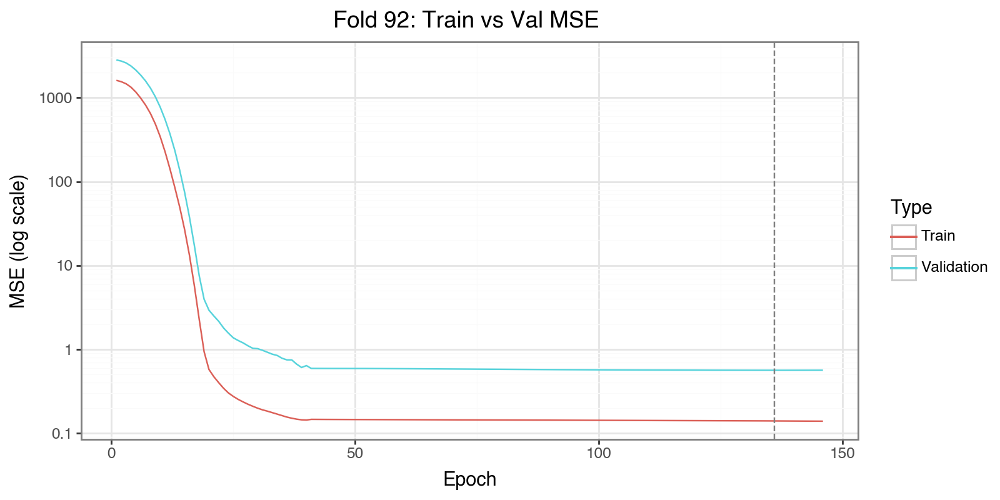

[Fold 93] stop at epoch 37


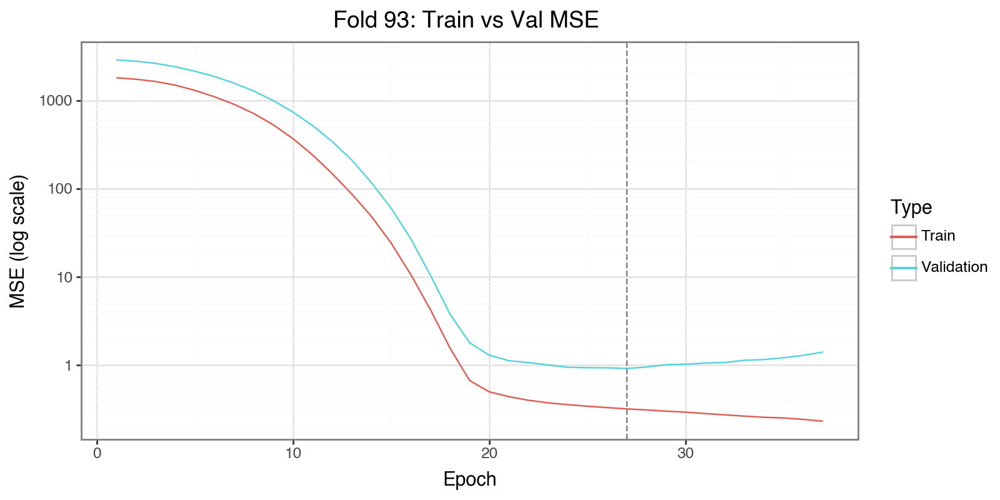

[Fold 94] stop at epoch 32


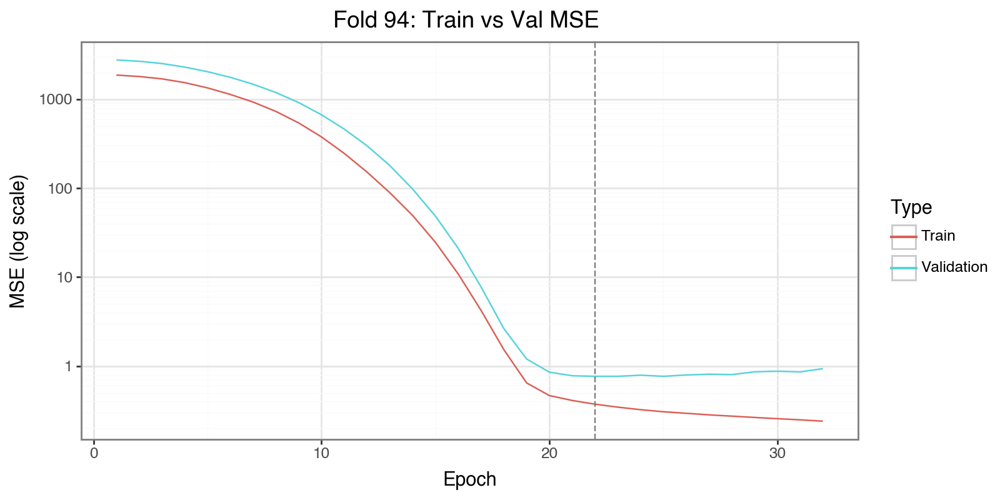

[Fold 95] stop at epoch 33


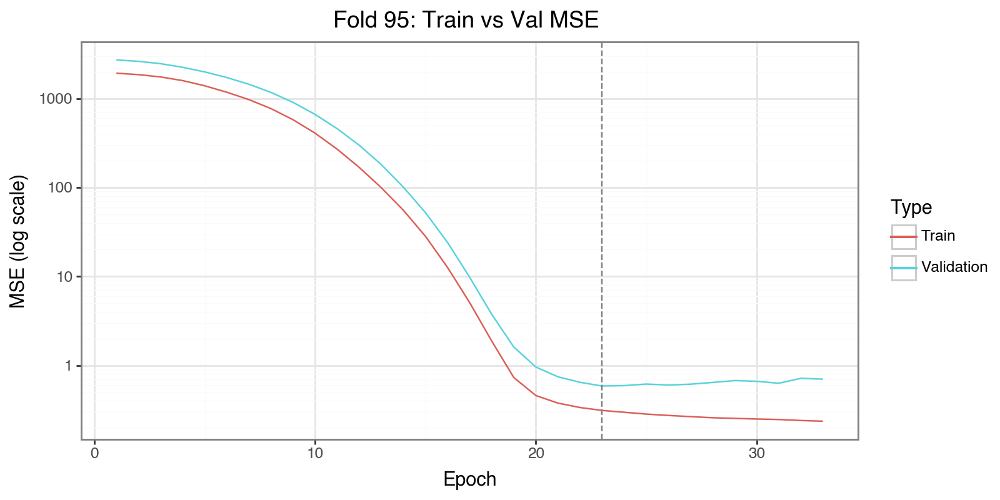

[Fold 96] stop at epoch 38


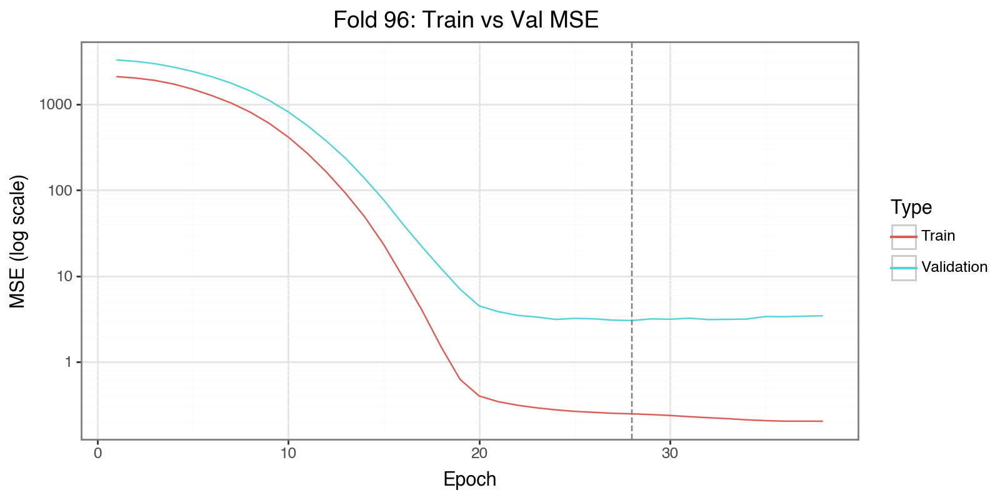

[Fold 97] stop at epoch 35


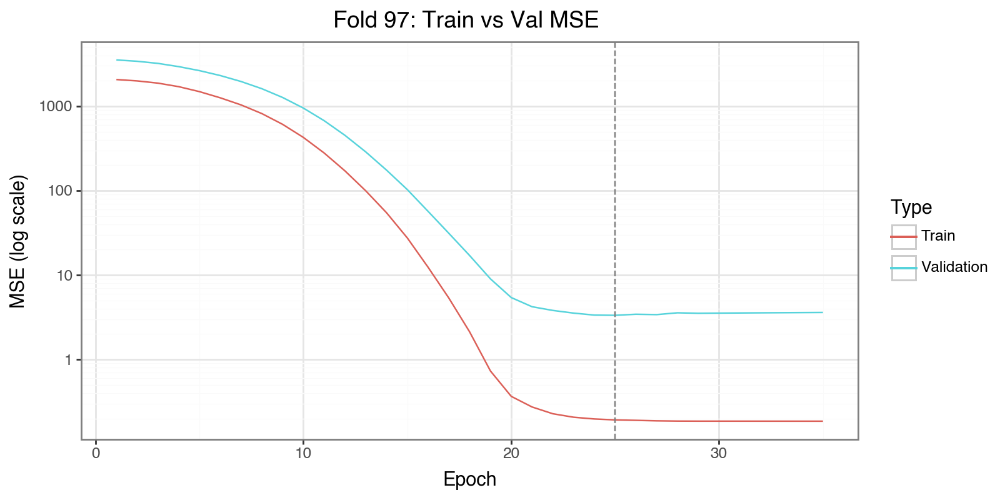

[Fold 98] stop at epoch 31


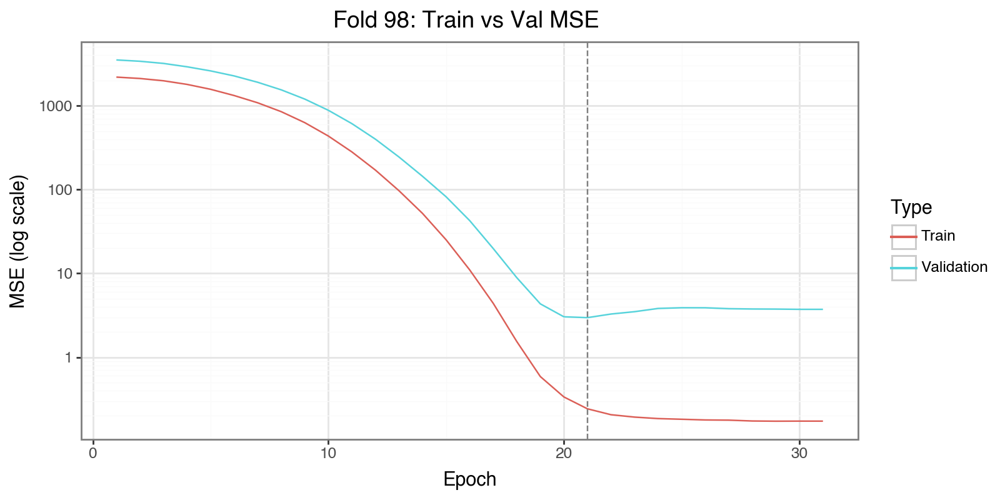

[Fold 99] stop at epoch 37


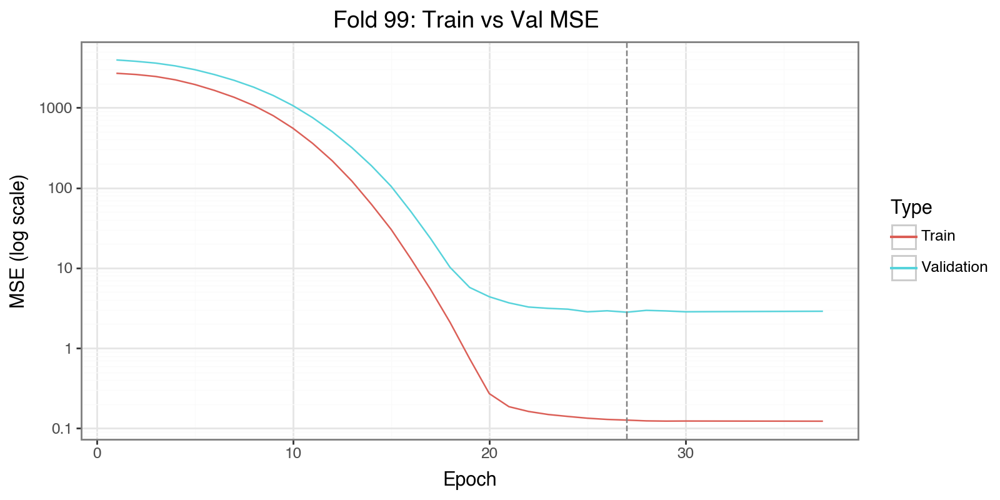

[Fold 100] stop at epoch 329


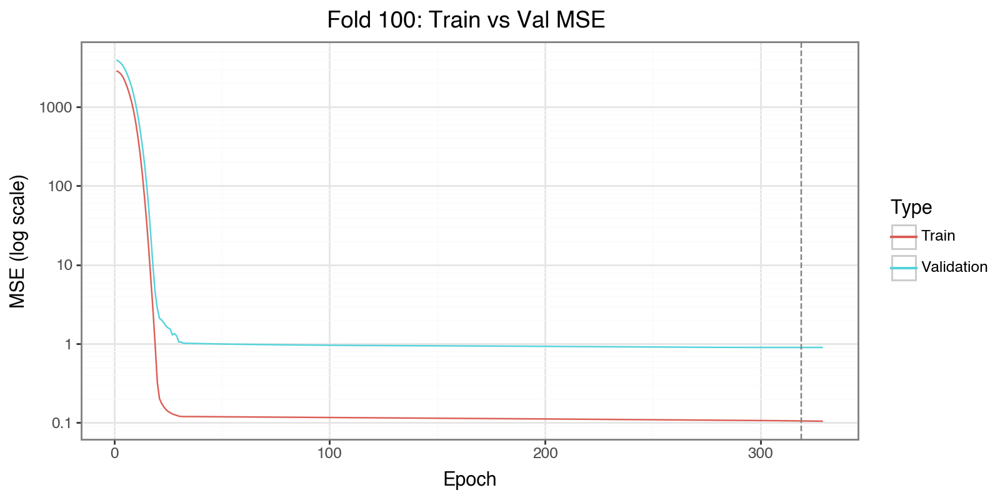

[Fold 101] stop at epoch 41


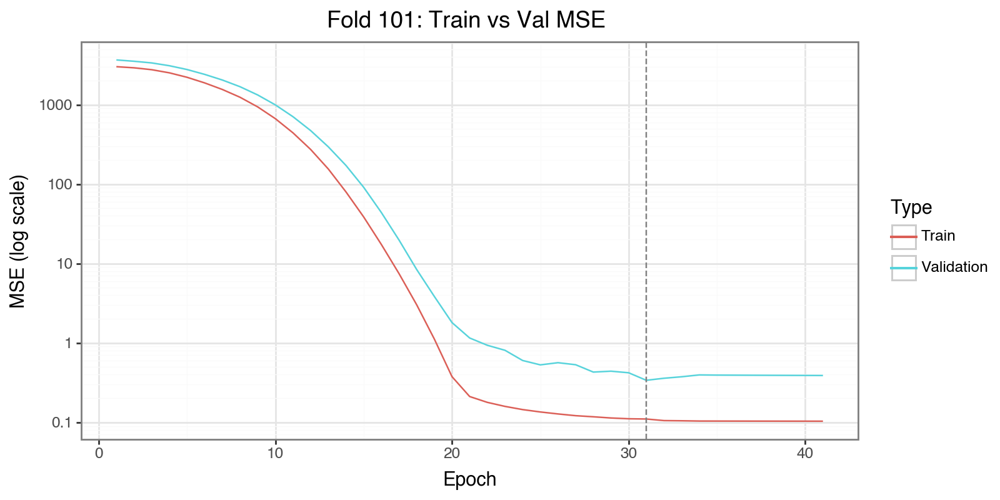

[Fold 102] stop at epoch 38


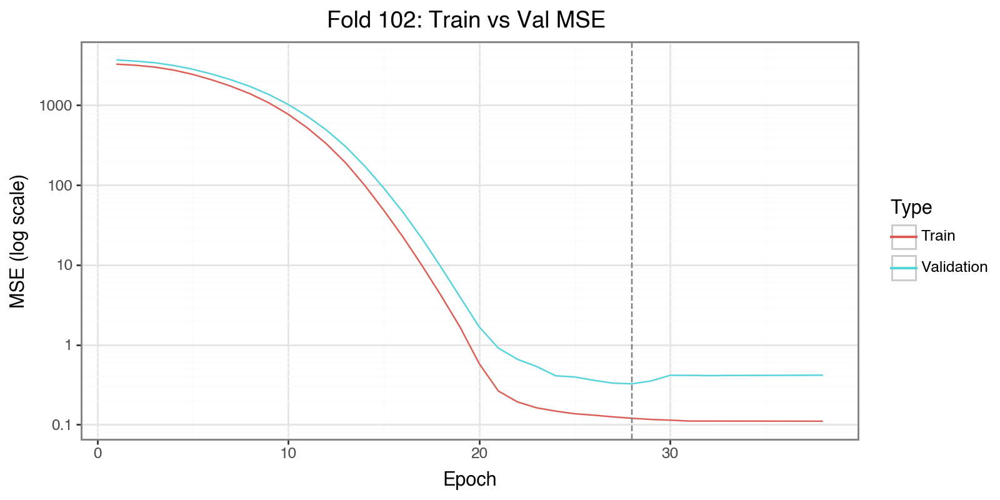

[Fold 103] stop at epoch 37


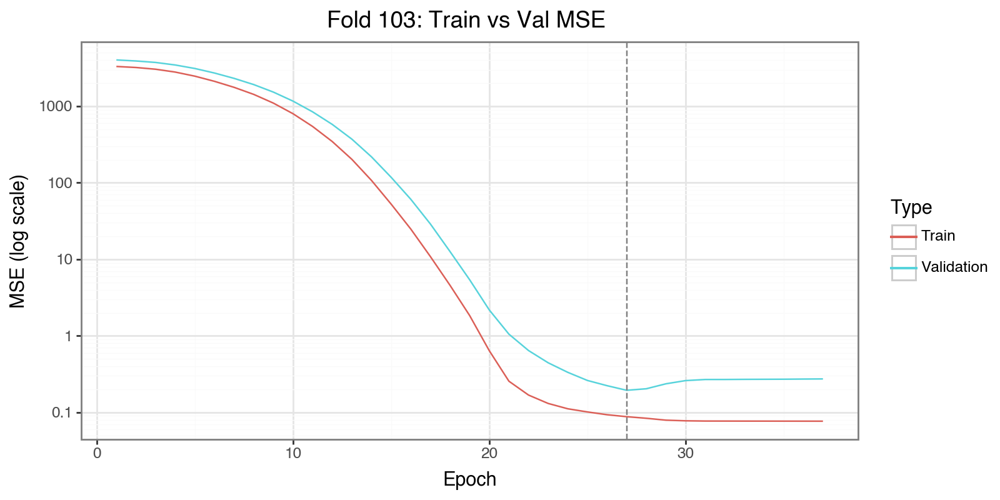

[Fold 104] stop at epoch 145


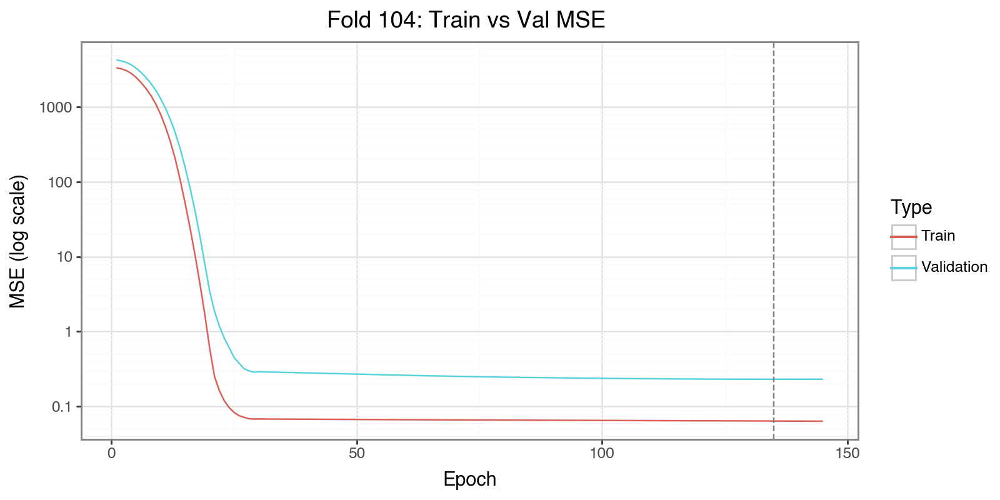

[Fold 105] stop at epoch 105


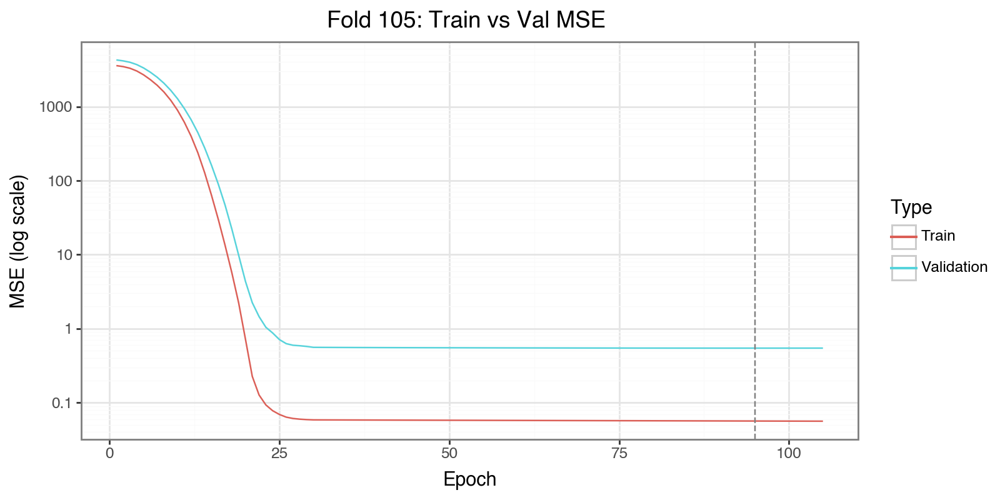

[Fold 106] stop at epoch 38


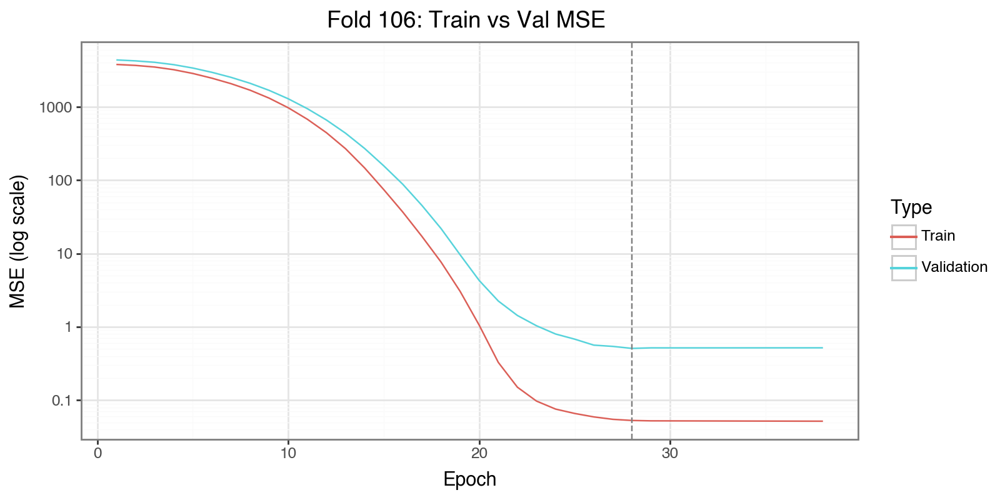

[Fold 107] stop at epoch 40


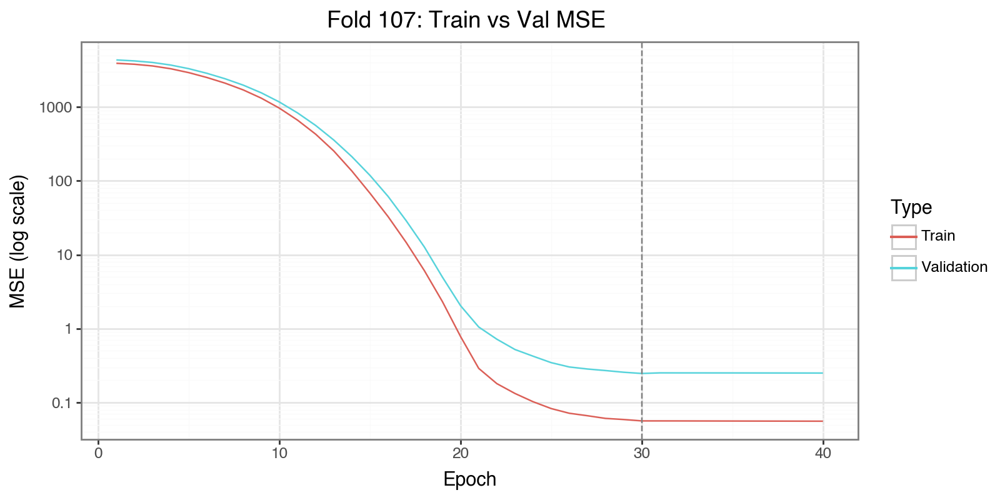

[Fold 108] stop at epoch 39


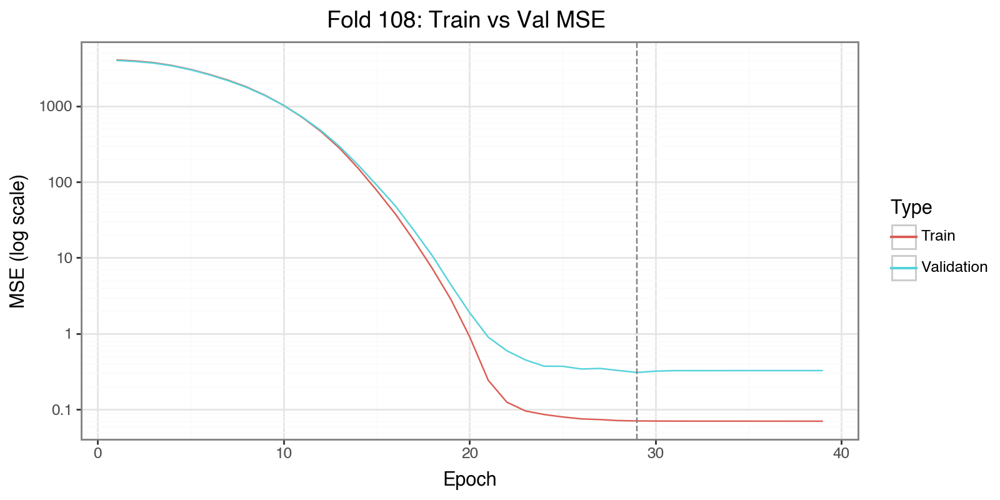

[Fold 109] stop at epoch 246


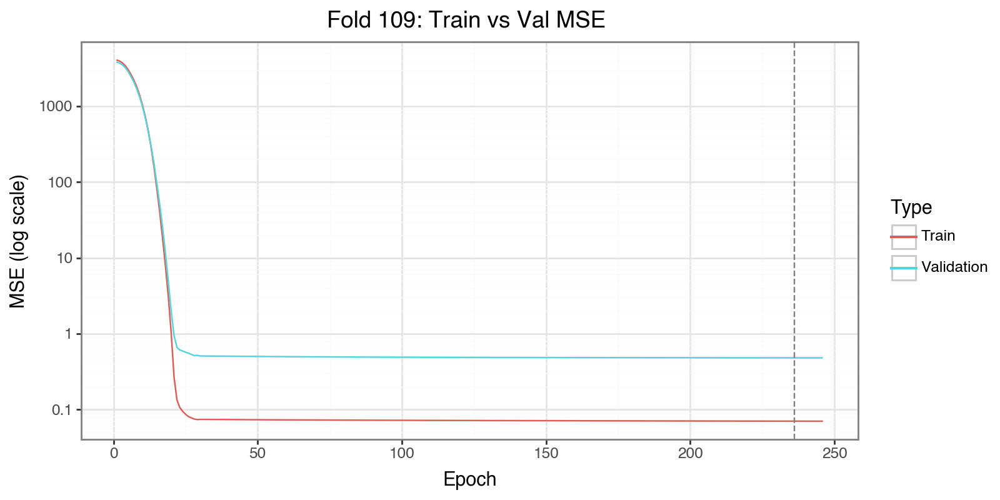

[Fold 110] stop at epoch 47


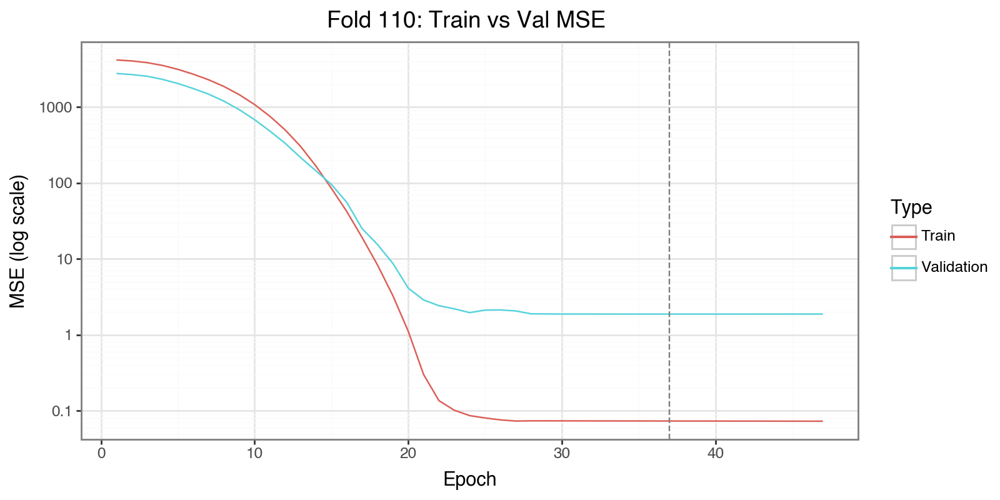

[Fold 111] stop at epoch 36


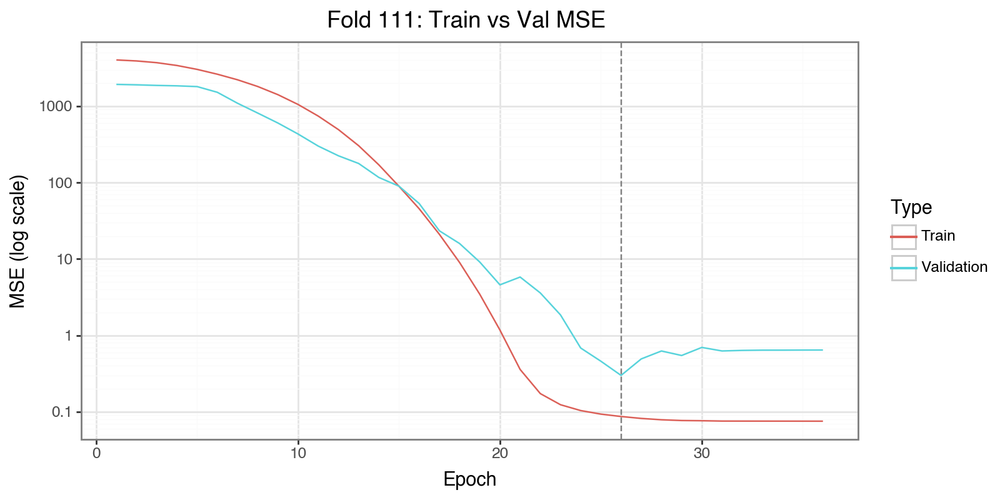

[Fold 112] stop at epoch 39


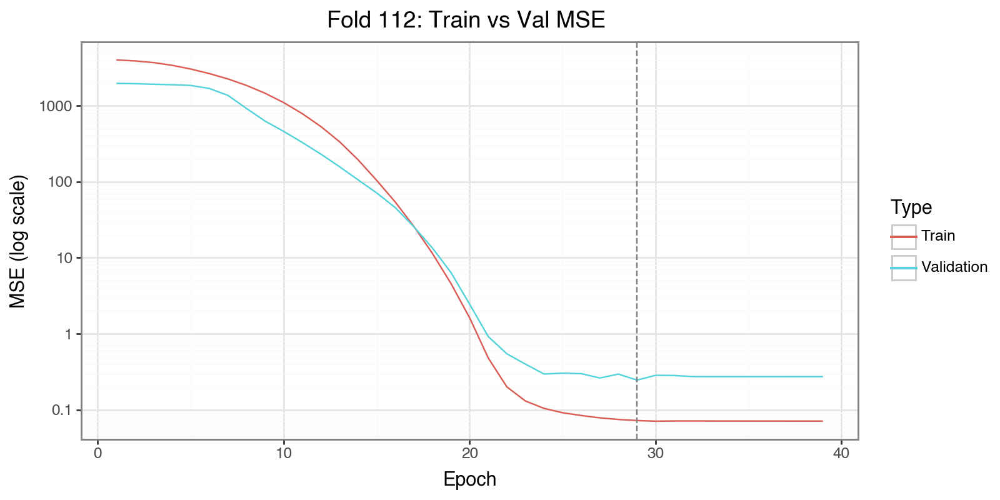

[Fold 113] stop at epoch 38


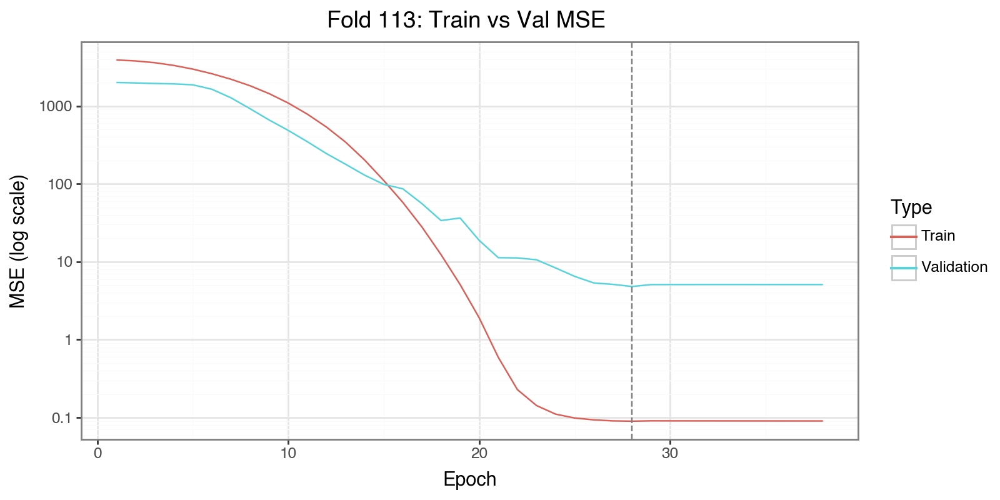

[Fold 114] stop at epoch 35


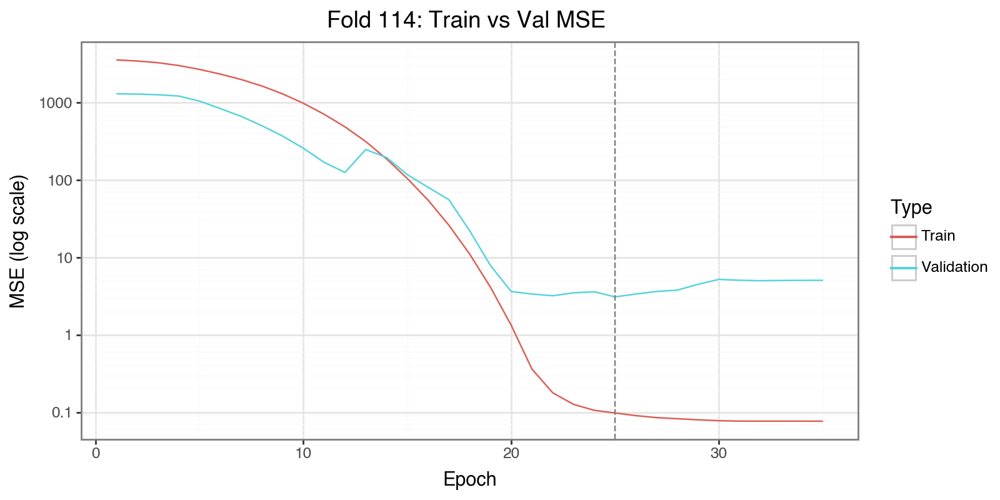

[Fold 115] stop at epoch 32


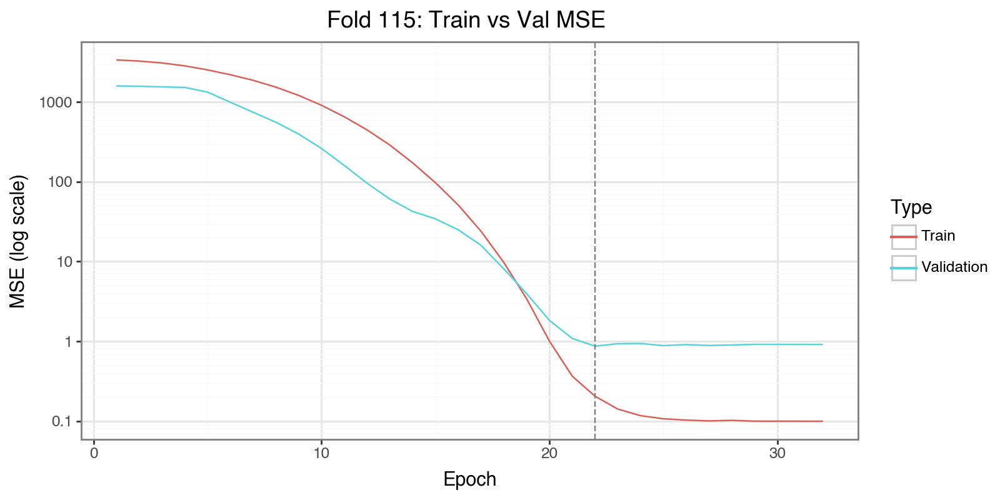

[Fold 116] stop at epoch 32


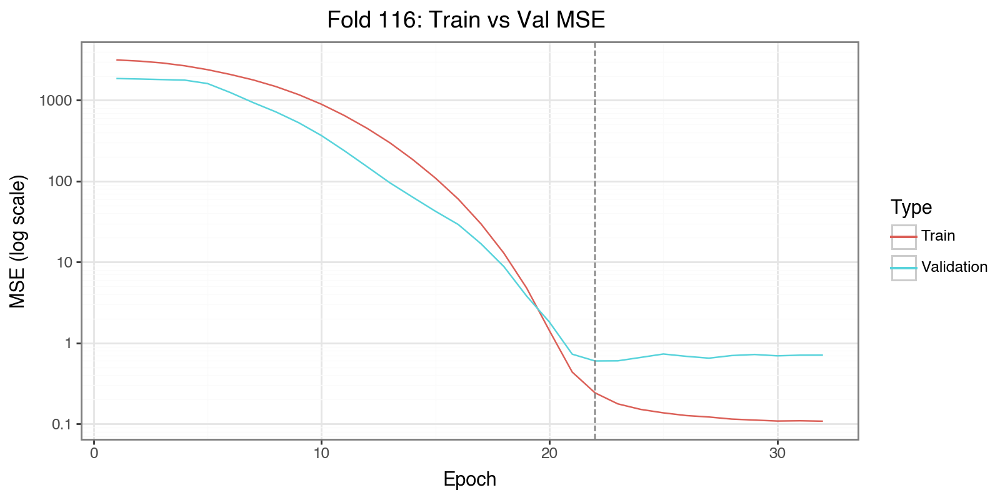

[Fold 117] stop at epoch 36


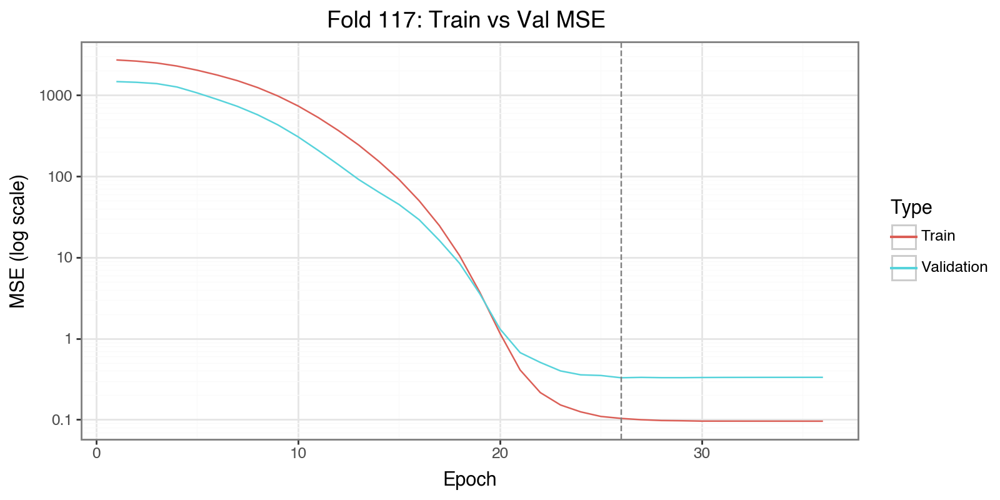

[Fold 118] stop at epoch 40


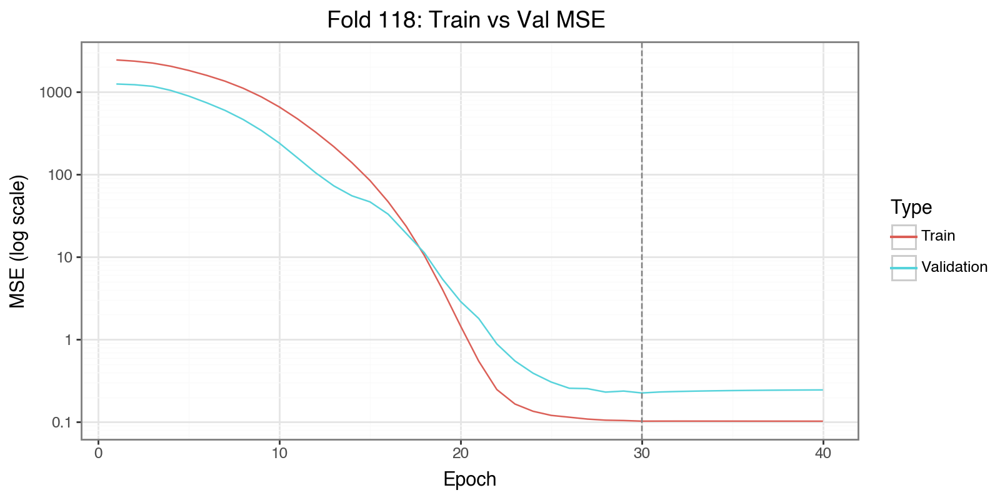

[Fold 119] stop at epoch 35


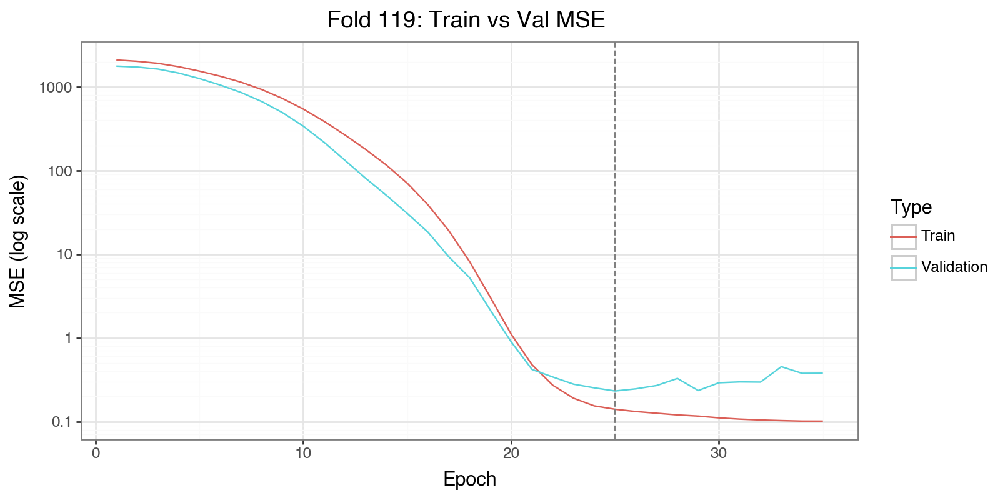

[Fold 120] stop at epoch 41


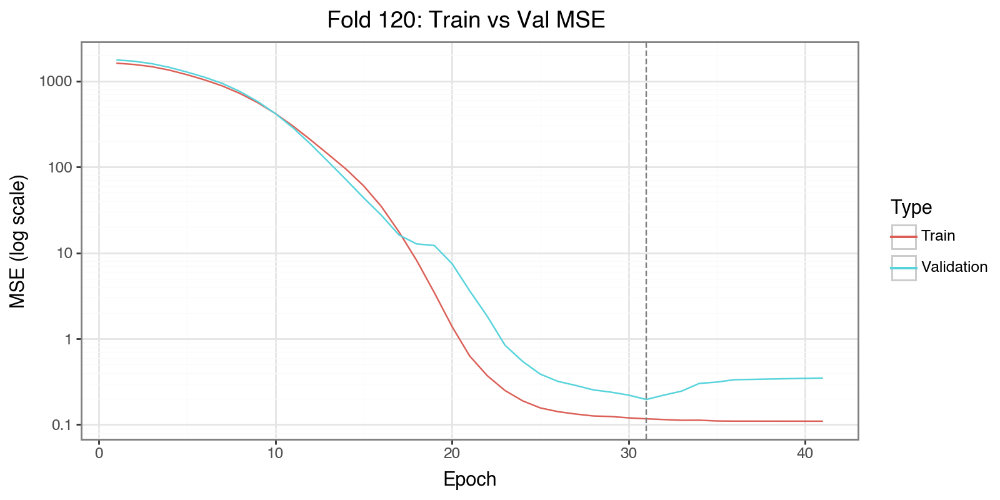

[Fold 121] stop at epoch 37


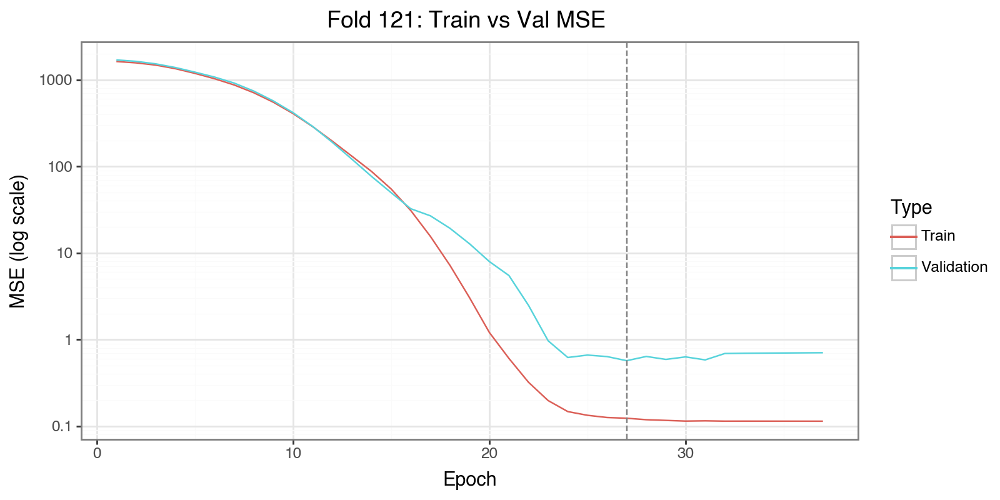

[Fold 122] stop at epoch 39


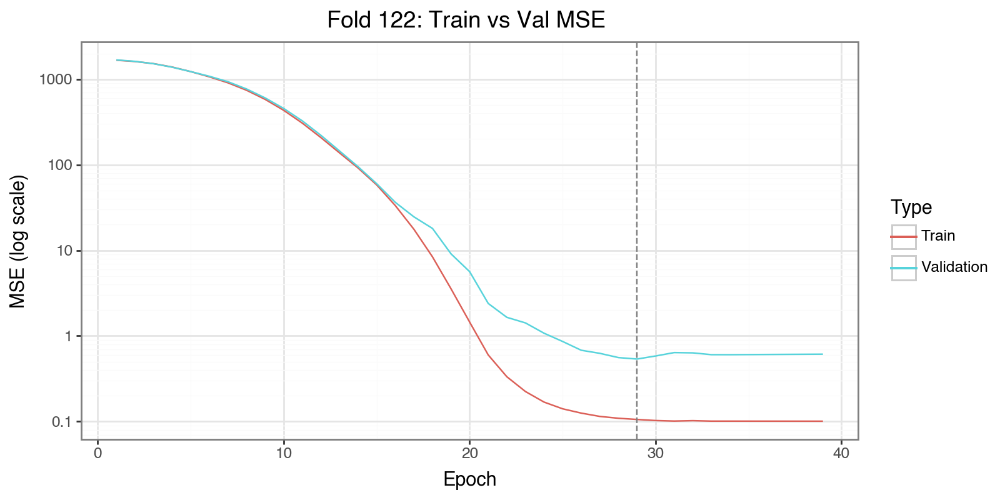

[Fold 123] stop at epoch 39


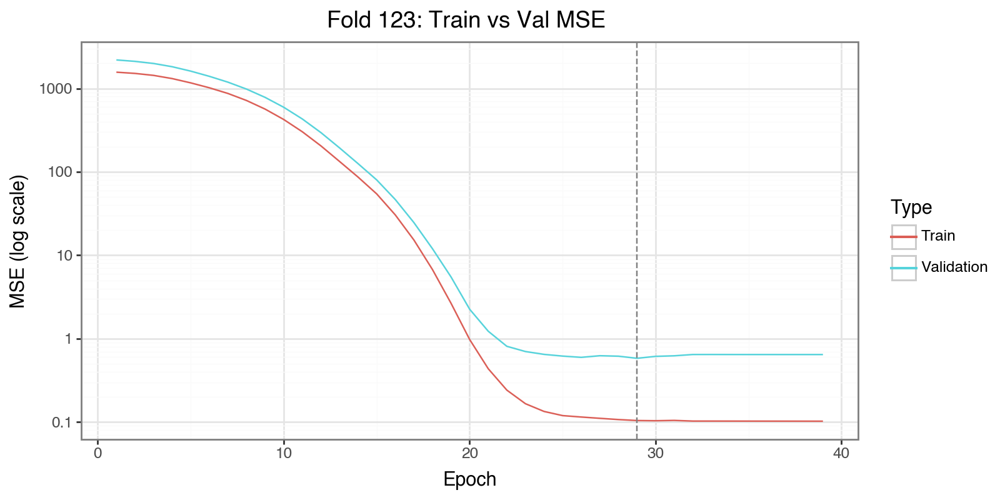

[Fold 124] stop at epoch 43


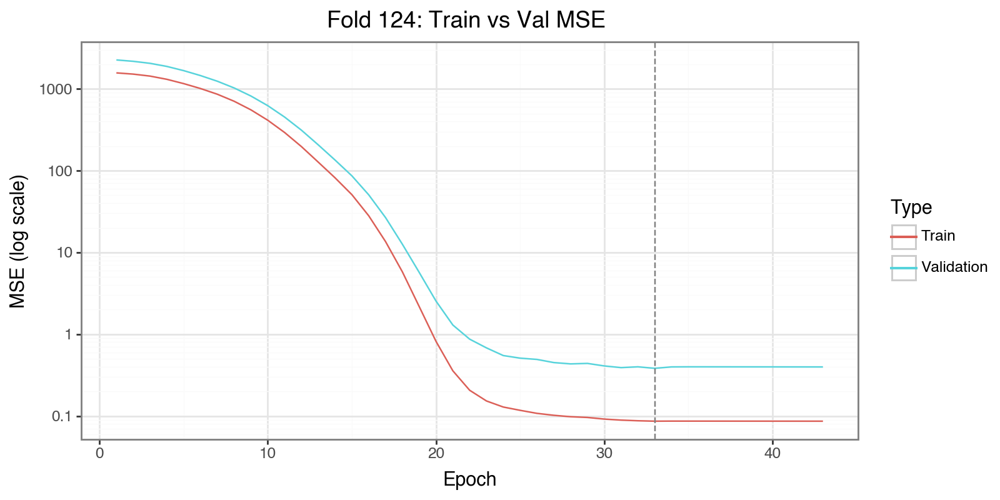

[Fold 125] stop at epoch 40


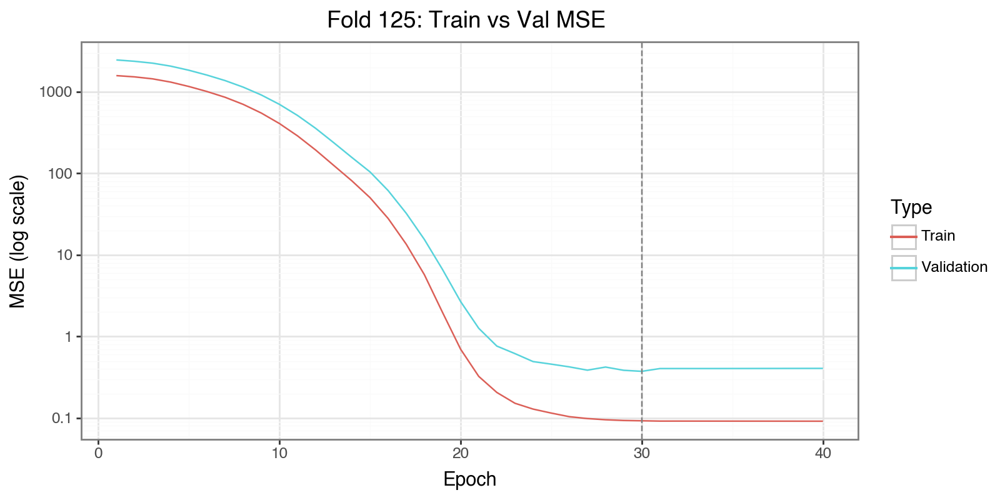

[Fold 126] stop at epoch 43


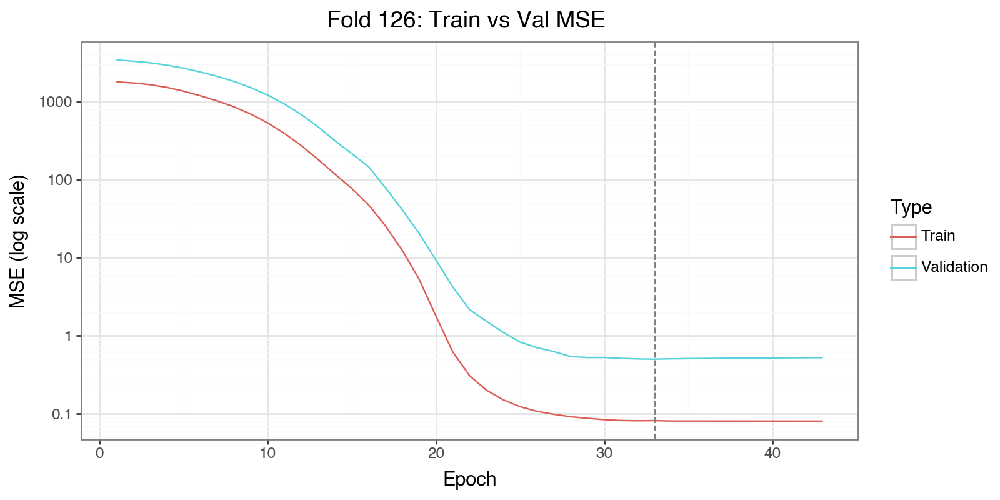

[Fold 127] stop at epoch 45


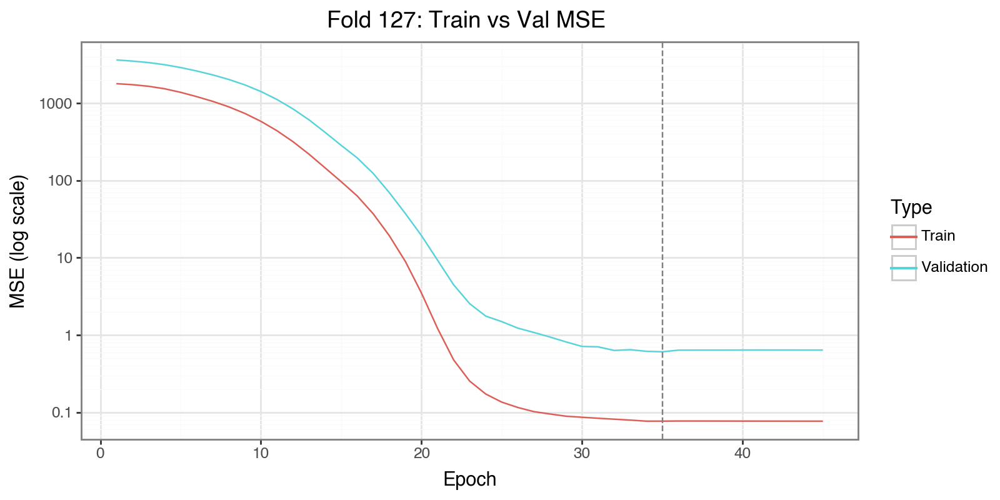

[Fold 128] stop at epoch 236


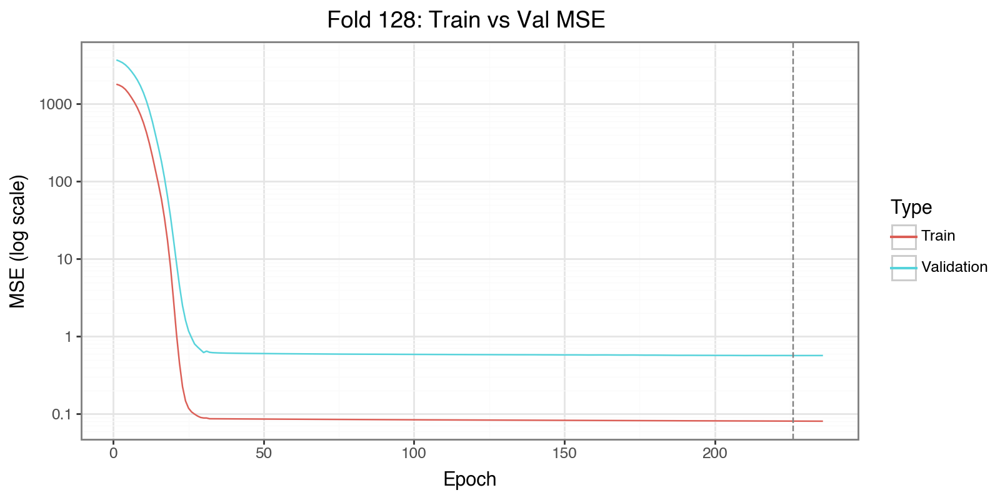

[Fold 129] stop at epoch 38


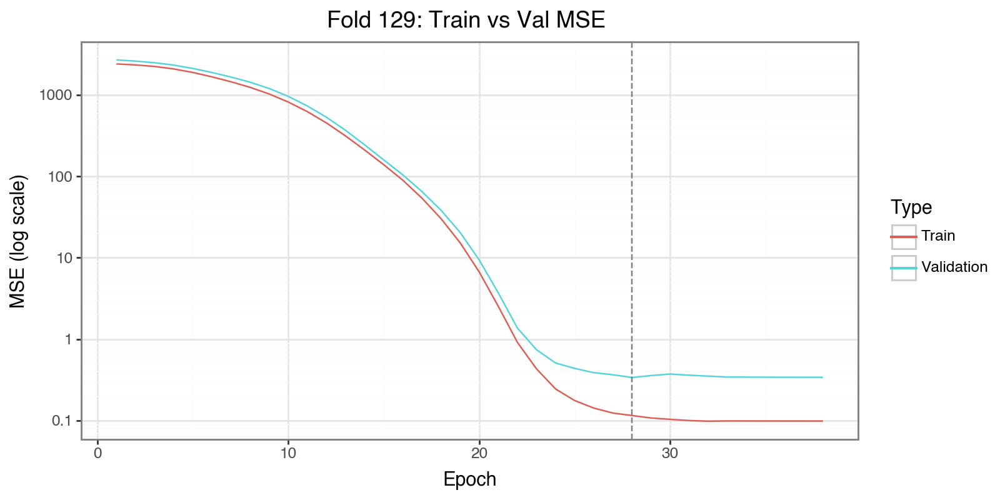

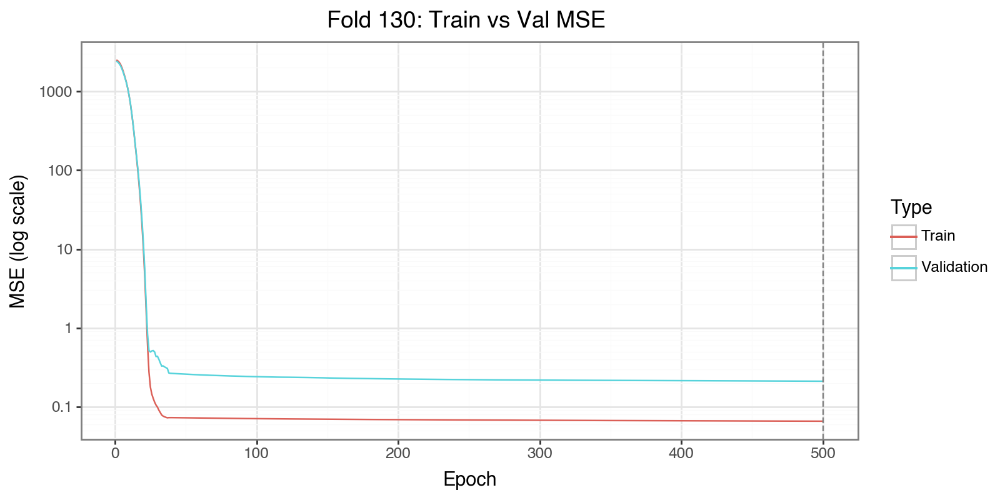

[Fold 131] stop at epoch 47


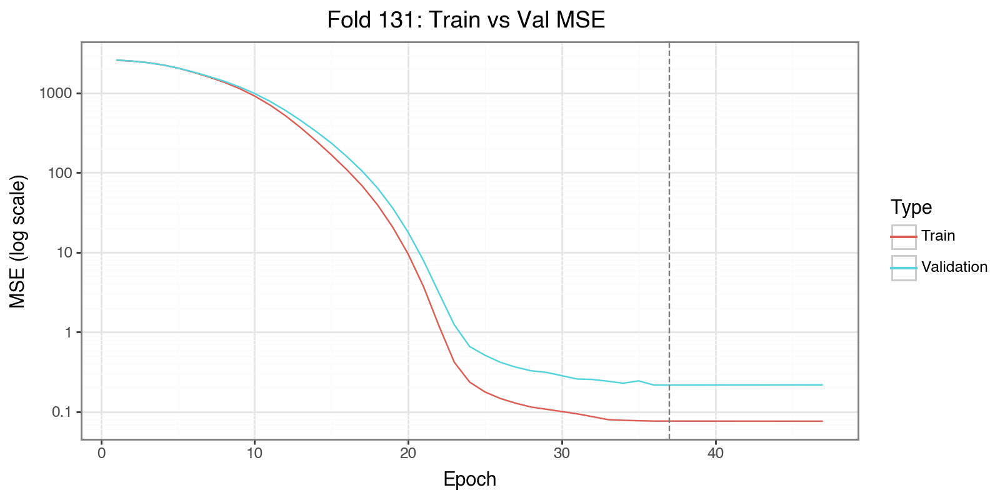

[Fold 132] stop at epoch 42


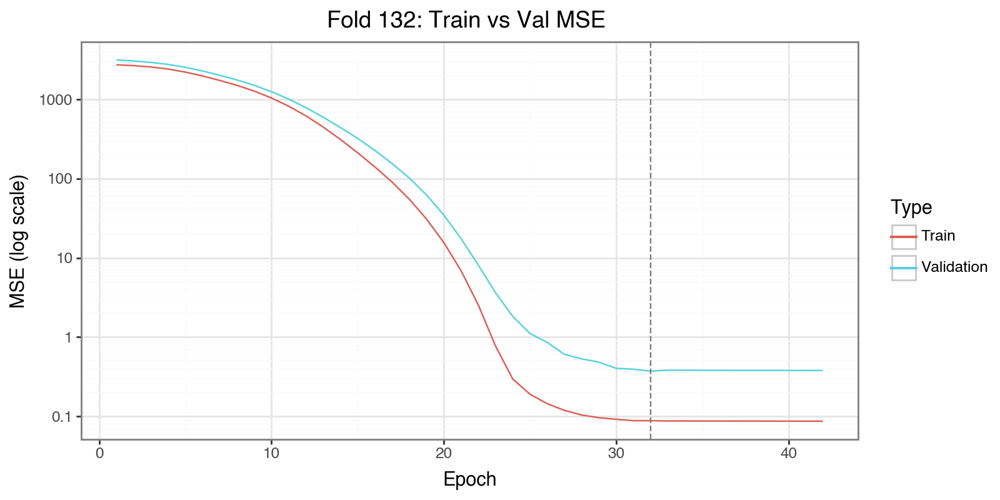

[Fold 133] stop at epoch 172


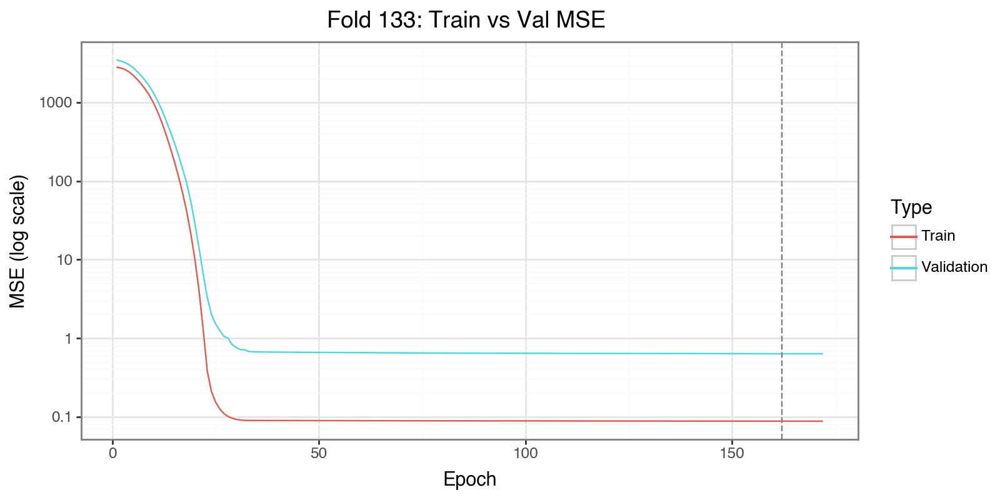

[Fold 134] stop at epoch 41


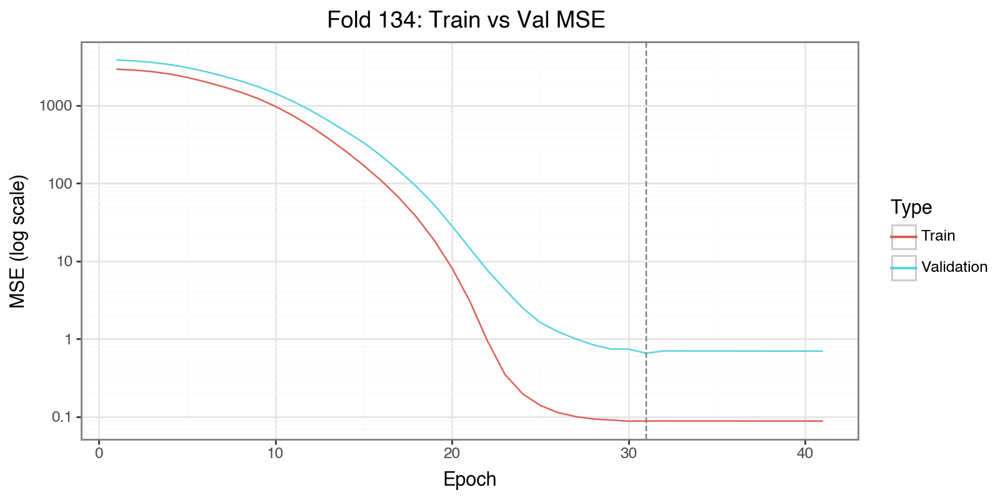

In [ ]:
# Compute fold starts (monthly)
max_start = last_date - relativedelta(months=train_months+test_months) + timedelta(days=1)
fold_starts, dt = [], first_date
while dt <= max_start:
    fold_starts.append(dt)
    dt += relativedelta(months=1)

# Containers for collecting metrics
mlp_train_rmse, mlp_val_rmse, mlp_test_rmse = [], [], []
mlp_train_mae,  mlp_val_mae,  mlp_test_mae  = [], [], []
bs_test_rmse, bs_test_mae              = [], []
tri_test_rmse, tri_test_mae              = [], []

mlp_seg_rmse = {s:[] for s in ["ITM","ATM","OTM"]}
mlp_seg_mae  = {s:[] for s in ["ITM","ATM","OTM"]}
bs_seg_rmse  = {s:[] for s in ["ITM","ATM","OTM"]}
bs_seg_mae   = {s:[] for s in ["ITM","ATM","OTM"]}
# tri_seg_rmse  = {s:[] for s in ["ITM","ATM","OTM"]}
# tri_seg_mae   = {s:[] for s in ["ITM","ATM","OTM"]}
epoch_metrics = {"fold":[], "epoch":[],
                 "train_mse":[], "val_mse":[],
                 "train_mae":[], "val_mae":[]}
best_epochs = []
dm_test_results = [] # New list for our test data for HLN DM
test_dates = []

# Walk-forward with immediate early stopping
for fold, start in enumerate(fold_starts, 1):
    # set windows
    train_end  = start + relativedelta(months=train_months) - timedelta(days=1)
    test_start = train_end + timedelta(days=1)
    test_end   = test_start + relativedelta(months=test_months) - timedelta(days=1)

    test_dates.append((fold, test_start, test_end))

    tr = run[(run["quotedate"] >= start) & (run["quotedate"] <= train_end)]
    te = run[(run["quotedate"] >= test_start) & (run["quotedate"] <= test_end)].copy()
    if tr.empty or te.empty: 
        continue

    # features & target
    X_tr, y_tr = tr[features], tr[target]
    X_te, y_te = te[features], te[target]
    X_tr_fit, X_val, y_tr_fit, y_val = train_test_split(
        X_tr, y_tr, test_size=0.2, shuffle=False
    )

    # scale
    scaler = StandardScaler().fit(X_tr_fit)
    X_tr_sc, X_val_sc, X_te_sc = map(scaler.transform, (X_tr_fit, X_val, X_te))

    # MLP warm-start
    mlp = MLPRegressor(
        hidden_layer_sizes=(10,),     # change depending on Deep MLP three layer vs one hidden layer
        activation="logistic",
        alpha=1e-4,
        max_iter=1,
        warm_start=True,
        random_state=42
    )

    # early-stop trackers
    #prev_val_mse = np.inf
    best_val_mse = np.inf
    best_model = None
    best_epoch = 0

    patience = 10           
    patience_counter = 0

    # per-epoch storage
    tr_mse_curve, va_mse_curve = [], []
    tr_mae_curve, va_mae_curve = [], []

    for epoch in range(1, n_epochs+1):
        mlp.max_iter = epoch
        mlp.fit(X_tr_sc, y_tr_fit)

        # preds and metrics
        y_tr_pred  = mlp.predict(X_tr_sc)
        y_val_pred = mlp.predict(X_val_sc)
        tr_mse = mean_squared_error(y_tr_fit, y_tr_pred)
        va_mse = mean_squared_error(y_val,    y_val_pred)
        tr_mae = mean_absolute_error(y_tr_fit, y_tr_pred)
        va_mae = mean_absolute_error(y_val,    y_val_pred)

        # record curves
        tr_mse_curve.append(tr_mse); va_mse_curve.append(va_mse)
        tr_mae_curve.append(tr_mae); va_mae_curve.append(va_mae)

        # record epoch-level metrics
        epoch_metrics["fold"].append(fold)
        epoch_metrics["epoch"].append(epoch)
        epoch_metrics["train_mse"].append(tr_mse)
        epoch_metrics["val_mse"].append(va_mse)
        epoch_metrics["train_mae"].append(tr_mae)
        epoch_metrics["val_mae"].append(va_mae)

        # snapshot if best
        if va_mse < best_val_mse:
            best_val_mse = va_mse
            best_epoch = epoch
            best_model = copy.deepcopy(mlp)
            patience_counter = 0
        else:
            patience_counter += 1


        # immediate stop if val-MSE exceeds patience
        if patience_counter >= patience:
            print(f"[Fold {fold}] stop at epoch {epoch}")
            break

        prev_val_mse = va_mse

    best_epochs.append(best_epoch)

    # use best_model for predictions
    y_tr_full  = best_model.predict(X_tr_sc)
    y_val_full = best_model.predict(X_val_sc)
    y_te_pred  = best_model.predict(X_te_sc)

    # fold level MLP metrics
    mlp_train_rmse.append(np.sqrt(mean_squared_error(y_tr_fit, y_tr_full)))
    mlp_val_rmse.append(  np.sqrt(mean_squared_error(y_val,     y_val_full)))
    mlp_test_rmse.append( np.sqrt(mean_squared_error(y_te,      y_te_pred)))
    mlp_train_mae.append(mean_absolute_error(y_tr_fit, y_tr_full))
    mlp_val_mae.append(  mean_absolute_error(y_val,    y_val_full))
    mlp_test_mae.append( mean_absolute_error(y_te,     y_te_pred))

    bs_pred = te["black_scholes"].values
    bs_test_rmse.append(np.sqrt(mean_squared_error(y_te, bs_pred)))
    bs_test_mae.append(mean_absolute_error(y_te, bs_pred))


    
    # segment metrics
    te["mlp_pred"], te["bs_pred"],  = y_te_pred, bs_pred    
    te["segment"] = np.where(
        te["moneyness"]>atm_thresh, "ITM",
        np.where(te["moneyness"]<-atm_thresh, "OTM", "ATM")
    )
    for seg in ["ITM","ATM","OTM"]:
        sub = te[te["segment"]==seg]
        if not sub.empty:
            mlp_seg_rmse[seg].append(np.sqrt(mean_squared_error(sub[target], sub["mlp_pred"])))
            mlp_seg_mae[seg].append( mean_absolute_error(   sub[target], sub["mlp_pred"]))
            bs_seg_rmse[seg].append(  np.sqrt(mean_squared_error(sub[target], sub["bs_pred"])))
            bs_seg_mae[seg].append(   mean_absolute_error(   sub[target], sub["bs_pred"]))
            


    # Create a results dataframe for this fold
    fold_results = te[["quotedate","S", "K", "T", "moneyness", "segment", target]].copy()
    fold_results.rename(columns={target: 'actual_price'}, inplace=True)
    fold_results['mlp_price'] = y_te_pred
    fold_results['bs_price'] = bs_pred

    # Calculate squared errors and the loss differential
    fold_results['mlp_sq_error'] = (fold_results['mlp_price'] - fold_results['actual_price'])**2
    fold_results['bs_sq_error'] = (fold_results['bs_price'] - fold_results['actual_price'])**2


    fold_results['loss_differential'] = fold_results['mlp_sq_error'] - fold_results['bs_sq_error']

    # Append the essential data for this fold to our master list
    # If dm_test_results is a DataFrame, .append() does not modify in-place; it returns a new DataFrame.

    if isinstance(dm_test_results, list):
        dm_test_results.append(fold_results[['quotedate', 'segment', 'loss_differential']])
    elif isinstance(dm_test_results, pd.DataFrame):
        dm_test_results = pd.concat([dm_test_results, fold_results[['quotedate', 'segment', 'loss_differential']]], ignore_index=True)
    else:
        raise TypeError("dm_test_results must be a list or DataFrame")

    # Save predictions for option chain plots

    te_result = te[["quotedate","S", "K", "T"]].copy()  # Include unique contract keys
    te_result["market_price"] = y_te.values
    te_result["ml_price"] = y_te_pred
    te_result["bs_price"] = bs_pred


    # Collect all test fold predictions
    if fold == 1:
        all_results = te_result.copy()
    else:
        all_results = pd.concat([all_results, te_result], ignore_index=True)


    import pandas as pd
    from plotnine import (
        ggplot, aes, geom_line, geom_vline, scale_y_log10,
        labs, theme_bw, theme, element_text
    )


    plot_df = pd.DataFrame({
        "epoch": list(range(1, len(tr_mse_curve) + 1)) * 2,
        "MSE": tr_mse_curve + va_mse_curve,
        "Type": ["Train"] * len(tr_mse_curve) + ["Validation"] * len(va_mse_curve)
    })

    display (
        ggplot(plot_df, aes(x='epoch', y='MSE', color='Type'))
        + geom_line()
        + geom_vline(xintercept=best_epoch, linetype='dashed', color='gray')
        + scale_y_log10()
        + labs(
            title=f"Fold {fold}: Train vs Val MSE ",
            x='Epoch',
            y='MSE (log scale)'
        )
        + theme_bw()
        + theme(
            figure_size=(8, 4),
            axis_text_x=element_text(rotation=0),
            axis_text_y=element_text()
        )
    )
dm_test_results_df = pd.concat(dm_test_results, ignore_index=True)


In [10]:
print("--- Diebold-Mariano Test Results (Corrected) ---")
for seg in ["ITM", "ATM", "OTM"]:
    print(f"\nTesting segment: {seg}")
    
    segment_diffs = dm_test_results_df[dm_test_results_df['segment'] == seg]['loss_differential']
    
    if not segment_diffs.empty:
        dm_stat, p_value = hln_dm_test_corrected(segment_diffs, h=1)
        print(f"  Adjusted DM Statistic: {dm_stat:.4f}")
        print(f"  p-value: {p_value:.4f}")
        
        # Interpret the results
        if p_value < 0.05:
            # The 'loss_differential' was calculated as (MLP_error - BS_error)
            if np.mean(segment_diffs) > 0:
                print("  Result: Black-Scholes has significantly lower error.")
            else:
                print("  Result: MLP has significantly lower error.")
        else:
            print("  Result: No statistically significant difference between models.")
    else:
        print("  No data for this segment.")

--- Diebold-Mariano Test Results (Corrected) ---

Testing segment: ITM
  Adjusted DM Statistic: 2.7414
  p-value: 0.0061
  Result: Black-Scholes has significantly lower error.

Testing segment: ATM
  Adjusted DM Statistic: -2.6081
  p-value: 0.0091
  Result: MLP has significantly lower error.

Testing segment: OTM
  Adjusted DM Statistic: -14.9767
  p-value: 0.0000
  Result: MLP has significantly lower error.


/var/folders/ky/v5tlrtrd1c57gxv6j8wk82lr0000gp/T/ipykernel_75614/1915644370.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/ky/v5tlrtrd1c57gxv6j8wk82lr0000gp/T/ipykernel_75614/1915644370.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/ky/v5tlrtrd1c57gxv6j8wk82lr0000gp/T/ipykernel_75614/1915644370.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Summary Plots

        quotedate       S      K         T  market_price    ml_price  \
227362 2022-01-14  464.75  350.0  0.246032       116.455  117.903327   
227827 2022-01-14  464.75  350.0  0.246032       116.455  116.047294   
227457 2022-01-18  456.51  350.0  0.242063       108.225  111.211376   
227922 2022-01-18  456.51  350.0  0.242063       108.225  108.461975   
227643 2022-01-19  451.82  350.0  0.238095       104.345  106.968237   

          bs_price  
227362  113.562333  
227827  113.562333  
227457  105.566378  
227922  105.566378  
227643  101.026662  


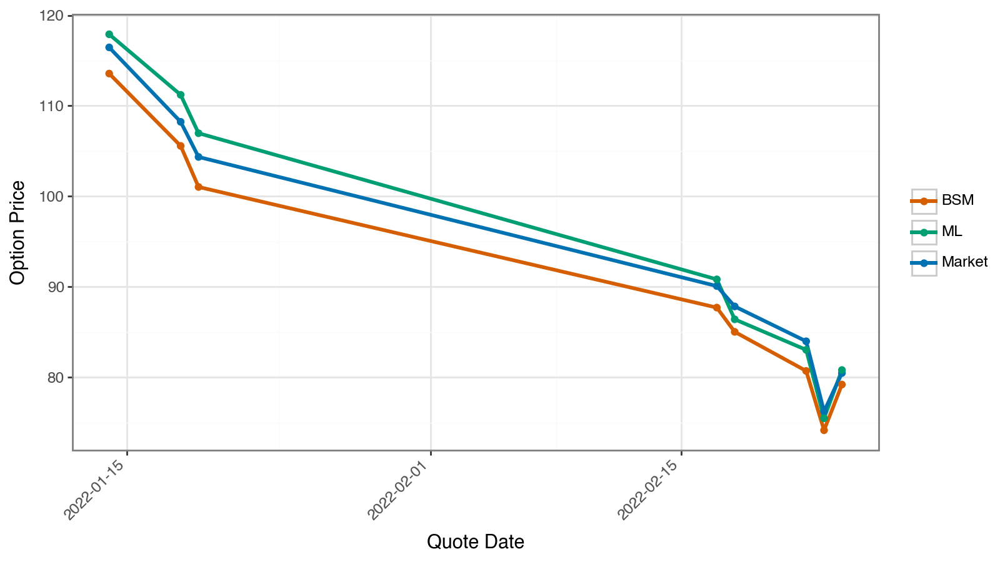

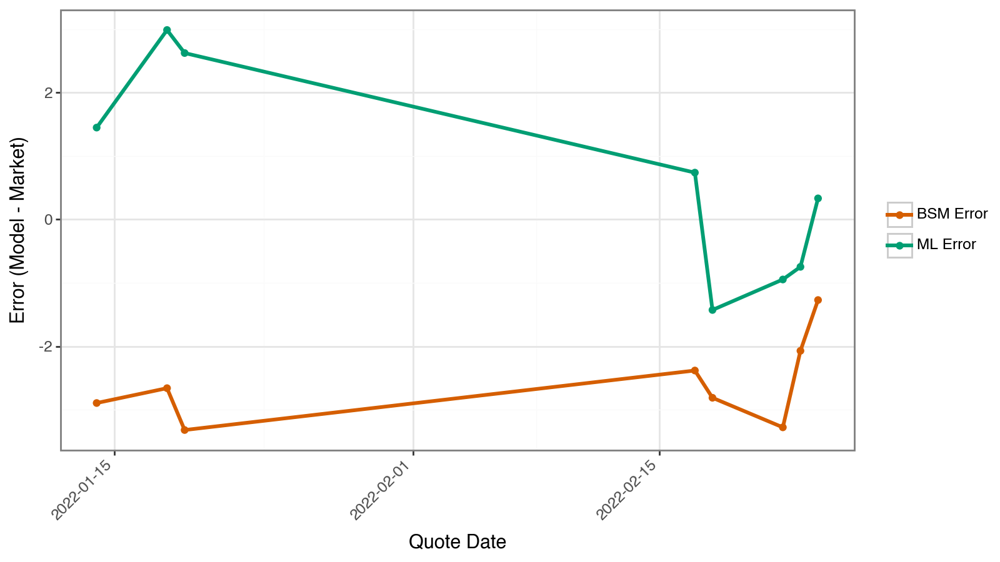

In [ ]:


fold_num = 108
strike_k = 350



start, end = [(row[1], row[2]) for row in test_dates if row[0] == fold_num][0]

#start, end = test_dates.loc[test_dates["Fold"] == fold_num, ["Start", "End"]].iloc[0]

#start, end = [(row[1], row[2]) for row in test_dates if row[0] == fold_num][0]

df_k = all_results[
    (all_results["K"] == strike_k) &
    (all_results["quotedate"] >= start) &
    (all_results["quotedate"] <= end)
].copy().sort_values("quotedate")


print(df_k.head())

if df_k.empty:
    print(f"No data for strike {strike_k} in fold {fold_num} test range.")
else:
    assert "T" in df_k.columns, "Missing 'T' in your all_results. It is required to uniquely identify contracts."

    #  Drop duplicates based on contract level key 
    df_k = df_k.drop_duplicates(subset=["quotedate", "K", "T"])

    #  PRICE PANEL 
    price_df = pd.melt(
        df_k,
        id_vars=["quotedate", "K", "T"],
        value_vars=["market_price", "bs_price", "ml_price"],
        var_name="Series",
        value_name="value"
    )
    price_df["Series"] = price_df["Series"].map({
        "market_price": "Market",
        "bs_price": "BSM",
        "ml_price": "ML"
    })
    price_df["panel"] = "Price"

    #  ERROR PANEL 
    df_k["bsm_error"] = df_k["bs_price"] - df_k["market_price"]
    df_k["ml_error"] = df_k["ml_price"] - df_k["market_price"]
    error_df = pd.melt(
        df_k,
        id_vars=["quotedate", "K", "T"],
        value_vars=["bsm_error", "ml_error"],
        var_name="Series",
        value_name="value"
    )
    error_df["Series"] = error_df["Series"].str.replace("_error", "").str.upper() + " Error"
    error_df["panel"] = "Error"

    combined = pd.concat([price_df, error_df], ignore_index=True)
    combined = combined.dropna(subset=["Series", "value", "quotedate"])
    combined["Series"] = combined["Series"].astype(str)
    combined["panel"] = combined["panel"].astype(str)

    custom_colors = {
         "Market":  "#0072B2",
        "BSM":       "#D55E00",
        "ML":       "#009E73",
        "BSM Error": "#D55E00",
        "ML Error": "#009E73"
    }

    #  Filter to a single contract: Pick a single T 
    T_target = df_k["T"].median()  # or select T manually  # come back here to change these for visuals
    contract_df = combined[combined["T"].between(T_target - 0.01, T_target + 0.01)]

    
    display(
        ggplot(contract_df[contract_df["panel"] == "Price"], aes(x='quotedate', y='value', color='Series')) +
        geom_line(size=1.2) +
        geom_point(size=1.5) +
        scale_color_manual(values=custom_colors) +
        theme_bw() +
        theme(
            legend_title=element_blank(),
            axis_text_x=element_text(rotation=45, hjust=1),
            figure_size=(8, 4.5)
        ) +
        labs(
            #title=f"Option Pricing: Strike {strike_k}, Fold {fold_num}, T ≈ {T_target:.2f}",
            x="Quote Date",
            y="Option Price"
        )
    )

    #  ERROR PLOT 
    display(
        ggplot(contract_df[contract_df["panel"] == "Error"], aes(x='quotedate', y='value', color='Series')) +
        geom_line(size=1.2) +
        geom_point(size=1.5) +
        scale_color_manual(values=custom_colors) +
        theme_bw() +
        theme(
            legend_title=element_blank(),
            axis_text_x=element_text(rotation=45, hjust=1),
            figure_size=(8, 4.5)
        ) +
        labs(
            #title=f"Model Errors: Strike {strike_k}, Fold {fold_num}, T ≈ {T_target:.2f}",
            x="Quote Date",
            y="Error (Model - Market)"
        )
    )


In [25]:
# # For the price panel
# dupes_price = combined[combined["panel"] == "Price"].duplicated(subset=["Series", "quotedate"], keep=False)
# print("Price Panel Duplicates:", dupes_price.sum())

# # For the error panel
# dupes_error = combined[combined["panel"] == "Error"].duplicated(subset=["Series", "quotedate"], keep=False)
# print("Error Panel Duplicates:", dupes_error.sum())


Price Panel Duplicates: 0
Error Panel Duplicates: 0


In [26]:
# print(price_df.groupby(['Series'])['quotedate'].nunique())


Series
BS        21
ML        21
Market    21
Name: quotedate, dtype: int64


In [27]:
# dupes = price_df.duplicated(subset=['Series', 'quotedate'])
# print("Duplicates:", dupes.sum())


Duplicates: 0


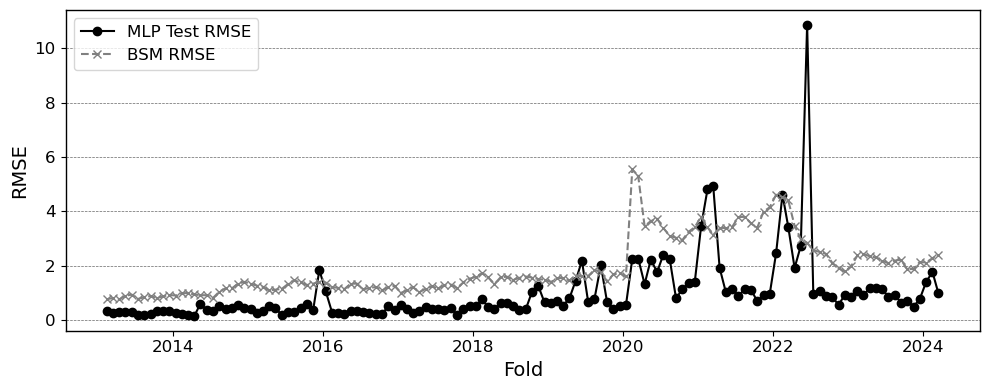

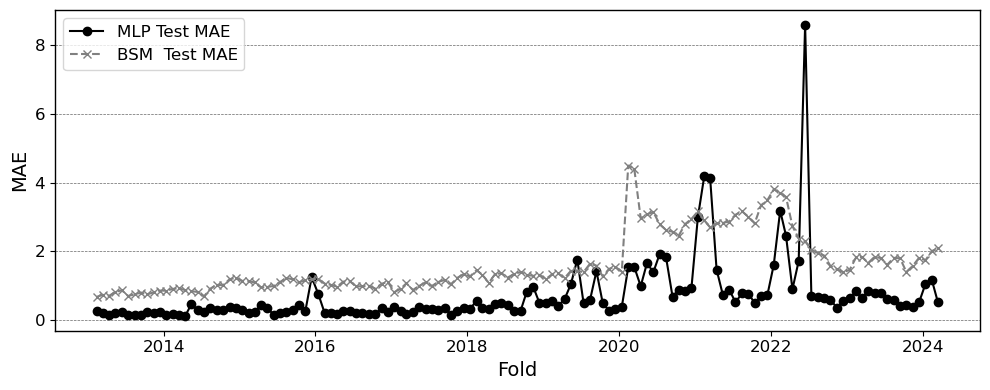

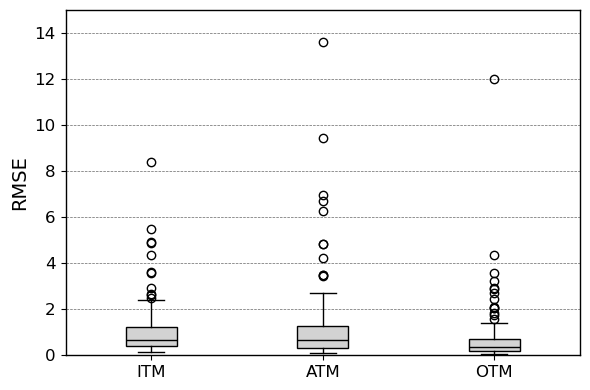

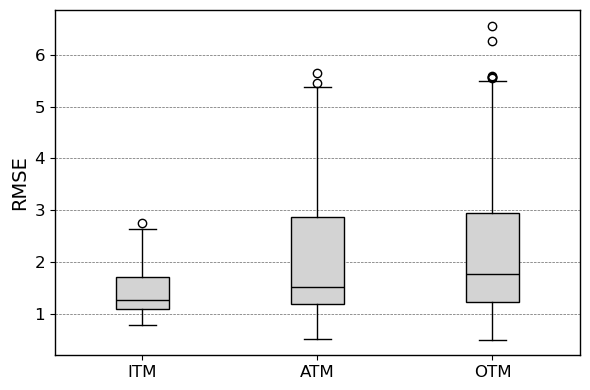

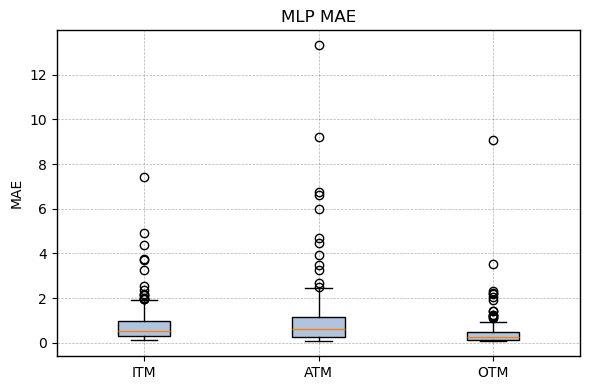

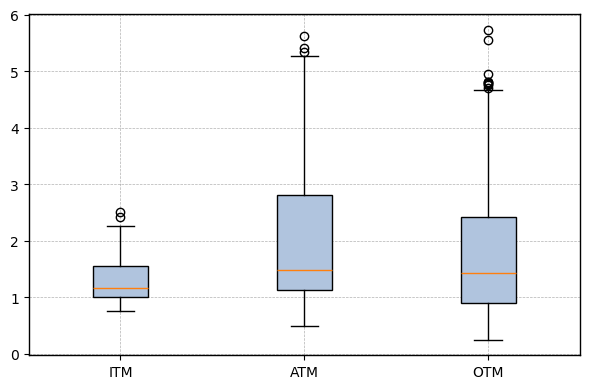

In [ ]:

import matplotlib.pyplot as plt
import numpy as np
test_dates = pd.DataFrame(test_dates, columns=["Fold", "Start", "End"])


# Apply theme_bw() 
def apply_theme_bw():
    plt.rcParams.update({
        'axes.facecolor': 'white',
        'figure.facecolor': 'white',
        'axes.edgecolor': 'black',
        'axes.linewidth': 1,
        'grid.color': 'black',
        'grid.linestyle': '--',
        'grid.linewidth': 0.5,
        'xtick.color': 'black',
        'ytick.color': 'black',
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'axes.labelsize': 14,
        'axes.titlesize': 16,
        'legend.fontsize': 12
    })

apply_theme_bw()

# MLP Test vs BS  RMSE 
plt.figure(figsize=(10, 4))
plt.plot(test_dates.iloc[:,1], mlp_test_rmse, label="MLP Test RMSE", color='black', linestyle='-', marker='o')
plt.plot(test_dates.iloc[:,1], bs_test_rmse,  label="BSM RMSE", color='grey', linestyle='--', marker='x')

plt.xlabel("Fold")
plt.ylabel("RMSE")
#plt.title("MLP Test vs BSM  RMSE")
plt.legend()
plt.grid(True, which='major', axis='y', alpha=0.6)
plt.tight_layout()
plt.show()

# MLP vs BS Test MAE
plt.figure(figsize=(10, 4))
plt.plot(test_dates.iloc[:,1], mlp_test_mae, label="MLP Test MAE", color='black', linestyle='-', marker='o')
plt.plot(test_dates.iloc[:,1], bs_test_mae,  label="BSM  Test MAE", color='grey', linestyle='--', marker='x')

plt.xlabel("Fold")
plt.ylabel("MAE")
#plt.title("MLP vs BSM Test MAE")
plt.legend()
plt.grid(True, which='major', axis='y', alpha=0.6)
plt.tight_layout()
plt.show()



plt.style.use('default')  

def apply_theme_bw():
    plt.rcParams.update({
        'axes.facecolor': 'white',
        'axes.edgecolor': 'black',
        'axes.linewidth': 1,
        'grid.color': 'black',
        'grid.linestyle': '--',
        'grid.linewidth': 0.5,
        'xtick.color': 'black',
        'ytick.color': 'black',
        'figure.facecolor': 'white',
    })

apply_theme_bw()

# MLP RMSE boxplot
plt.figure(figsize=(6, 4))
plt.boxplot([mlp_seg_rmse[s] for s in ["ITM", "ATM", "OTM"]],
            labels=["ITM", "ATM", "OTM"], patch_artist=True,
            boxprops=dict(facecolor='lightgrey', edgecolor='black'),
            medianprops=dict(color='black'))
#plt.title("MLP RMSE", fontsize=16)
plt.ylabel("RMSE", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 15)
plt.grid(True, which='major', axis='y', alpha=0.6)
plt.tight_layout()
plt.show()

# BSM RMSE boxplot
plt.figure(figsize=(6, 4))
plt.boxplot([bs_seg_rmse[s] for s in ["ITM", "ATM", "OTM"]],
            labels=["ITM", "ATM", "OTM"], patch_artist=True,
            boxprops=dict(facecolor='lightgrey', edgecolor='black'),
            medianprops=dict(color='black'))
#plt.title("BSM RMSE", fontsize=16)
plt.ylabel("RMSE", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='major', axis='y', alpha=0.6)
plt.tight_layout()
plt.show()




# Segment MAE boxplots
plt.figure(figsize=(6,4))
plt.boxplot([mlp_seg_mae[s] for s in ["ITM","ATM","OTM"]],
            labels=["ITM","ATM","OTM"], patch_artist=True,
            boxprops=dict(facecolor='lightsteelblue'))
plt.title("MLP MAE"); plt.ylabel("MAE")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(6,4))
plt.boxplot([bs_seg_mae[s] for s in ["ITM","ATM","OTM"]],
            labels=["ITM","ATM","OTM"], patch_artist=True,
            boxprops=dict(facecolor='lightsteelblue'))
#plt.title("BSM MAE"); plt.ylabel("MAE")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()




# epoch metrics DataFrame
epoch_df = pd.DataFrame(epoch_metrics)

In [ ]:
import numpy as np
import pandas as pd
from datetime import timedelta
from dateutil.relativedelta import relativedelta

first_date, last_date = pd.Timestamp("2012-02-14"), pd.Timestamp("2024-05-31")
train_months, test_months = 12, 2
atm_thresh = 0.01

#  test fold segment counts
max_start = last_date - relativedelta(months=train_months + test_months) + timedelta(days=1)
fold_starts = []
dt = first_date
while dt <= max_start:
    fold_starts.append(dt)
    dt += relativedelta(months=1)

counts = {"ITM": [], "ATM": [], "OTM": []}
for start in fold_starts:
    train_end  = start + relativedelta(months=train_months) - timedelta(days=1)
    test_start = train_end + timedelta(days=1)
    test_end   = test_start + relativedelta(months=test_months) - timedelta(days=1)

    fold_df = run[(run["quotedate"] >= test_start) & (run["quotedate"] <= test_end)]
    if fold_df.empty:
        continue

    seg = np.where(
        fold_df["moneyness"] >  atm_thresh, "ITM",
        np.where(fold_df["moneyness"] < -atm_thresh, "OTM", "ATM")
    )
    for s in counts:
        counts[s].append((seg == s).sum())

In [15]:
rows = []
for seg in ["ITM", "ATM", "OTM"]:
    rows.append({
        "Segment":      seg,
        "Avg Count":    np.mean(counts[seg]),
        "Std Count":    np.std(counts[seg], ddof=1),
        "MLP Mean RMSE": np.mean(mlp_seg_rmse[seg]),
        "MLP Std RMSE":  np.std( mlp_seg_rmse[seg], ddof=1),
        "MLP Mean MAE":  np.mean(mlp_seg_mae[seg]),
        "MLP Std MAE":   np.std( mlp_seg_mae[seg], ddof=1),
        "BSM Mean RMSE":  np.mean(bs_seg_rmse[seg]),
        "BSM Std RMSE":   np.std( bs_seg_rmse[seg], ddof=1),
        "BSM Mean MAE":   np.mean(bs_seg_mae[seg]),
        "BSM Std MAE":    np.std( bs_seg_mae[seg], ddof=1)
    })
summary_df = pd.DataFrame(rows)

# Display Tables
print(summary_df)

  Segment    Avg Count   Std Count  MLP Mean RMSE  MLP Std RMSE  MLP Mean MAE  \
0     ITM  1321.514925  559.694637       1.067702      1.167492      0.847610   
1     ATM   106.992537   48.164895       1.193769      1.790665      1.094115   
2     OTM   884.582090  526.943567       0.703905      1.234327      0.494410   

   MLP Std MAE  BSM Mean RMSE  BSM Std RMSE  BSM Mean MAE  BSM Std MAE  
0     1.006509       1.463503      0.487226      1.330559     0.432631  
1     1.740004       2.142733      1.422917      2.083774     1.415703  
2     0.913619       2.333712      1.523743      1.928596     1.358303  


In [ ]:
import numpy as np
import pandas as pd

def check_american_spy_no_arbitrage_final(
    df: pd.DataFrame,
    price_col: str = "market_price",
    date_col: str  = "quotedate",
    strike_col: str = "K",
    spot_col: str    = "S",
    time_col: str    = "T" 
) -> pd.DataFrame:
    """
    Checks for common no-arbitrage violations in American option data

    This function identifies unique contracts by strike and maturity
    and checks for violations of
    1.  Bounds: Price is between intrinsic value and the spot price.
    2.  Monotonicity in Strike: Price does not increase with the strike.
    3.  Convexity in Strike: Price-strike curve is convex.
    4.  Monotonicity in Spot: Price does not decrease with the spot price.
    

    """
    results = []
    TOL = 1e-9 # A small tolerance for floating point comparisons
    
    # Group by each unique trading day
    for date, day_grp in df.groupby(date_col):
        
        # Strike-Based and Boundary Checks (using all quotes from the day) ---
        grp_sorted_by_strike = day_grp.sort_values(by=strike_col)
        strikes = grp_sorted_by_strike[strike_col].values
        prices  = grp_sorted_by_strike[price_col].values
        # For boundary checks, we can use the day's first spot price as a reference
        S = day_grp[spot_col].iloc[0] 
        
        # Monotonicity in Strike: C(K1) >= C(K2) for K1 < K2
        mono_k_violations = np.sum(np.diff(prices) > TOL)
        
        # Convexity in Strike: C(K2) <= w*C(K1) + (1-w)*C(K3)
        #conv_k_violations = np.sum((prices[:-2] - 2*prices[1:-1] + prices[2:]) < -TOL)
        conv_k_violations = 0
        for i in range(1, len(strike_col)-1):
            w = (strike_col[i+1] - strike_col[i]) / (strike_col[i+1] - strike_col[i-1])
            if prices[i] - (w*prices[i-1] + (1-w)*prices[i+1]) < -TOL:
                conv_k_violations += 1

        
        # max(S-K, 0) <= C <= S
        intrinsic_value = np.maximum(S - strikes, 0)
        low_b_violations = np.sum(prices < intrinsic_value - TOL)
        high_b_violations = np.sum(prices > S + TOL)

        # Spot-Based Checks (requires grouping by unique contract) ---
        mono_s_violations_today = 0
        # A unique contract is defined by its strike and maturity.
        # We group the day's data by these two columns.
        for (k, t), contract_grp in day_grp.groupby([strike_col, time_col]):
            if len(contract_grp) > 1: # Need at least two quotes to check
                grp_sorted_by_spot = contract_grp.sort_values(by=spot_col)
                spot_prices = grp_sorted_by_spot[price_col].values
                # Monotonicity in Spot: C(S1) <= C(S2) for S1 < S2
                # A violation occurs if price decreases as spot increases.
                mono_s_violations_today += np.sum(np.diff(spot_prices) < -TOL)

        results.append({
            date_col: date,
            "n_quotes": len(day_grp),
            "lower_bound_violations": low_b_violations,
            "upper_bound_violations": high_b_violations,
            "mono_strike_violations": mono_k_violations,
            "convex_strike_violations": conv_k_violations,
            "mono_spot_violations": mono_s_violations_today
        })
    
    return pd.DataFrame(results)

/opt/anaconda3/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


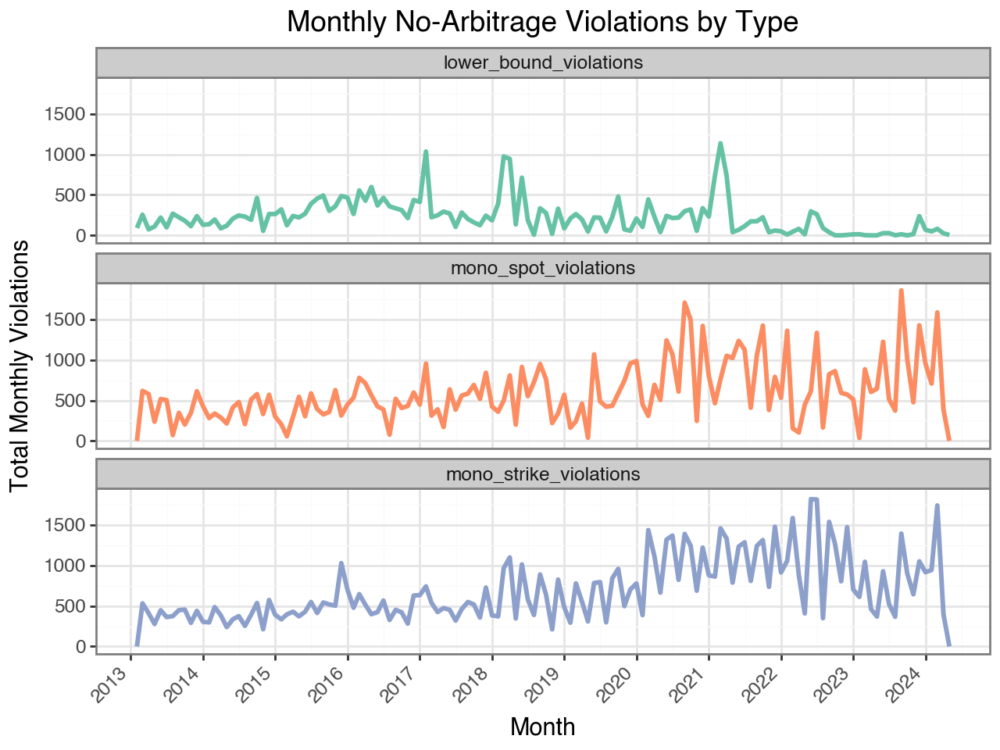

In [ ]:
import pandas as pd
from plotnine import (
    ggplot, aes, geom_line, labs,
    theme_bw, theme, element_text, facet_wrap
)

summary = all_results[[
    "quotedate",
    "K",            # strike
    "S",            # underlying price
    "T",            # time to maturity
    "ml_price",
    "market_price",
    "bs_price"
]].copy()

violations = check_american_spy_no_arbitrage_final(
    summary,
    price_col="ml_price",   
    date_col="quotedate",
    strike_col="K",
    time_col="T",
    spot_col="S"
)


violation_cols = [
    'lower_bound_violations',
    #'upper_bound_violations',
    'mono_strike_violations',
    #'convex_strike_violations',
    'mono_spot_violations'
]

# Aggregate daily counts
daily = (
    violations
    .groupby('quotedate')[violation_cols]
    .sum()
    .reset_index()
)

# Melt into a long format for plotting
summary_long = (
    daily
    .melt(
       id_vars='quotedate',
       var_name='Violation_Type',
       value_name='Count'
    )
    .sort_values(['Violation_Type', 'quotedate'])
)

# Roll up the daily counts to a monthly total
monthly = (
    summary_long
    .assign(
      month=pd.to_datetime(summary_long['quotedate'])
                .dt.to_period('M')
                .dt.to_timestamp()
    )
    .groupby(['month', 'Violation_Type'])['Count']
    .sum()
    .reset_index()
)

final_facet_plot = (
    ggplot(monthly, aes(x='month', y='Count', color='Violation_Type'))
    + geom_line(size=1.2)
    + facet_wrap('~Violation_Type',  ncol=1)
    + labs(
        x='Month',
        y='Total Monthly Violations',
        title='Monthly No‐Arbitrage Violations by Type'
      )
    + theme_bw()
    + theme(
        axis_text_x=element_text(rotation=45, hjust=1),
        legend_position='none'
      )
    + scale_x_datetime(date_breaks="1 year", date_labels="%Y")
    + scale_color_brewer(type='qual', palette='Set2')


)

final_facet_plot